# Capstone Project: House Price Prediction


## INDEX:


- PART I: INTRODUCTION AND UNIVARIATE AND BIVARIATE EXPLORATORY DATA ANALYSIS (EDA).


- PART II: DATA PRE-PROCESSING, DATA ENGINEERING AND OUTLIERS’ TREATMENT. NEW VARIABLES’ EDA.


- PART III: BUILDING A MODEL. BASIC DECISION TREE REGRESSION MODEL AND IMPORTANT FEATURES.


- PART IV: IMPROVING OUR INITIAL MODEL WITH HYPERPARAMETER TUNING AND MACHINE LEARNING ALGORITHMS. CHECKING LINEAR REGRESSION ASSUMPTIONS.


- PART V: CHOOSING THE BEST MODEL.


- PART VI: BUSINESS RECOMMENDATIONS.



# PART I: DATA ANALYSIS

## Context 

Housing prices are an important reflection of the economy, and housing price ranges are of great
interest for both buyers and sellers. Ask a home buyer to describe their dream house, and they
probably won’t begin with the height of the basement ceiling or the proximity to an east-west
railroad. A house value is simply more than location and square footage. Like the features that make
up a person, an educated party would want to know all aspects that give a house its value. For
example, you want to sell a house and you don’t know the price which you may expect—it can’t be
too low or too high. To find house price you usually try to find similar properties in your
neighborhood and based on gathered data you will try to assess your house price.


## Objective
The objective of this problem statement is to predict the housing prices of a town or a suburb based
on the features of the locality provided and identify the most important features to consider while
predicting the prices.


## Data Dictionary
This dataset has 23 features, price being the target variable. The details of all the features are given
below:

● cid: a notation for a house

● dayhours: Date house was sold

● price: Price is prediction target (in $)

● room_bed: Number of Bedrooms per house

● room_bath: Number of bathrooms per bedrooms

● living_measure: square footage of the home

● lot_measure: square footage of the lot

● ceil: Total floors (levels) in house

● coast: House which has a view to a waterfront (0 - No, 1 - Yes)

● sight: Has been viewed

● condition: How good the condition is (Overall out of 5)

● quality: grade given to the housing unit, based on grading system

● ceil_measure: square footage of house apart from basement

● basement_measure: square footage of the basement


● yr_built: Built Year

● yr_renovated: Year when house was renovated

● zipcode: zip code

● lat: Latitude coordinate

● long: Longitude coordinate

● living_measure15: Living room area in 2015 (implies-- some renovations) This might or might
not have affected the lot size area

● lot_measure15: lotSize area in 2015 (implies-- some renovations)

● furnished: Based on the quality of room (0 - No, 1 - Yes)

● total_area: Measure of both living and lot



# 1.Importing libraries

In [1]:
#for data manipulation
import pandas as pd
import numpy as np
# For data visualization 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# To suppress warning messages
import warnings
warnings.filterwarnings("ignore")

# To set maximum number of columns and rows 
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)

In [2]:

# to plot coordinates
import plotly.express as px
# to impute missing values with KNNImputer
from sklearn.impute import KNNImputer
# for scaling variables 
from sklearn.preprocessing import MinMaxScaler
# to split data into train and test
from sklearn.model_selection import train_test_split

In [3]:
#To built a regression model 
from sklearn.tree import DecisionTreeRegressor
#To improve the model with ensemble techniques
from sklearn.ensemble import BaggingRegressor,RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, StackingRegressor
from xgboost import XGBRegressor
# importing metrics to check model performance
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# to perform hyperparameter tuning with ramdom and  fixed number of iterations per search
from sklearn.model_selection import RandomizedSearchCV
#to iniciate ramdomized search
from sklearn.linear_model import LinearRegression
# to implement cross validation
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import StackingRegressor

In [4]:
# To test linear regression assumptions
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor# to apply VIF check for multicollinearity
import pylab# to use QQ plot residuas to check the normality of residuals distribution.
from statsmodels.compat import lzip # to perform the goldfeldquandt test for heterostedacidity
# to check residuals normality for linear regression
import pylab
import scipy.stats as stats

# 2.Loading Data


In [5]:
# Loading the dataset
data=pd.read_excel(r'C:\Users\charo\Downloads\House+Price+Prediction+-+Dataset (2).xlsx',sheet_name='innercity')

In [6]:
# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.2f" % x)

In [7]:
#checking a sample of the data
data.sample(10, random_state=1)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
15544,8718500275.00,20140715T000000,390000.00,3.00,2.75,1950.00,12240.00,1.00,0.00,0.00,3.00,7.00,1250.00,700.00,1956.00,0.00,98028.00,47.74,-122.26,1880.00,12000.00,0.00,14190.00
17454,9485920120.00,20140829T000000,290000.00,4.00,2.50,2340.00,52272.00,2.00,0.00,0.00,2.00,8.00,2340.00,0.00,1978.00,0.00,98042.00,47.35,-122.09,2480.00,40500.00,0.00,54612.00
21548,1310430400.00,20140513T000000,455000.00,4.00,2.50,3360.00,7685.00,2.00,0.00,0.00,3.00,9.00,3360.00,0.00,2001.00,0.00,98058.00,47.44,-122.11,3060.00,6567.00,1.00,11045.00
3427,4109600195.00,20140718T000000,524000.00,4.00,2.75,2310.00,5000.00,1.50,0.00,0.00,5.00,8.00,1480.00,830.00,1908.00,0.00,98118.00,47.55,-122.27,1100.00,5000.00,0.00,7310.00
8809,7282300095.00,20140709T000000,295000.00,2.00,1.00,800.00,6500.00,1.00,0.00,0.00,4.00,6.00,800.00,0.00,1953.00,0.00,98133.00,47.76,-122.36,1220.00,7000.00,0.00,7300.00
3294,475000510.00,20141118T000000,594000.00,3.00,1.00,1320.00,5000.00,1.00,0.00,0.00,4.00,7.00,1090.00,230.00,1920.00,0.00,98107.00,47.67,-122.36,1700.00,5000.00,0.00,6320.00
275,4046710180.00,20150325T000000,660000.00,3.00,3.50,3600.00,37982.00,2.00,0.00,0.00,4.00,8.00,3600.00,0.00,1996.00,0.00,98014.00,47.70,-121.92,2050.00,18019.00,0.00,41582.00
8736,538000030.00,20140730T000000,272500.00,3.00,2.00,1540.00,6250.00,1.00,0.00,0.00,3.00,7.00,1540.00,0.00,1998.00,0.00,98038.00,47.35,-122.03,2070.00,6250.00,0.00,7790.00
6161,2724200705.00,20141212T000000,95000.00,2.00,1.00,800.00,8550.00,1.00,0.00,0.00,3.00,7.00,800.00,0.00,1947.00,0.00,98198.00,47.41,-122.29,1490.00,8550.00,0.00,9350.00
19832,7771300085.00,20150309T000000,411500.00,3.00,1.00,1130.00,8159.00,1.00,0.00,0.00,4.00,7.00,1130.00,0.00,1954.00,0.00,98133.00,47.74,-122.33,1570.00,8162.00,0.00,9289.00


In [8]:
#Creating a copy of the data
df=data.copy()
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940.00,20150427T000000,600000.00,4.00,1.75,3050.00,9440.00,1.00,0.00,0.00,3.00,8.00,1800.00,1250.00,1966.00,0.00,98034.00,47.72,-122.18,2020.00,8660.00,0.00,12490.00
1,3145600250.00,20150317T000000,190000.00,2.00,1.00,670.00,3101.00,1.00,0.00,0.00,4.00,6.00,670.00,0.00,1948.00,0.00,98118.00,47.55,-122.27,1660.00,4100.00,0.00,3771.00
2,7129303070.00,20140820T000000,735000.00,4.00,2.75,3040.00,2415.00,2.00,1.00,4.00,3.00,8.00,3040.00,0.00,1966.00,0.00,98118.00,47.52,-122.26,2620.00,2433.00,0.00,5455.00
3,7338220280.00,20141010T000000,257000.00,3.00,2.50,1740.00,3721.00,2.00,0.00,0.00,3.00,8.00,1740.00,0.00,2009.00,0.00,98002.00,47.34,-122.21,2030.00,3794.00,0.00,5461.00
4,7950300670.00,20150218T000000,450000.00,2.00,1.00,1120.00,4590.00,1.00,0.00,0.00,3.00,7.00,1120.00,0.00,1924.00,0.00,98118.00,47.57,-122.28,1120.00,5100.00,0.00,5710.00


In [9]:
# Checking the shape of the data frame
S=df.shape

In [10]:
print(f'The data contains {S[0]} rows and {S[1]} columns')

The data contains 21613 rows and 23 columns


In [11]:
# Checking for duplicates
df.duplicated().any()

False

- There are not duplicate values in the data set.

In [12]:
#Checking for null values in the data
df.isnull().sum()

cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 42
coast                 1
sight                57
condition            57
quality               1
ceil_measure          1
basement              1
yr_built              1
yr_renovated          0
zipcode               0
lat                   0
long                  0
living_measure15    166
lot_measure15        29
furnished            29
total_area           29
dtype: int64

As we can see there are several columns that contains null values. We will need to address this issue later on.

- Variable room_bed contains 108 null rows.
- Variable room_bath contains 108 null rows.       
- Variable living_measure contains 17 null rows.  
- Variable lot_measure contains 42 null rows
- Variable ceil contains 42 null rows.       
- Variable coast contains 1 null row.
- Variable sight contains 57 null rows.
- Variable condition contains 57 null rows.         
- Variable quality contains 1 null row.
- Variable ceil_measure contains 1 null row
- Variable basement contains 1 null row.       
- Variable yr_built contains 1 null row.          
- Variable living_measure15 contains 166 null rows.  
- Variable lot_measure15 contains 29 null rows.    
- Variable furnished contains 29 null rows.   
- Variable total_area contains 29 null rows.

There are different options to fix the null values but mostly depend on the number of rows that are empty or null. If we only have a few rows we can just drop them but in this case we have variables that contain up to 166 null values; it not a good idea to eliminate so much data because we will be losing valuable information.

In [13]:
# Checking the data type of each variable.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  float64
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  float64
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  float64
 16  zipcode           21613 non-null  float6

In [14]:
#selecting object type variables
df.select_dtypes('object').columns

Index(['dayhours', 'ceil', 'coast', 'condition', 'yr_built', 'long',
       'total_area'],
      dtype='object')

In [15]:
#selecting object type variables
df.select_dtypes(np.number).columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'quality', 'ceil_measure', 'basement',
       'yr_renovated', 'zipcode', 'lat', 'living_measure15', 'lot_measure15',
       'furnished'],
      dtype='object')

The data set contains different types of variables: numeric and object type.
- The numeric variables of the data set are all float variables:'cid', 'price', 'room_bed', 'room_bath', 'living_measure', 'furnished'.
- The object type variables are not numeric, they are usually strings: 'dayhours', 'ceil', 'coast', 'condition', 'yr_built','long','total_area'.
- We need to change the object data type of these variables into categories, so we can operate with them. Object type variables do not support many functions and are extremely difficult to use for modeling and analysis.


In [16]:
# Changing object type variables into categories by using a for loop.
# list of the variables to change to categories
list_cat=df.select_dtypes('object').columns

#Applying a for loop to change each object variable from the list above into category type.
for cat in list_cat:
    df[cat]=df[cat].astype('category')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   cid               21613 non-null  float64 
 1   dayhours          21613 non-null  category
 2   price             21613 non-null  float64 
 3   room_bed          21505 non-null  float64 
 4   room_bath         21505 non-null  float64 
 5   living_measure    21596 non-null  float64 
 6   lot_measure       21571 non-null  float64 
 7   ceil              21571 non-null  category
 8   coast             21612 non-null  category
 9   sight             21556 non-null  float64 
 10  condition         21556 non-null  category
 11  quality           21612 non-null  float64 
 12  ceil_measure      21612 non-null  float64 
 13  basement          21612 non-null  float64 
 14  yr_built          21612 non-null  category
 15  yr_renovated      21613 non-null  float64 
 16  zipcode           2161

- As we can see, there are not any more object type variables. Also the memory usage has decreased after the data type modification.
- In the case of the 'dayhours'variable we need to convert it to a datatime variable in order to find additional information.


In [18]:
# Creating a variable with the data of sale
df['dayhours']=pd.to_datetime(df.dayhours)

In [19]:
#Creating a variable with month of sale
df['date_month']=df['dayhours'].dt.month.astype('category')

In [20]:
#Creating a variable with year of sale
df['date_year']=df['dayhours'].dt.year.astype('category')

In [21]:
#Creatubg a variable with day of sale
df['date_day']=df['dayhours'].dt.day.astype('category')

In [22]:
# Checking data after adding new variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   cid               21613 non-null  float64 
 1   dayhours          21613 non-null  category
 2   price             21613 non-null  float64 
 3   room_bed          21505 non-null  float64 
 4   room_bath         21505 non-null  float64 
 5   living_measure    21596 non-null  float64 
 6   lot_measure       21571 non-null  float64 
 7   ceil              21571 non-null  category
 8   coast             21612 non-null  category
 9   sight             21556 non-null  float64 
 10  condition         21556 non-null  category
 11  quality           21612 non-null  float64 
 12  ceil_measure      21612 non-null  float64 
 13  basement          21612 non-null  float64 
 14  yr_built          21612 non-null  category
 15  yr_renovated      21613 non-null  float64 
 16  zipcode           2161

## 3.EDA

## 3.1 SUMMARY STATISTICS

### a.CATEGORICAL VARIABLES

In [23]:
df.describe(include='category')

,dayhours,ceil,coast,condition,yr_built,long,total_area,date_month,date_year,date_day
count,21613,21571.00,21612.00,21556.00,21612.00,21613.00,21584,21613,21613,21613
unique,372,7.00,3.00,6.00,117.00,753.00,11145,12,2,31
top,2014-06-23 00:00:00,1.00,0.00,3.00,2014.00,-122.29,$,5,2014,23
freq,142,10647.00,21421.00,13978.00,559.00,116.00,39,2414,14633,906


**a.1 Exploring categorical data**

In [24]:
df[df['total_area']=='$']

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
128,1954440080.00,2015-01-29,532000.00,3.00,2.50,1830.00,8022.00,2.00,0.00,0.00,3.00,8.00,1830.00,0.00,1987.00,0.00,98074.00,47.62,-122.04,2030.00,7736.00,0.00,$,1,2015,29
402,1257200290.00,2014-05-12,910000.00,3.00,2.00,2700.00,6120.00,1.00,0.00,0.00,4.00,8.00,1350.00,1350.00,1962.00,0.00,98115.00,47.67,-122.33,1700.00,4590.00,0.00,$,5,2014,12
578,191100250.00,2015-03-20,750000.00,4.00,2.25,2160.00,9525.00,1.00,0.00,0.00,3.00,8.00,1080.00,1080.00,1961.00,0.00,98040.00,47.57,-122.22,2780.00,9525.00,0.00,$,3,2015,20
1020,3034200410.00,2015-03-30,430000.00,3.00,1.00,940.00,12521.00,1.50,0.00,0.00,4.00,7.00,940.00,0.00,1949.00,0.00,98133.00,47.72,-122.33,1920.00,9046.00,0.00,$,3,2015,30
1159,1853000300.00,2015-02-24,875000.00,3.00,2.75,3270.00,39586.00,1.50,0.00,0.00,3.00,11.00,3270.00,0.00,1988.00,0.00,98077.00,47.73,-122.08,3480.00,35998.00,1.00,$,2,2015,24
1192,4137020360.00,2014-07-22,265000.00,3.00,2.50,1780.00,6527.00,2.00,0.00,0.00,3.00,8.00,1780.00,0.00,1989.00,0.00,98092.00,47.26,-122.22,2040.00,8840.00,0.00,$,7,2014,22
2211,4055700784.00,2014-08-15,720000.00,4.00,2.50,3420.00,17038.00,2.00,0.00,0.00,3.00,9.00,3420.00,0.00,2007.00,0.00,98034.00,47.72,-122.24,2520.00,14190.00,1.00,$,8,2014,15
2278,2817910220.00,2014-12-16,465000.00,4.00,2.50,2820.00,39413.00,2.00,0.00,0.00,4.00,9.00,2820.00,0.00,1989.00,0.00,98092.00,47.31,-122.10,2910.00,39413.00,1.00,$,12,2014,16
3308,9232400055.00,2014-09-17,279200.00,1.00,1.00,640.00,6350.00,1.00,0.00,0.00,3.00,5.00,640.00,0.00,1939.00,0.00,98117.00,47.70,-122.36,1270.00,6350.00,0.00,$,9,2014,17
3475,1245001820.00,2015-04-29,776500.00,4.00,1.50,2290.00,10372.00,1.00,0.00,0.00,3.00,7.00,1510.00,780.00,1965.00,1987.00,98033.00,47.69,-122.20,1900.00,8109.00,0.00,$,4,2015,29


In [25]:
#Changing the simbol '$' to null
df=df.replace('$',np.nan)

**Observations:**

- We can see that some variables include dollar sybol as a value for unknown information. In this case we can see variable 'lat' and 'total area' show the character'$'.

- In order to work with the data, let's convert all dlollar symbols in null values.

**a.1.Changing null values to 'nan'**

In [26]:
#replacing empty space with nan values
df=df.replace(' ', np.nan)

**Observations:**
- We can see we have null values, empty rows for some variables so we are making sure all null values are replaced with nan values.

**a.3.Changing data types**

In [27]:
#changing continues variables 'long' and 'total_area' data type
list_cont= ['long','total_area']
for i in list_cont:
    df[i]=df[i].astype('float')

In [28]:
# Changing  zipcode  and furnished data type to categories
list_c= ['zipcode','furnished']
for i in list_c:
    df[i]=df[i].astype('category')

**observation**
- Variables 'long','total_area' are continuous in nature so once that we fixed the null value issue, we can transform them into numeric variables.
- variables 'zipcode'and'furnished' should be considered categories because in nature they are all category data type.

In [29]:
# Summary statistics after data type change
df.describe(include='category')

,dayhours,ceil,coast,condition,yr_built,zipcode,furnished,date_month,date_year,date_day
count,21613,21541.00,21582.00,21528.00,21598.00,21613.00,21584.00,21613,21613,21613
unique,372,6.00,2.00,5.00,116.00,70.00,2.00,12,2,31
top,2014-06-23 00:00:00,1.00,0.00,3.00,2014.00,98103.00,0.00,5,2014,23
freq,142,10647.00,21421.00,13978.00,559.00,602.00,17338.00,2414,14633,906


In [30]:
#create empty list to store the count of different values for each category in percentage
list_desc_cat=['dayhours', 'ceil', 'coast', 'condition', 'yr_built','date_month','date_year','date_day','zipcode', 'furnished']
value_c=[]
for col in list_desc_cat:
    r=df[col].value_counts(dropna=False, normalize= True).sort_values(ascending=False)*100
    value_c.append(r)
    print(r)
    print('-----------------')


2014-06-23 00:00:00   0.66
2014-06-26 00:00:00   0.61
2014-06-25 00:00:00   0.61
2014-07-08 00:00:00   0.59
2015-04-27 00:00:00   0.58
                      ... 
2015-05-15 00:00:00   0.00
2014-08-03 00:00:00   0.00
2014-07-27 00:00:00   0.00
2014-11-02 00:00:00   0.00
2015-05-27 00:00:00   0.00
Name: dayhours, Length: 372, dtype: float64
-----------------
1.0   49.26
2.0   37.99
1.5    8.81
3.0    2.82
2.5    0.74
NaN    0.33
3.5    0.04
Name: ceil, dtype: float64
-----------------
0.0   99.11
1.0    0.74
NaN    0.14
Name: coast, dtype: float64
-----------------
3.0   64.67
4.0   26.16
5.0    7.84
2.0    0.79
NaN    0.39
1.0    0.14
Name: condition, dtype: float64
-----------------
2014.0   2.59
2006.0   2.10
2005.0   2.08
2004.0   2.00
2003.0   1.95
1977.0   1.93
2007.0   1.93
1978.0   1.79
1968.0   1.76
2008.0   1.70
1967.0   1.62
1979.0   1.59
1959.0   1.55
1990.0   1.48
1962.0   1.44
2001.0   1.41
1954.0   1.41
1987.0   1.36
1989.0   1.34
1969.0   1.30
1988.0   1.25
1955.0   1.24


**Observations**:

- There are 10 categories in the data set and many of the variables contain missing values.
- The data refers to the transaction in 2014 and 2015; the number of transactions in 2014 doubled the transaction registered for 2015.
- ‘Dayhours’ variable shows 372 different date of sales, with 2014-06-23 being the date that registered most of the sales.
- When analyzing the day of the month with greater number of transactions, clearly the 23 seems to be the most frequent for the overall data set.
- May is the month that registered the greatest number of house sales.
- Cell shows the number of floors in a house, with a range from 1 to 3.5, being 1 floor home ('ranch style', the most frequent type of home sold.
- Most of the inventory sold where houses not near the waterfront, and that makes sense since there are not that many houses with a waterfront view.
- Most of the houses are in intermediate to good condition (rated 3 and 4 out of 10).
- The years in which each property was built vary greatly, from 1900 to 2014. 2014 is the year in which most of the sold properties were built.w
- The area, or zip code with more house sale for the data set in the given period is zip code 98103 (Seattle). In the data we have 70 different area codes.
- Most of hte houses sold during the period were not sold with the furniture included.


### b.NUMERIC VARIABLES

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
cid,21613.00,4580301520.86,2876565571.31,1000102.00,2123049194.00,3904930410.00,7308900445.00,9900000190.00
price,21613.00,540182.16,367362.23,75000.00,321950.00,450000.00,645000.00,7700000.00
room_bed,21505.00,3.37,0.93,0.00,3.00,3.00,4.00,33.00
room_bath,21505.00,2.12,0.77,0.00,1.75,2.25,2.50,8.00
living_measure,21596.00,2079.86,918.50,290.00,1429.25,1910.00,2550.00,13540.00
lot_measure,21571.00,15104.58,41423.62,520.00,5040.00,7618.00,10684.50,1651359.00
sight,21556.00,0.23,0.77,0.00,0.00,0.00,0.00,4.00
quality,21612.00,7.66,1.18,1.00,7.00,7.00,8.00,13.00
ceil_measure,21612.00,1788.37,828.10,290.00,1190.00,1560.00,2210.00,9410.00
basement,21612.00,291.52,442.58,0.00,0.00,0.00,560.00,4820.00


In [32]:
# checking discrete variables countsin percentage
list_disc_var=['quality','sight','room_bath','room_bed','yr_renovated']
#creating empty list to store the counts of each value
count_list=[]
for col in list_disc_var:
    s=df[col].value_counts(dropna=False, normalize=True).sort_values(ascending=False)*100
    count_list.append(s)
    print(s)
    print ('*****')

7.00    41.55
8.00    28.07
9.00    12.10
6.00     9.43
10.00    5.25
11.00    1.85
5.00     1.12
12.00    0.42
4.00     0.13
13.00    0.06
3.00     0.01
1.00     0.00
NaN      0.00
Name: quality, dtype: float64
*****
0.00   89.93
2.00    4.44
3.00    2.36
1.00    1.54
4.00    1.47
NaN     0.26
Name: sight, dtype: float64
*****
2.50   24.79
1.00   17.72
1.75   14.02
2.25    9.43
2.00    8.87
1.50    6.66
2.75    5.45
3.00    3.47
3.50    3.36
3.25    2.72
3.75    0.72
4.00    0.62
NaN     0.50
4.50    0.46
4.25    0.36
0.75    0.33
4.75    0.11
5.00    0.10
5.25    0.06
0.00    0.05
5.50    0.05
1.25    0.04
6.00    0.03
5.75    0.02
0.50    0.02
6.75    0.01
8.00    0.01
6.50    0.01
6.25    0.01
7.50    0.00
7.75    0.00
Name: room_bath, dtype: float64
*****
3.00    45.19
4.00    31.71
2.00    12.71
5.00     7.38
6.00     1.25
1.00     0.91
NaN      0.50
7.00     0.18
8.00     0.06
0.00     0.06
9.00     0.03
10.00    0.01
33.00    0.00
11.00    0.00
Name: room_bed, dtype: float64
**

**Observations**

- We can see that many variables contain missing values in this section as well, this issue will be address later.
- Variable 'cid' refers to the identification number of each house, this variable does not provide any relevant information for our model.
- The mean price for the data set is 540182 dollars, which is greater than the median value (450000 dollars), so we can expect a right-skewed distribution. We can appreciate outliers in both extreme of the distribution since the minimum value is much lower that the 25th percentile and the same is true for the maximum value and the 75th percentile of the distribution.
- The median number of bedrooms for the sold houses in the data set is 3, while the mean value is slightly higher (3.3) due to the present of outlier on the upper extreme of the distribution. The maximum of bedrooms in the data set is 33 and the minimum is 0 bedroom (studio type properties, or maybe just unfinished project or piece of land). This distribution is also right skewed.
- When looking at the number of bathrooms per house, we can see 2 is the average for the overall data set. The maximum number of bathrooms is 8, obviously this is related to the number of bedrooms, and the minimum value observe is 0. We would need to do further research to find out it the properties with no bathrooms are properties in bad shape or pieces of land to create new residences
- living_measure variable refers to the living space of each property, including basement,and it is also right skewed, due to the present of outliers that affect the average value. The median value of the living space is ,1910.00 square foot.
- Variable lot_measure  refers to the size of the entire property, taking into account the outdoor space.This size varies widely since we can see the minimum value is 520 square feet and the maximum is 1,651,359, with an average value of 15,104 squared footage. This distribution is very high skewed.
- Sight refers to the number of times that a property was visited ; most of the properties where not visited yet.
- Most of the data coordinates show latitude around 47.5 and longitude -122.2. The area where the houses are located is near Seattle, Washington State, in USA.
- Quality variable goes from 1 to 13 based on the characteristic of each house. The average house quality for the data give is around 7 to 7.5.
- ceil_measure shows the square footage of the living space without the basement. The average square footage is 1788 for the data, this is slightly greater than the median value, so this distribution is right skewed with outliers in both extremes.
- The mean square footage of the variable basement is 291 (basement_measure), while the median value is 0. This distribution is highly skewed.
- Most of the houses have not been renovated. The year with more renovation was 2014.
- The variable living_measure15, shows that the average living room space for the houses in the data set is 1987 squared footage. we can also see a minimum value of 399 and a maximum value of 6,210 squared footage.
- lot_measure15 is referring to the size of the lot in 2015 without the living space. This distribution is highly right-skewed due to the present of outliers on the upper values. we can see that the mean value of the distribution is 12766 square footage while the median value is only 7,620.
- The total area of the property includes the size of the lot and the living area. In this case, the distribution is very high skewed. The mean total area footage is 17,192, while the median value is a bit more than 9500.There are outliers present in both extremes of the distribution.


## 3.2 UNIVARIATE ANALYSIS

### a. Variable 'cid'

In [33]:
df['cid'].count().sum()

21613

**Observations:**

- We have a cid value per house, so this is only an identification number for each property. it does not give any interesting information for the analysis so we will drop it.

### b.Variable 'price'

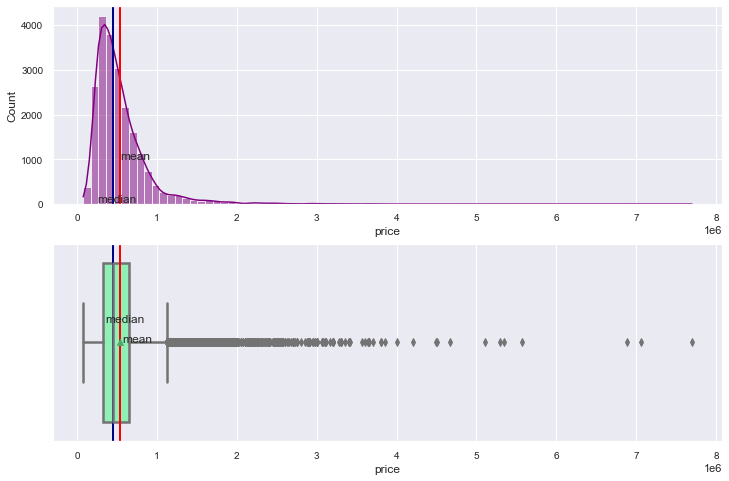

In [34]:
plt.figure(figsize=(12, 8))  # plot size
sns.set(font_scale=1)
plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['price'], stat="count", color="purple", bins=80, kde=True)
plt.axvline(x=450000, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=540182, linewidth=2, color="red")  # we draw the mean value
plt.text(x=250000, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=540182, y=1000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=10)
plt.yticks(size=10)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['price'], showmeans=True, linewidth=2.5, palette="rainbow",
)
plt.axvline(x=450000, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=540182, linewidth=2, color="red")  # we draw the mean value
plt.text(x=350000, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=560182, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=10)  # change size x axis
plt.yticks(size=10)  # change size y axis
plt.show()


**Observations:**
    
- Price varibles is right-skewed and we can see lots of outliers, with a maximum price near to 8 million dollars.
- The average price value is within the range of 450,000 to 550,000 dollars.

### c.Variable 'living_measure'

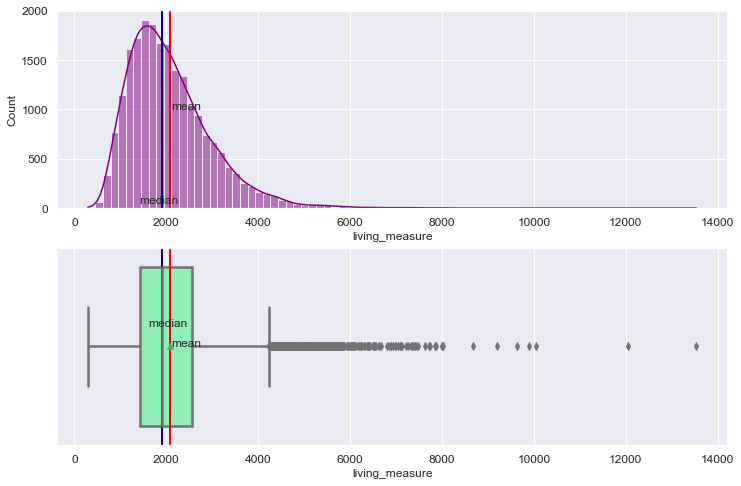

In [35]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['living_measure'], stat="count", color="purple", bins=80, kde=True)
plt.axvline(x=1910, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=2079, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1400, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=2100, y=1000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['living_measure'], showmeans=True, linewidth=2.5, palette="rainbow",
)
plt.axvline(x=1910, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=2079, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1600, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=2100, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**
    
    
- Living_measure refers to the living space (the house including basement) is right skewed because of the present of outliers in the upper extreme values of the distribution.
- The median value and mean value are 1910 and 2079 respectively. 



### d.Variable 'lot_measure'

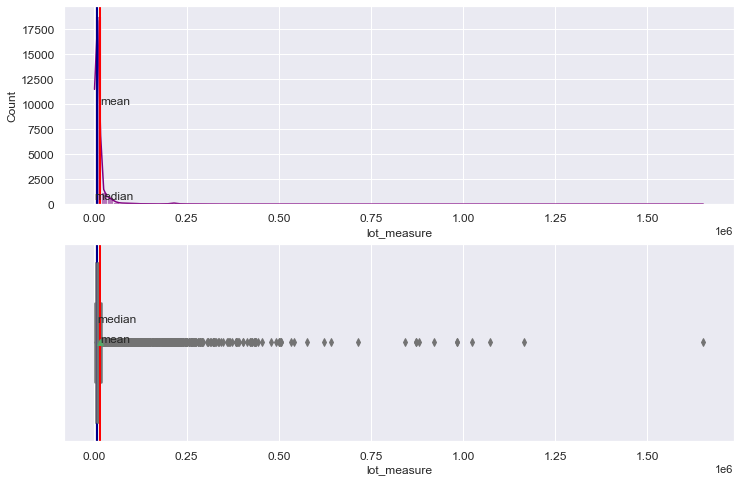

In [36]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['lot_measure'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=7618, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=15104, linewidth=2, color="red")  # we draw the mean value
plt.text(x=-1, y=500, s="median")  # we add text on the plot with names for the lines
plt.text(x=15104, y=10000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['lot_measure'], showmeans=True, linewidth=2.5, palette="rainbow",
)
plt.axvline(x=7618, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=15104, linewidth=2, color="red")  # we draw the mean value
plt.text(x=7618, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=15104, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observation**

- The lot_measure distribution is highly right skewed with lots of outlier on the upper values.
- The mean and median values  for the lot area of the houses in the data set are 15,104 and 7618 squared footage respectively( this measure does not include the living area).


### e.Variable 'ceil_measure'

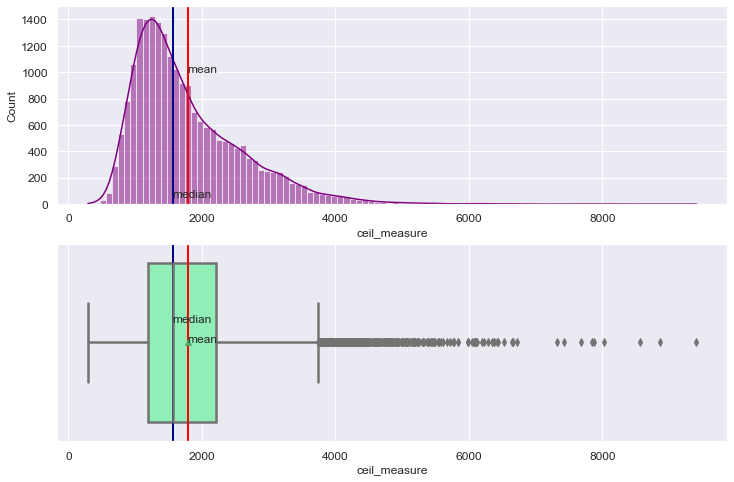

In [37]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['ceil_measure'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=1560, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=1788, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1560, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=1788, y=1000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['ceil_measure'], showmeans=True, linewidth=2.5, palette="rainbow",
)
plt.axvline(x=1560, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=1788, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1560, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=1788, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**
    
- The 'ceil_measure' distribution is right skewed due to the present of lots of outliers on the upper extreme of the distribution.
- The range of values goes from 290 to 9410.00 square footage.
- The distribution mean value is 1788.37 and the median value is 1650 square footage.


### f. Variable 'basement'


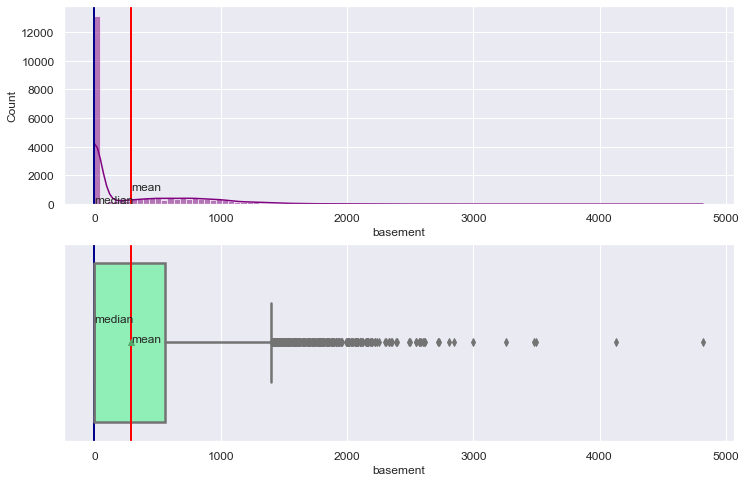

In [38]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df[ 'basement'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=0, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=291, linewidth=2, color="red")  # we draw the mean value
plt.text(x=0, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=291, y=1000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df[ 'basement'], showmeans=True, linewidth=2.5, palette="rainbow",
)
plt.axvline(x=0, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=291, linewidth=2, color="red")  # we draw the mean value
plt.text(x=0, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=291, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**

- Almost a half of the houses in the data set do not have a basement.
- We can see how the basement dimension vary for the houses in the data set from o to almost 5,000 square footage.


### g. Variable 'lat'

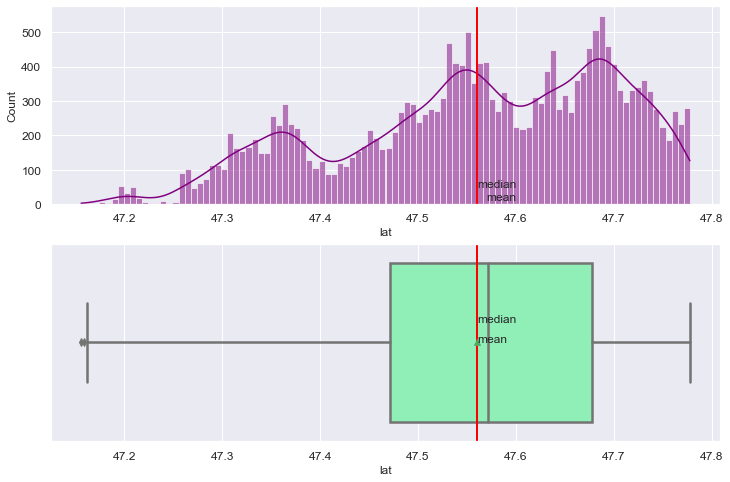

In [39]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['lat'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=47.56, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=47.56, linewidth=2, color="red")  # we draw the mean value
plt.text(x=47.56, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=47.57, y=10, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['lat'], showmeans=True, linewidth=2.5, palette="rainbow")
plt.axvline(x=47.56, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=47.56, linewidth=2, color="red")  # we draw the mean value
plt.text(x=47.56, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=47.56, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**
- The latitud distribution shows a shape with multiple humps as the curve of density shows.
- The latitud of the house area varies from 47.2 to 47.8,
- The area coordinates of latitud and longitud shows the area near Seattle in the state of Washington.

### h.Variable 'long'

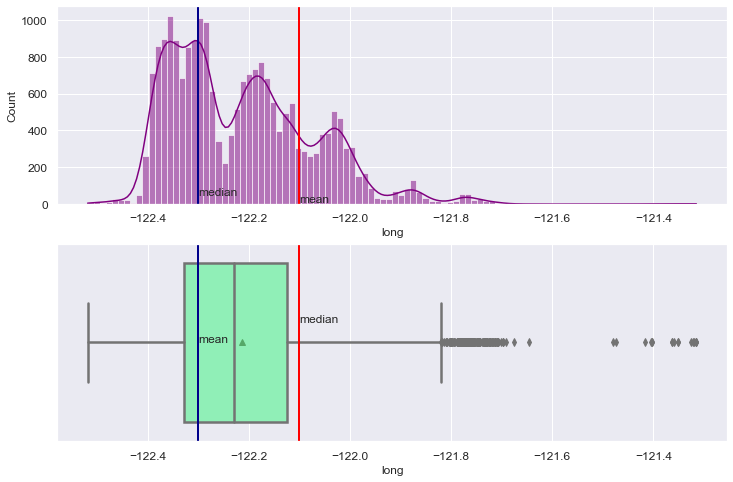

In [40]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['long'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=-122.3, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=-122.1, linewidth=2, color="red")  # we draw the mean value
plt.text(x=-122.3, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=-122.1, y=10, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['long'], showmeans=True, linewidth=2.5, palette="rainbow")
plt.axvline(x=-122.3, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=-122.1, linewidth=2, color="red")  # we draw the mean value
plt.text(x=-122.1, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=-122.3, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**

- Latitude area refers to the area of Seattle as we could find out by checking with both coordinates: latitude and longitude.
- the distribution is very asymmetrical and shows numerous humps, which are clusters of data points where the houses concentrate.
- In this case we cannot really talk about outliers, just areas a bit further from the middle section of the area; all houses are located between the longitude -122.4 and -121.4.


### i.Variable 'living_measure15'

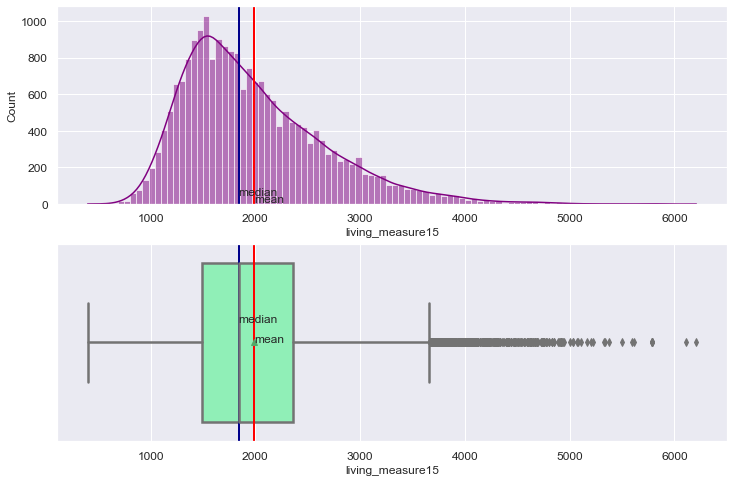

In [41]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df['living_measure15'], stat="count", color="purple", bins=100, kde=True)
plt.axvline(x=1840, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=1987, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1840, y=50, s="median")  # we add text on the plot with names for the lines
plt.text(x=1987, y=10, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['living_measure15'], showmeans=True, linewidth=2.5, palette="rainbow")
plt.axvline(x=1840, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=1987, linewidth=2, color="red")  # we draw the mean value
plt.text(x=1840, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=1987, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**

- The living room area for 2015 varies among the properties, with a minimum of 399 square feet and maximum value of 6200.
- The average living area for 2015 is around 2000 square feet.
- We can see many outliers on the upper extreme of the distribution.


### j.Variable 'lot_measure15'

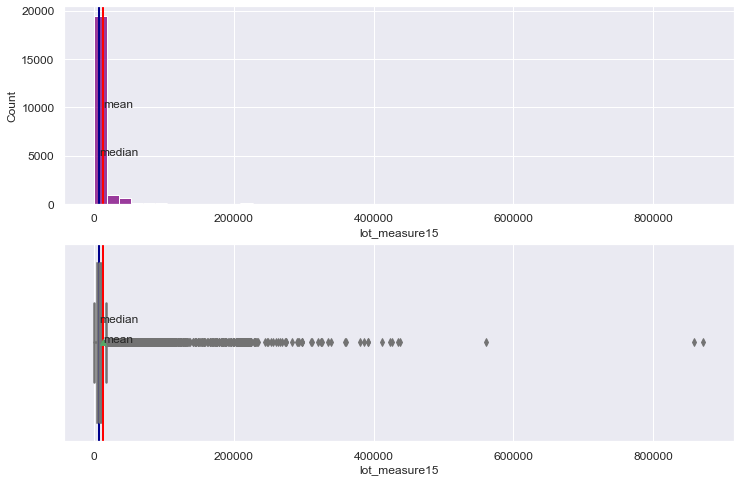

In [42]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df[ 'lot_measure15'], stat="count", color="purple", bins=50, kde=False)
plt.axvline(x=7620, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=12766, linewidth=2, color="red")  # we draw the mean value
plt.text(x=7620, y=5000, s="median")  # we add text on the plot with names for the lines
plt.text(x=12766, y=10000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['lot_measure15'], showmeans=True, linewidth=2.5, palette="rainbow")
plt.axvline(x=7620, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=12766, linewidth=2, color="red")  # we draw the mean value
plt.text(x=7620, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=12766, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**

- The average square footage of the lot for 2015 for the data is 12700. 
- There are lots of outliers and we can see a maximum value of 800,000 square feet for the lot size distribution for 2015.
- The distribution is highly skewed.



### k.Variable 'total_area'

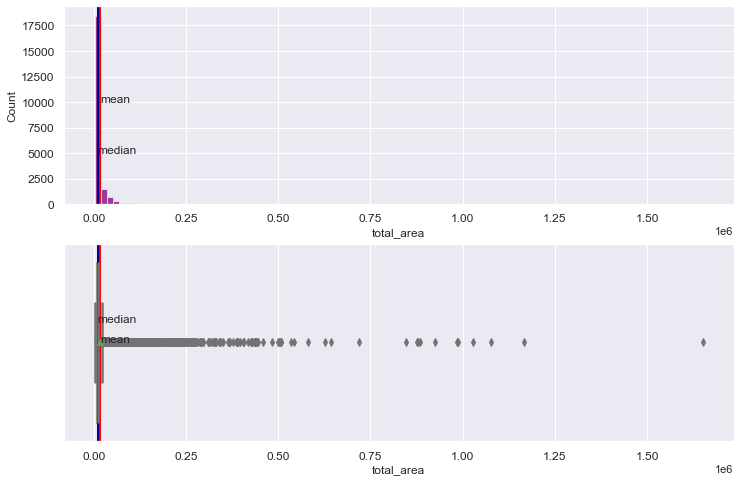

In [43]:
plt.figure(figsize=(12, 8))  # plot size

plt.subplot(2, 1, 1)  # subplot 1
sns.histplot(data=df, x=df[ 'total_area'], stat="count", color="purple", bins=100, kde=False)
plt.axvline(x=9575, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=17192, linewidth=2, color="red")  # we draw the mean value
plt.text(x=9575, y=5000, s="median")  # we add text on the plot with names for the lines
plt.text(x=17192, y=10000, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)
plt.yticks(size=12)

plt.subplot(2, 1, 2)  # subplot 2
sns.boxplot(
    data=df, x=df['total_area'], showmeans=True, linewidth=2.5, palette="rainbow")
plt.axvline(x=9575, linewidth=2, color="darkblue")  # we draw the median value
plt.axvline(x=17192, linewidth=2, color="red")  # we draw the mean value
plt.text(x=9575, y=-0.1, s="median")  # we add text on the plot with names for the lines
plt.text(x=17192, y=0, s="mean")  # we add text on the plot with names for the lines
plt.xticks(size=12)  # change size x axis
plt.yticks(size=12)  # change size y axis
plt.show()

**Observations:**

- The total area takes into account the lot measures  of each property and the total living space for all levels (including basement).
- The distribution is very right-skewed and there are lots of outliers in the upper extreme.
- range values vary widely, from 1,423 to 1,652,659 square feet.
- Mean and median values are 17,192 and 9,575 for square footage for this variable.


### l.Variable 'yr_renovated'

In [44]:
# Creating sub data frame in order to plot the percentage of houses that were renovated each year.
year_df_reno=df[df['yr_renovated']>1700]

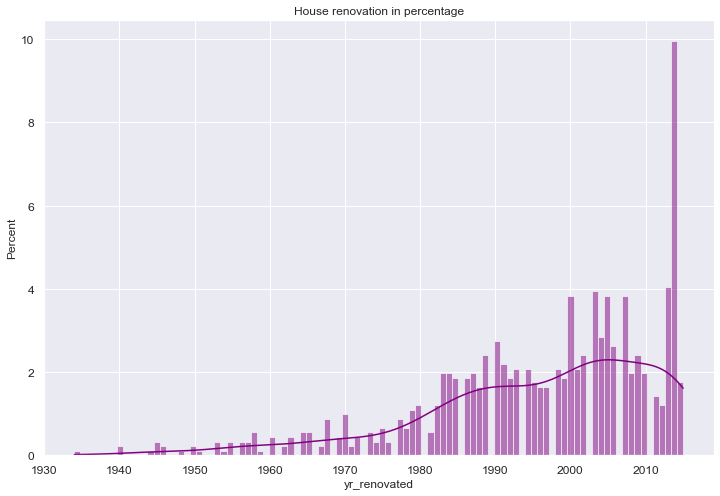

In [45]:
plt.figure(figsize=(12, 8))  
sns.histplot(data=year_df_reno, x=year_df_reno['yr_renovated'], stat="percent", color="purple", bins=100, kde=True)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('House renovation in percentage')
plt.show()



**Observations:**
    
- The year with more house renovations was 2014.
- We can see how there is a huge increase in the renovation of the houses since year 2000.
- There is a positive tendency to renovate homes since 1980.
- Most of the properties in the data set have not been renovated (95 percent of the total and in 2014, we can see that the maximun number of renovations reach 4 percent followed by 2003 and 2013 with 0.17 percent of the total house inventory.

### m.Variable 'room_bed'

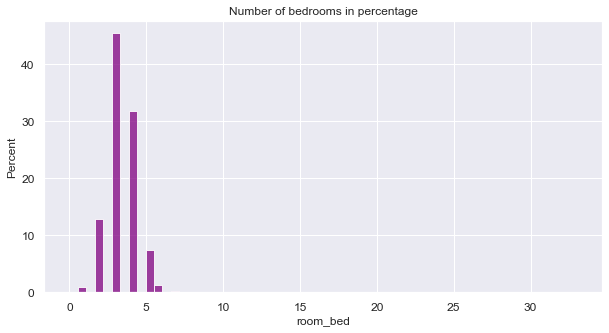

In [46]:
plt.figure(figsize=(10, 5))  
sns.histplot(data=df, x=df['room_bed'], stat="percent", color="purple", bins=60, kde=False)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('Number of bedrooms in percentage')
plt.show()


**Observations:**

- From the data set, 45 percent of the houses count with 3 bathrooms followed by 4 bedrooms with 31 percent and 2 with 12 percent.
-  The properties with more than 7 bedrooms are only 0.28 percent of the total.


### n. Variable 'room_bath'

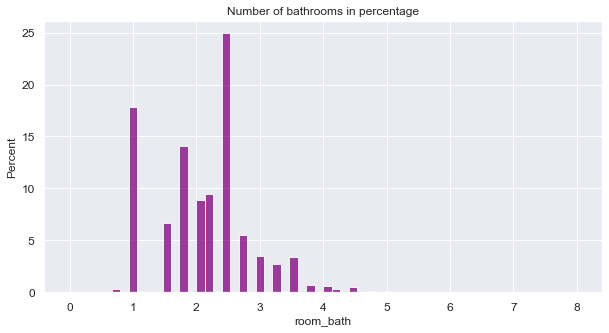

In [47]:
plt.figure(figsize=(10, 5))  
sns.histplot(data=df, x=df['room_bath'], stat="percent", color="Purple", bins=60, kde=False)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('Number of bathrooms in percentage')
plt.show()


**Observations:**

- The 25% of the houses in the data set have 2.5 bathrooms, being this the most frequent number of bathrooms, followed by 1 bathroom with 18 percent and 1.75 bathrooms with 14 percent of the data.
- The houses with more than 4 bathrooms are very scarce; on this data set, the maximum of bathrooms found is 8.

In order to understand the number of bathrooms, we need to know how many types exists in Real Estate:

- A full bath refers to a restroom that hasa toilet,a sink or washbasin,and a showerand a bathtub.
- A three-quarter bathroom is contains same features than a full bathroom without a bathtub.
- A half bathroom is a room that has only a toilet and a sink.
- A one-quarter bath requires just a toilet.


### o.Variable 'sight'

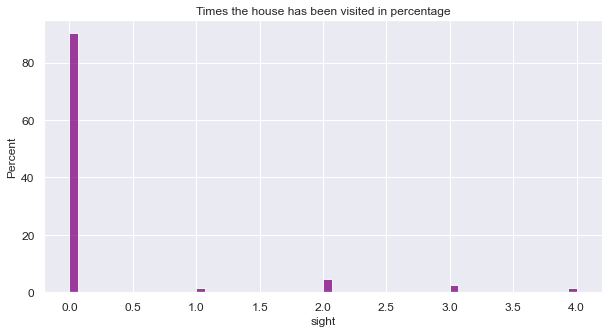

In [48]:
plt.figure(figsize=(10, 5))  
sns.histplot(data=df, x=df['sight'], stat="percent", color="Purple", bins=60, kde=False)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('Times the house has been visited in percentage')
plt.show()

**Observations:**
    
- Most of the houses have not been visited yet (almost 90% of the total).
- Only 1.5 percent of the houses have been visited once and 4 percent twice.
- The maximum number of times that a house has been seen is 4.


### p. Variable 'quality'

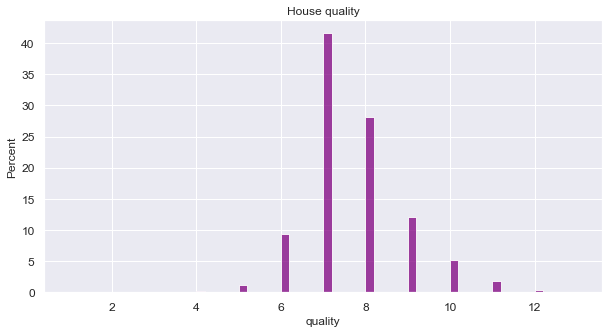

In [49]:
plt.figure(figsize=(10, 5))  
sns.histplot(data=df, x=df['quality'], stat="percent", color="Purple", bins=60, kde=False)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('House quality')
plt.show()

**Observations:**
    
- Houses were rated from 1 to 13 in terms of quality.
- Forty per cent of the houses were rated with a 7, followed by 8 with 30 per cent and 9 with 12 percent.


### q. Variable 'dayhours'

In [50]:
# Checking the counts of transaction per date
sub_df=df['dayhours'].value_counts(normalize=True)*100

In [51]:
#chekcing top transactions
sub_df.head(10)

2014-06-23 00:00:00   0.66
2014-06-25 00:00:00   0.61
2014-06-26 00:00:00   0.61
2014-07-08 00:00:00   0.59
2015-04-27 00:00:00   0.58
2015-03-25 00:00:00   0.57
2014-07-09 00:00:00   0.56
2015-04-14 00:00:00   0.56
2015-04-22 00:00:00   0.56
2015-04-28 00:00:00   0.56
Name: dayhours, dtype: float64

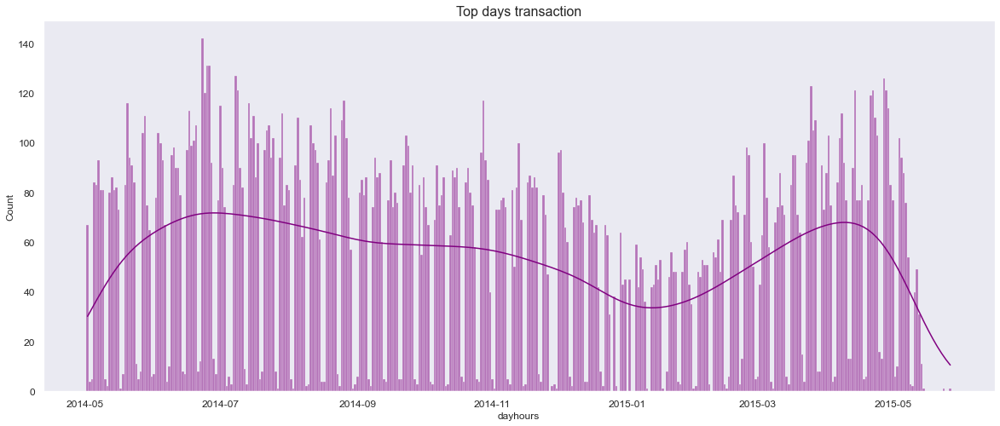

In [52]:
plt.figure(figsize=(20,8))  
sns.histplot(data=sub_df, x=df['dayhours'] , color="purple", bins=10, kde=True)
plt.xticks(size=12)
plt.yticks(size=12)
plt.title('Top days transaction', fontsize=16)
plt.grid()
plt.show()

**Observations:**

- The dates with most house transactions were 2014-06-23 with 0.66 percent, followed by 2014-06-25 and 2014-06-26 with 0.61 percent each one. 
- In Spring 2015 we see some days with good results as well.




### r. Variable 'ceil'

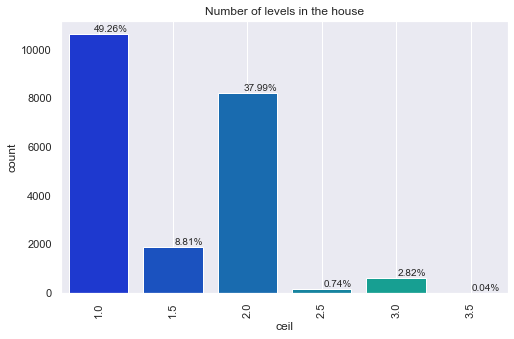

In [53]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x='ceil', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Number of levels in the house')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

**Observations:**
    
- The 50 percent of the houses sold for the period had 1 floor.
- The 37 per cent of the houses have 2 levels.


### s. Variable 'coast'

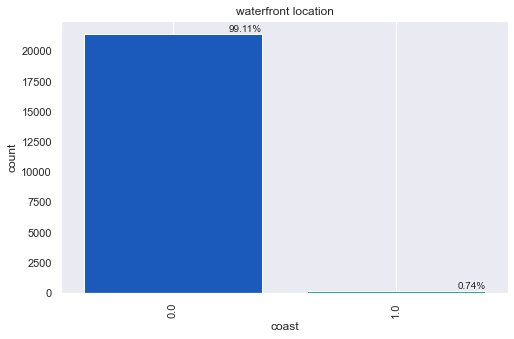

In [54]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'coast', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('waterfront location')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

**Observations:**
- in regards with the waterfront view, 99 per cent of the houses were not close to the coast.
- Only 0.74 per cent of the houses had waterfront view.


### t.Variable 'condition'

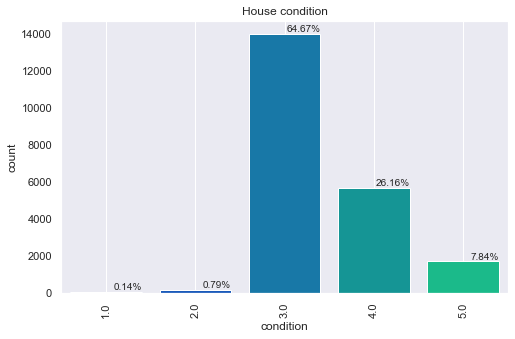

In [55]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'condition', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('House condition')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

**Observations:**

- The variable condition rates the house condition from 1 to 5.
- the 65 percent of the houses are rated as intermediate condition, 3 out of 5 point.
- Only 8 percent of the houses were rated as 5.


### u. Variable 'yr_built'

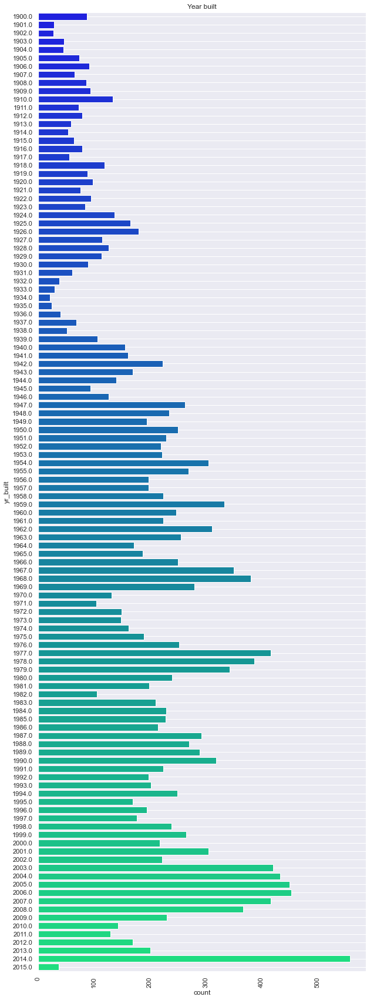

In [56]:
plt.figure(figsize=(10, 30))  # size of each plot

ax = sns.countplot(
    data=df, y= 'yr_built', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Year built')
plt.xticks(rotation=90)

plt.show()

In [57]:
df['yr_built'].value_counts(normalize=True).head(10)*100

2014.0   2.59
2006.0   2.10
2005.0   2.08
2004.0   2.00
2003.0   1.95
1977.0   1.93
2007.0   1.93
1978.0   1.79
1968.0   1.76
2008.0   1.70
Name: yr_built, dtype: float64

In [58]:
df['yr_built'].value_counts(normalize=True).tail(10)*100

1903.0   0.21
1904.0   0.21
1936.0   0.19
1932.0   0.18
2015.0   0.17
1933.0   0.14
1901.0   0.13
1902.0   0.13
1935.0   0.11
1934.0   0.10
Name: yr_built, dtype: float64

**Observations:**
- Year 2014 seems to be the year with more houses built in the data set, followed by 2006and 2005.
- The year with less new houses was 1934 with only 0.10 per cent of the total. 
- Year 2015 also shows low number of new houses built but we do not have the information for the whole year, we will have to do some research.

### v.Variable 'zipcode'

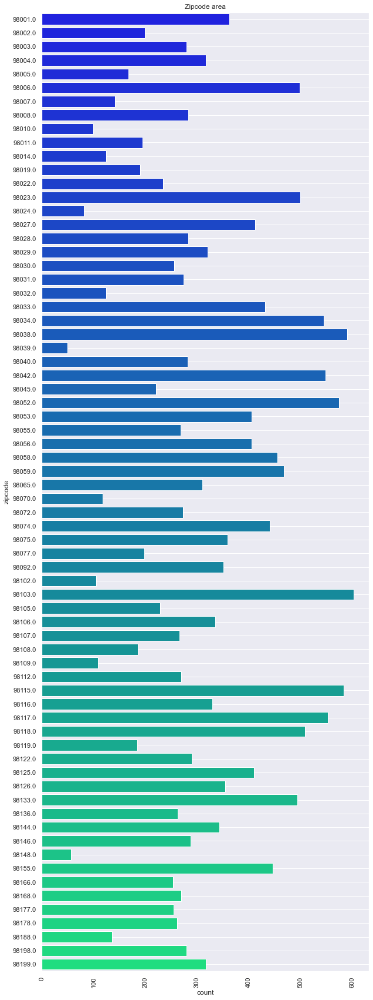

In [59]:
plt.figure(figsize=(10, 30))  # size of each plot

ax = sns.countplot(
    data=df, y=  'zipcode', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Zipcode area')
plt.xticks(rotation=90)

plt.show()

In [60]:
df['zipcode'].value_counts(normalize=True).head(10)*100

98103.0   2.79
98038.0   2.73
98115.0   2.70
98052.0   2.66
98117.0   2.56
98042.0   2.54
98034.0   2.52
98118.0   2.35
98023.0   2.31
98006.0   2.30
Name: zipcode, dtype: float64

In [61]:
df['zipcode'].value_counts(normalize=True).tail(10)*100

98188.0   0.63
98032.0   0.58
98014.0   0.57
98070.0   0.55
98109.0   0.50
98102.0   0.49
98010.0   0.46
98024.0   0.37
98148.0   0.26
98039.0   0.23
Name: zipcode, dtype: float64

**Observations:**

- The houses are all distributed in the same area because the zip code does not change much.
- The most frequent zip codes are :98103, 98038, 98115 with more than 2.7 percent each one.
- The less frequent zip code refers to 98039.


### w.Varible 'furnished'

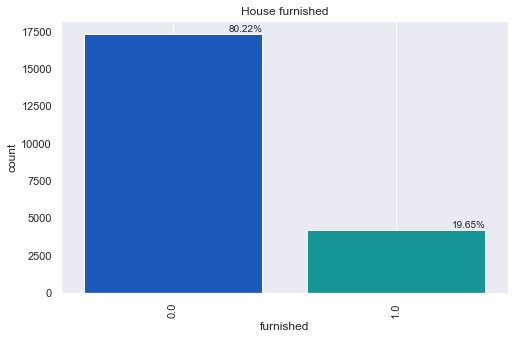

In [62]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'furnished', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('House furnished')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

**Observations:**
    
- Most of the houses sold were not furnished (80 per cent).
- Only 20 percent of the houses were sold with furniture included.


In [63]:
df.select_dtypes('category').columns

Index(['dayhours', 'ceil', 'coast', 'condition', 'yr_built', 'zipcode',
       'furnished', 'date_month', 'date_year', 'date_day'],
      dtype='object')

### x. Additional datetime variables

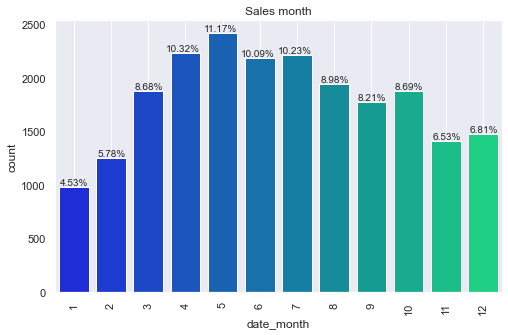

In [64]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'date_month', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Sales month')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

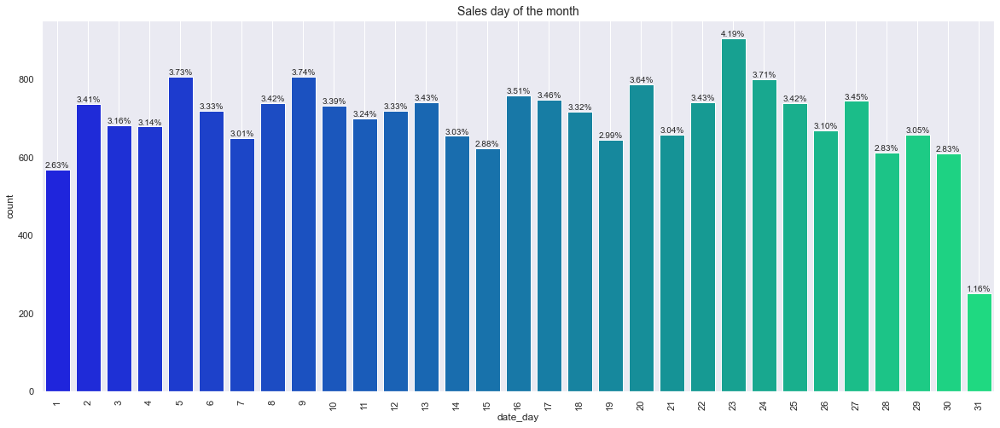

In [65]:
plt.figure(figsize=(20, 8))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'date_day', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Sales day of the month', fontsize =14)
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

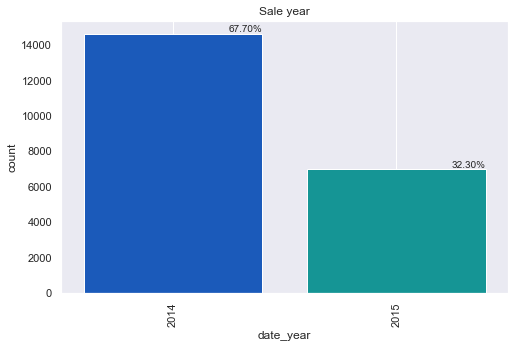

In [66]:
plt.figure(figsize=(8, 5))  # size of each plot
total = float(len(df))  # to calculate percentage
ax = sns.countplot(
    data=df, x= 'date_year', palette='winter'
)  # we are using countplot for categorical values
plt.grid()  # grid will help visualization
plt.title('Sale year')
plt.xticks(rotation=90)
for p in ax.patches:  # add percentage
    percentage = "{:.2f}%".format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(
        percentage, (x, y), ha="right", va="bottom", fontsize=10
    )  # show the percentage in the plot
plt.show()

**Observations:**

- The year with higher number of sales is 2014 with almost 70 per cent of the overall data.
- May, April, and August are the months with higher number of sales with 11,10.30 and 10.23 respectively.
- January, February, and November are the months with lower sales numbers.
- the day 24th of each months seems to be the ones with most sales (4 per cent) while 31st seems to be the day with worse sale results.


## 3.3 BIVARIATE ANALYSIS

### 1. Pair plot of all numeric variables

In [67]:
# selcecting numerical variabels of the dataset
df.select_dtypes(np.number).columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'quality', 'ceil_measure', 'basement',
       'yr_renovated', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'total_area'],
      dtype='object')

In [68]:
# list of variables to include in the pair plot.
list_paired=['price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil_measure', 'basement', 'living_measure15', 'lot_measure15',
       'total_area','sight']

<Figure size 10800x10800 with 0 Axes>

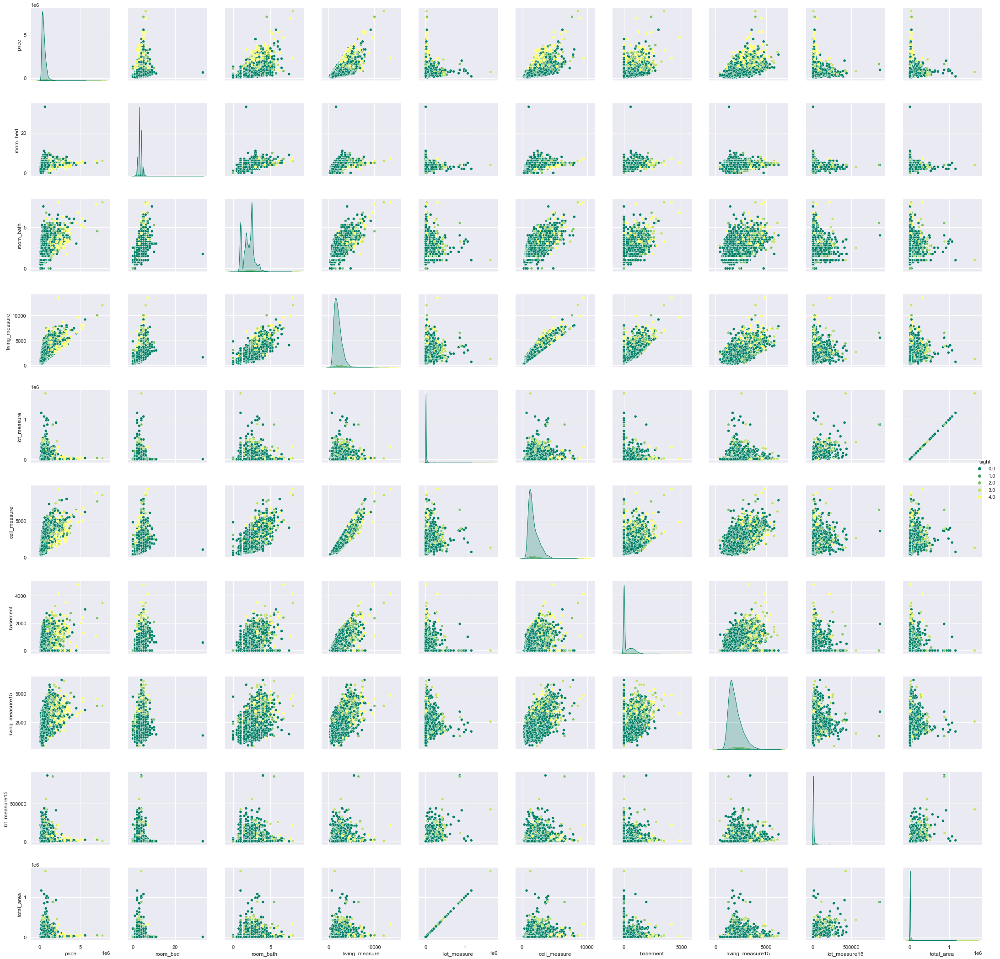

In [69]:
plt.figure(figsize=(150, 150))  # set size
sns.pairplot(
    data=df[list_paired], diag_kind="kde",height=3, palette="summer",hue='sight'
)  # pairplot with density distribution in the diagonal.
sns.set(font_scale=2.1)
plt.tight_layout(pad=1.5)
plt.show()

**Observations:**

- Housing price seems to have a positive relationship with number of bedrooms, bathroom, and this living area of the house.
- It is also interesting that the houses with higher prices and more living space, received more visits.
- Living space shows positive relationship with number of bathrooms and bedrooms.
- lot dimensions seem not to have any relation with price.
- In order to complete our first analysis, we need to confirm our first findings with the help of a heatmap.


### 2.Heatmap

In [70]:
# numeric variables to include in the heatmap
list_heatmap=['price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil_measure', 'basement', 'living_measure15', 'lot_measure15',
       'total_area','sight']

<AxesSubplot:>

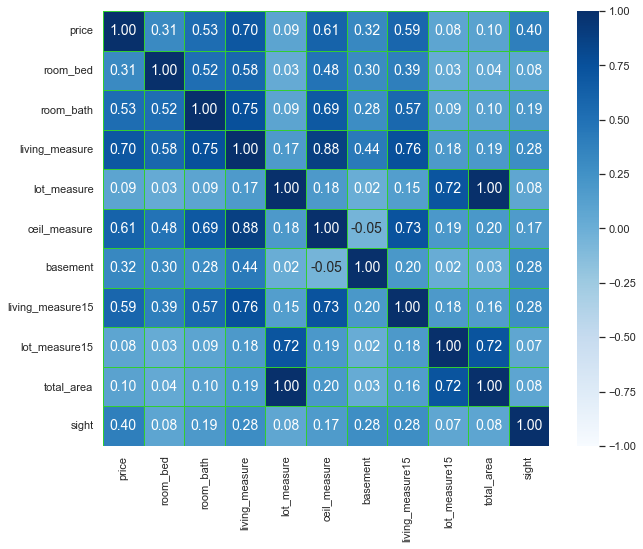

In [71]:
"""we will plot a heatmap with a min value of -1 and max value of 1 to simulate the 
coefficient of correlation."""
plt.figure(figsize=(10, 8))  # setting the size of the plot
sns.set(font_scale=1)
sns.heatmap(
    df[list_heatmap].corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cmap='Blues',
    linewidths=1,
    linecolor="limegreen", annot_kws={"size": 14}
)  # creating heatmap with annotations





**Observations:**

- The price seems to be highly correlated with square footage of living space.
- Also, the square footage of the residence without basement is positively correlated with the housing price.
- The variable living_measure, living space in 2015, is showing strong positive correlation with our target variable.
- Number of bathrooms also show moderate positive correlation with housing price.
- Number of bathrooms is show high correlation with the living space area, the bigger the living area the greater number of bathrooms.
- Price seems to not be related to the lot size.
- Not surprisingly, we can see the relation between lot measure and lot_measure15 with variable total_area, which makes sense since total_area include the lot size.
- Ceil_measure is the square footage without basement, and it is strongly correlated to living_measure which include the living space in each floor and the basement.
- Number of bedrooms also is correlated with the living area space.
- Basement size is also positively related to the living space.


### 3.Price vs coast view

In [72]:
# Grouping prices depending on the view to the waterfront
water_df= df.groupby('coast')['price'].mean()
water_df

coast
0.0    531636.07
1.0   1668300.88
Name: price, dtype: float64

<Figure size 720x576 with 0 Axes>

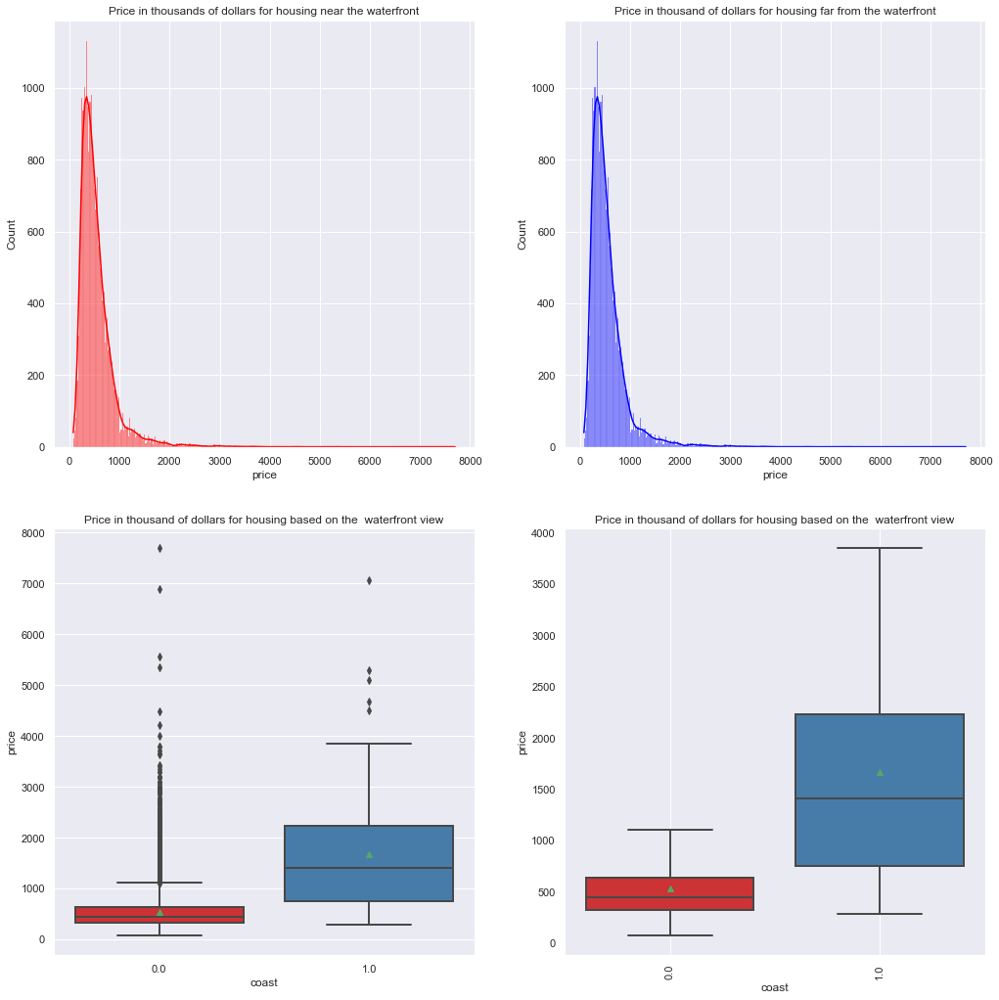

In [73]:
plt.figure(figsize=(10,8))  # size of the plot
fig, axs = plt.subplots(2, 2, figsize=(15,15))#number of columns and rows of subplot

axs[0,0].set_title('Price in thousands of dollars for housing near the waterfront',fontsize=12)
sns.histplot(data=df[df['coast']==1], x=df['price']/1000,kde=True,  ax=axs[0, 0],stat="count",color="red")
 # histogram with hue per cerified cases
    
axs[0,1].set_title('Price in thousand of dollars for housing far from the waterfront', fontsize=12)
sns.histplot(data=df[df['coast']==0],x=df['price']/1000,kde=True,  ax=axs[0, 1],stat="count",color="blue")
 # histogram  for denied cases
    
axs[1,0].set_title('Price in thousand of dollars for housing based on the  waterfront view',fontsize=12)#boxplot with fliers showing mean value
sns.boxplot(data=df, y=df['price']/1000, x=df['coast'], ax=axs[1, 0], showmeans=True, linewidth=2,palette="Set1")

axs[1,1].set_title('Price in thousand of dollars for housing based on the  waterfront view',fontsize=12)#boxplot without fliers showing mean value
sns.boxplot(data=df, y=df['price']/1000,x=df['coast'],ax=axs[1, 1], showmeans=True,linewidth=2,showfliers=False,palette="Set1")

plt.xticks(rotation=90)  # to show the labels in the x axis
plt.grid()
plt.tight_layout(pad=3)
plt.show()

**Observations:**

- The average price for the waterfront properties is higher but that is not determinant of the price since there are properties without water view with higher prices.
- Price distributions for houses in the waterfront and the ones without water view are very similar, but the price range varies widely in the case of the houses with no water view.
- The average price for a waterfront house is 1,668,300 dollars while the ones in different location is 531,636 dollars.



### 4.Price vs number of floors

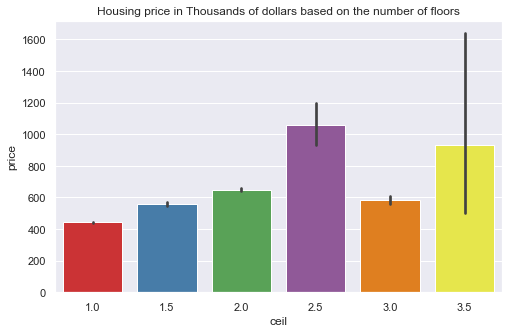

In [74]:
plt.figure(figsize=(8,5))
sns.barplot(data=df, y=df['price']/1000, x=df['ceil'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on the number of floors")
plt.show()

In [75]:
#showing averge price per number of levels
df_ceil=df.groupby('ceil')['price'].mean()
df_ceil

ceil
1.0    442045.12
1.5    559374.45
2.0    649121.04
2.5   1061020.90
3.0    583124.77
3.5    933937.50
Name: price, dtype: float64

**Observations:**


- The housing price increases up to 2.5 floor, after that, it seems not to be that relevant.
- If we check the mean prices above, the average price for a two levels residence is higher than for a 3-level house.
- The most expensive houses are the ones with 2.5 floors in average; maybe bigger properties are not in high demand because of the cost of maintenance and additional levels would make the house space less comfortable.
- The price range for 3-houses varies widely, so there are other variable affecting the housing price and purchase decision.


### 5.Price vs number of bedrooms

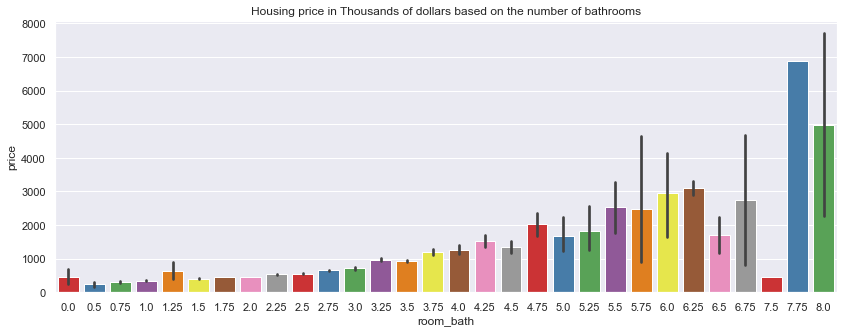

In [76]:
plt.figure(figsize=(14,5))
sns.barplot(data=df, y=df['price']/1000, x=df['room_bath'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on the number of bathrooms")
plt.show()

In [77]:
# average housing price per number of bathrooms
df_bathroom=df.groupby('room_bath')['price'].mean().sort_values(ascending=False)
df_bathroom


room_bath
7.75   6890000.00
8.00   4990000.00
6.25   3095000.00
6.00   2948333.33
6.75   2735000.00
5.50   2522500.00
5.75   2492500.00
4.75   2022299.57
5.25   1817961.54
6.50   1710000.00
5.00   1674166.67
4.25   1535071.79
4.50   1334210.61
4.00   1271615.76
3.75   1198178.90
3.25    971029.87
3.50    932951.95
3.00    708732.55
2.75    660553.80
1.25    621772.22
2.50    553659.49
2.25    533792.48
2.00    457518.37
1.75    454940.91
7.50    450000.00
0.00    449095.00
1.50    409183.43
1.00    347088.86
0.75    294520.86
0.50    237375.00
Name: price, dtype: float64

In [78]:
# Checking properties with 0 bathrooms
df[df['room_bath']==0]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
3155,2954400190.00,2014-06-24,1300000.00,0.00,0.00,4810.00,28008.00,2.00,0.00,0.00,3.00,12.00,4810.00,0.00,1990.00,0.00,98053.00,47.66,-122.07,4740.00,35061.00,1.00,32818.00,6,2014,24
3405,3980300371.00,2014-09-26,142000.00,0.00,0.00,290.00,20875.00,1.00,0.00,0.00,1.00,1.00,290.00,0.00,1963.00,0.00,98024.00,47.53,-121.89,1620.00,22850.00,0.00,21165.00,9,2014,26
4238,7849202190.00,2014-12-23,235000.00,0.00,0.00,1470.00,4800.00,2.00,0.00,0.00,3.00,7.00,1470.00,0.00,1996.00,0.00,98065.00,47.53,-121.83,1060.00,7200.00,0.00,6270.00,12,2014,23
4730,203100435.00,2014-09-18,484000.00,1.00,0.00,690.00,23244.00,1.00,0.00,0.00,4.00,7.00,690.00,0.00,1948.00,0.00,98053.00,47.64,-121.95,1690.00,19290.00,0.00,23934.00,9,2014,18
15593,3918400017.00,2015-02-05,380000.00,0.00,0.00,1470.00,979.00,3.00,0.00,2.00,3.00,8.00,1470.00,0.00,2006.00,0.00,98133.00,47.71,-122.36,1470.00,1399.00,0.00,2449.00,2,2015,5
17704,3374500520.00,2015-04-29,355000.00,0.00,0.00,2460.00,8049.00,2.00,0.00,0.00,3.00,8.00,2460.00,0.00,1990.00,0.00,98031.00,47.41,-122.17,2520.00,8050.00,0.00,10509.00,4,2015,29
17946,3421079032.00,2015-02-17,75000.00,1.00,0.00,670.00,43377.00,1.00,0.00,0.00,3.00,3.00,670.00,0.00,1966.00,0.00,98022.00,47.26,-121.91,1160.00,42882.00,0.00,44047.00,2,2015,17
18596,9543000205.00,2015-04-13,139950.00,0.00,0.00,844.00,4269.00,1.00,0.00,0.00,4.00,7.00,844.00,0.00,1913.00,0.00,98001.00,47.28,-122.25,1380.00,9600.00,0.00,5113.00,4,2015,13
20355,5702500050.00,2014-11-04,280000.00,1.00,0.00,600.00,24501.00,1.00,0.00,0.00,2.00,3.00,600.00,0.00,1950.00,0.00,98045.00,47.53,-121.75,990.00,22549.00,0.00,25101.00,11,2014,4
20957,6306400140.00,2014-06-12,1100000.00,0.00,0.00,3064.00,4764.00,3.50,0.00,2.00,3.00,7.00,3064.00,0.00,1990.00,0.00,98102.00,47.64,-122.32,2360.00,4000.00,0.00,7828.00,6,2014,12


**Observations:**

- It seems that in general the number of bathrooms affect the price positively. In fact, the bar plot is showing a progression in price as the number of bathrooms increases.
- As we saw in the heatmap, the greater number of bathrooms is associated to bigger living space.
- The most expensive houses are those with 8 and 7.75 bathrooms.
- We can assume the properties with 0 bathrooms are only pieces of land or properties that need to be renewed or finished.


### 6.Price vs number of bedrooms

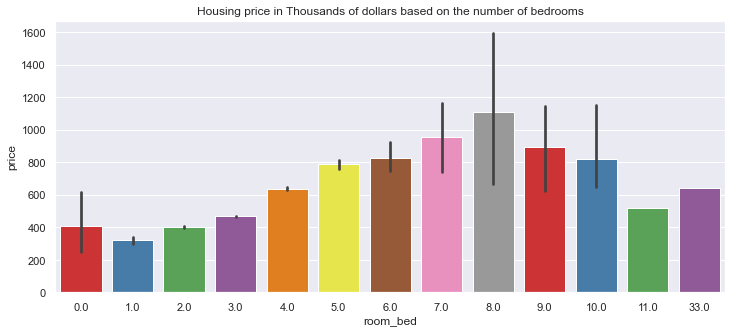

In [79]:
plt.figure(figsize=(12,5))
sns.barplot(data=df, y=df['price']/1000, x=df['room_bed'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on the number of bedrooms")
plt.show()

In [80]:
# Checking average price based on number of bedrooms
df_bedroom=df.groupby('room_bed')['price'].mean().sort_values(ascending=False)
df_bedroom

room_bed
8.00    1105076.92
7.00     951447.82
9.00     893999.83
6.00     827489.46
10.00    820000.00
5.00     786732.90
33.00    640000.00
4.00     635728.37
11.00    520000.00
3.00     466296.98
0.00     410223.08
2.00     401357.18
1.00     318928.60
Name: price, dtype: float64

**Observations:**

- The price seems to increase as the number of bedrooms increase up to a certain number.
- The price of the properties is decreasing for properties with more than 8 bedrooms. This can be associated with the number of floors of the property, that as we saw before is not that attractive after 2.5 levels (maybe an additional floor is not desired)
- The price for an 8-bedroom property varies widely, with an average price of 1,105,076 dollars. 
- Housing price for residences with more than 8 bedrooms show a declining tendency.



### 7. Price vs quality rate

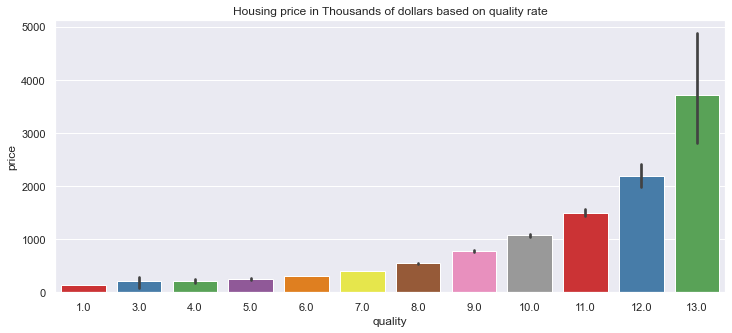

In [81]:
plt.figure(figsize=(12,5))
sns.barplot(data=df, y=df['price']/1000, x=df['quality'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on quality rate")
plt.show()

In [82]:
#showing average price based on quatity rate
df_quality=df.groupby('quality')['price'].mean().sort_values(ascending=False)
df_quality

quality
13.00   3710769.23
12.00   2192500.00
11.00   1497792.38
10.00   1072347.47
9.00     773738.22
8.00     542931.00
7.00     402593.32
6.00     301916.57
5.00     248523.97
4.00     214381.03
3.00     205666.67
1.00     142000.00
Name: price, dtype: float64

**Observations**

- The bar plot is clearly showing a positive trend, the price increase as the quality rate improves.
- The average price for houses rated with the maximum value, 13, is 3,710,769 dollars followed by the ones rated 12 (which average price is 2,192,500 dollars)


### 8. Housing price vs condition

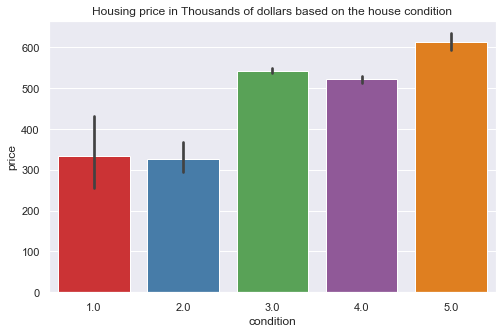

In [83]:
plt.figure(figsize=(8,5))
sns.barplot(data=df, y=df['price']/1000, x=df['condition'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on the house condition")
plt.show()

In [84]:
# showing average price based on condition rate
df_condition=df.groupby('condition')['price'].mean().sort_values(ascending=False)
df_condition

condition
5.0   612515.49
3.0   542370.51
4.0   520643.22
1.0   334431.67
2.0   326423.33
Name: price, dtype: float64

**Observations:**

- The above plot is showing how the house prices vary widely for houses in bad condition (1), sometimes being more expensive than other rated a bit better.
- In general, very houses in very good condition show the highest prices, with a mean value of 612,515 but it is not the same for the lower rated, being the houses rated 3 in average more expensive than the ones rated 4.


### 9.Housing price vs sight

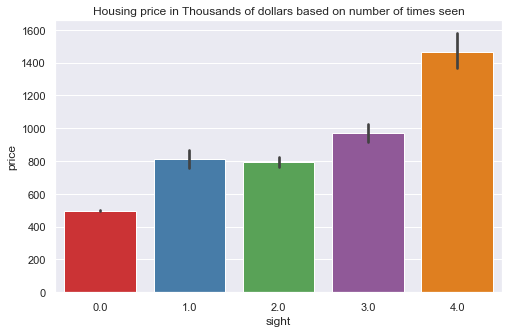

In [85]:
plt.figure(figsize=(8,5))
sns.barplot(data=df, y=df['price']/1000, x=df['sight'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on number of times seen")
plt.show()

In [86]:
df_sight=df.groupby('sight')['price'].mean().sort_values(ascending=False)
df_sight

sight
4.00   1466554.04
3.00    972468.39
1.00    812518.61
2.00    791860.88
0.00    496554.08
Name: price, dtype: float64

**Observations:**
- The most expesive houses are visited 4 or 3 times in average.
-  Purchasing a home ‘sight unseen’ means buying it without having toured the property in person first.The houses not seen previously show lower prices.Virtual touring help to avoid  bidding wars  and keep house prices lower.

### 10.Housing price vs year built

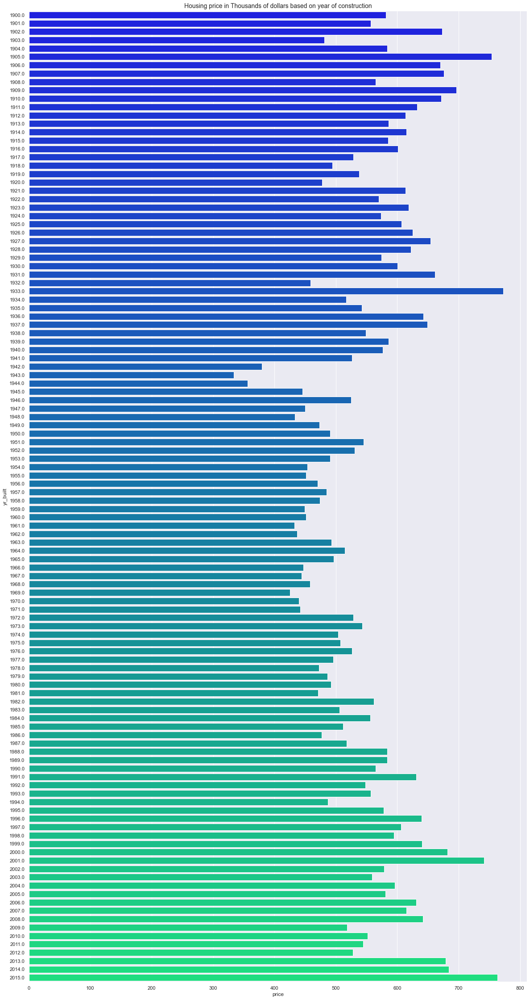

In [87]:
plt.figure(figsize=(20,40))
sns.barplot(data=df,x=df['price']/1000, y=df['yr_built'], palette= 'winter', ci=None)
plt.title ("Housing price in Thousands of dollars based on year of construction", fontsize=14)
plt.show()

In [88]:
# Average price per year the house was built
df_built_year=df.groupby('yr_built')['price'].mean().sort_values(ascending=False)
df_built_year

yr_built
1933.0   772483.33
2015.0   762970.16
1905.0   753443.93
2001.0   741340.04
1909.0   696448.99
2014.0   683792.69
2000.0   682003.62
2013.0   678599.58
1907.0   676324.48
1902.0   673192.59
1910.0   671671.84
1906.0   670027.66
1931.0   661781.15
1927.0   654154.21
1937.0   648791.54
1936.0   642335.00
2008.0   642037.72
1999.0   640431.18
1996.0   639673.53
1911.0   632584.25
2006.0   631041.55
1991.0   630630.65
1926.0   625443.38
1928.0   621920.20
1923.0   618653.77
1914.0   615246.07
2007.0   615193.29
1921.0   613224.21
1912.0   613193.23
1925.0   607316.61
1997.0   606173.89
1916.0   601041.62
1930.0   600659.31
2004.0   596095.00
1998.0   594280.15
1913.0   586066.27
1939.0   585718.41
1915.0   585036.92
1989.0   584015.18
1988.0   583930.40
1904.0   583867.76
1900.0   581536.63
2005.0   580895.47
2002.0   578818.48
1995.0   577933.76
1940.0   576255.07
1929.0   574396.84
1924.0   573528.25
1922.0   569794.15
1990.0   564875.18
1908.0   564499.85
1982.0   562068.95
200

**Observations:**

- Year of construction does not seem to be related to the housing price. 
- For the given data, houses built in 1933, (and in third place houses dated 1905), are the ones with higher prices, maybe because it is the historic neighborhood of the city.
- Prices are also high for 2015 because those are brand new houses.


### 11. Housing prices vs year renovated

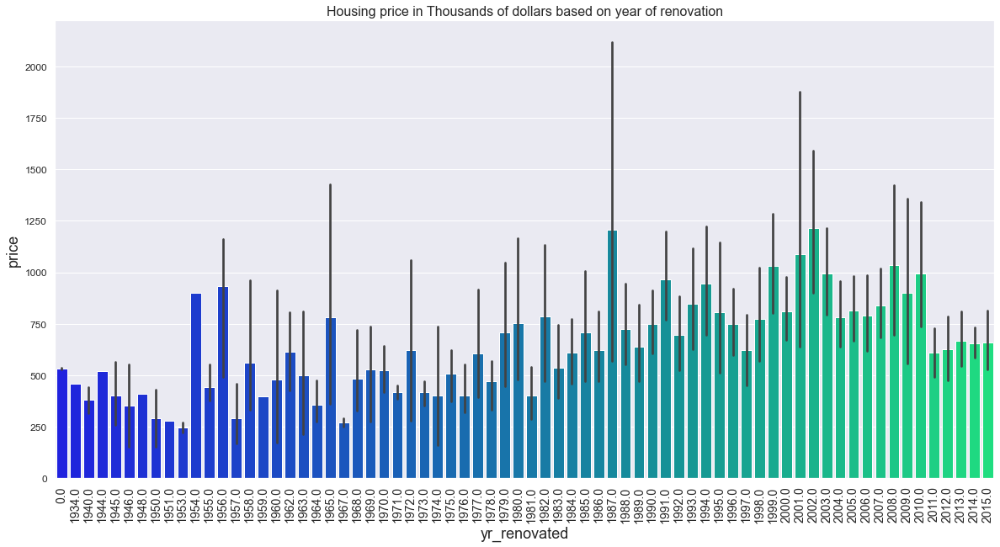

In [89]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.barplot(data=df,y=df['price']/1000, x=df['yr_renovated'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on year of renovation", fontsize=16)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()


In [90]:

#Average price per year the house was renovated
df_renovation_year=df.groupby('yr_renovated')['price'].mean().sort_values(ascending=False)
df_renovation_year

yr_renovated
2002.00   1216497.73
1987.00   1206777.78
2001.00   1089489.47
2008.00   1034498.89
1999.00   1030705.88
2010.00    992669.44
2003.00    992305.56
1991.00    965045.00
1994.00    943026.53
1956.00    930666.67
2009.00    900682.36
1954.00    900000.00
1993.00    848003.16
2007.00    838922.14
2005.00    815195.71
2000.00    809084.29
1995.00    805523.12
2006.00    789039.58
1982.00    786792.73
1965.00    782200.00
2004.00    782076.92
1998.00    773731.58
1980.00    753454.55
1996.00    749663.33
1990.00    749120.00
1988.00    722760.00
1985.00    705817.65
1979.00    705490.00
1992.00    696794.12
2013.00    664960.81
2015.00    659156.25
2014.00    655030.10
1989.00    639788.64
2012.00    625181.82
1986.00    623058.24
1997.00    620396.00
1972.00    619750.00
1962.00    615000.00
1984.00    607944.44
2011.00    607496.15
1977.00    605043.75
1958.00    559576.00
1983.00    537477.78
0.00       530447.96
1969.00    529125.00
1970.00    523044.44
1944.00    521000.00


**Observations:**
    
- The year of renovation does not seem to have any relationship with the housing price.
- The houses with higher prices are not the ones renovated in recent years. The houses renovated after 2011 present lower average prices than the ones renovated before.
- We can see that the average prices for houses renovated between 2000 and 2010 are higher than the ones renovated before.
- The houses with the highest prices were renovated in 2002 and 1987.new houses.


### 12. Housing price vs zipcode

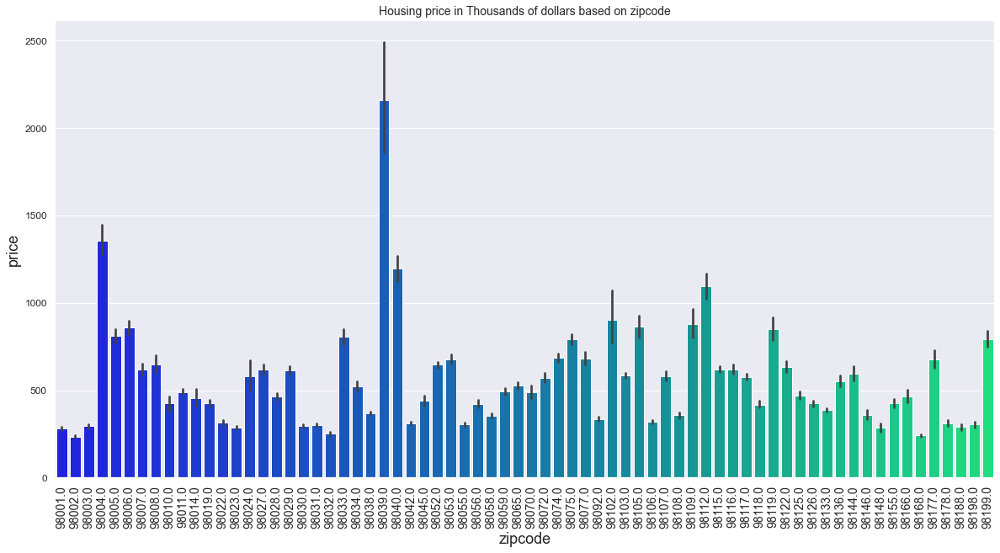

In [91]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.barplot(data=df,y=df['price']/1000, x=df['zipcode'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on zipcode", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

In [92]:
# prices based on zip code
df_zip=df.groupby('zipcode')['price'].mean().sort_values(ascending=False)
df_zip

zipcode
98039.0   2161300.00
98004.0   1356523.99
98040.0   1194873.64
98112.0   1096239.01
98102.0    901516.17
98109.0    880077.75
98105.0    863228.94
98006.0    859938.55
98119.0    849714.81
98005.0    810289.70
98033.0    803990.82
98199.0    792187.87
98075.0    790734.70
98074.0    685675.84
98077.0    682885.99
98053.0    678275.70
98177.0    676419.39
98008.0    645628.23
98052.0    645244.23
98122.0    634558.14
98115.0    619944.15
98116.0    618695.11
98007.0    617254.02
98027.0    617053.97
98029.0    612642.74
98144.0    594706.54
98103.0    585048.78
98024.0    580637.90
98107.0    579109.81
98117.0    576834.81
98072.0    570073.52
98136.0    551768.52
98065.0    528003.14
98034.0    521740.01
98059.0    493625.31
98011.0    490377.11
98070.0    487480.47
98125.0    469485.04
98166.0    464322.39
98028.0    462488.87
98014.0    455617.11
98045.0    439507.28
98019.0    424815.06
98126.0    424734.60
98155.0    423736.91
98010.0    423665.99
98056.0    420895.48
98118

**Observations:**

- The highest prices can be seen in the area with the associate zip code 98040, that is Medina, Bellevue and Mercer Island, all of them cities in Seattle - Tacoma metro area.
- The most affordable houses in the data set belong to the region of Auburn, farther from the water view and the urban area.


### 13. Housing price vs Latitude and Longitude

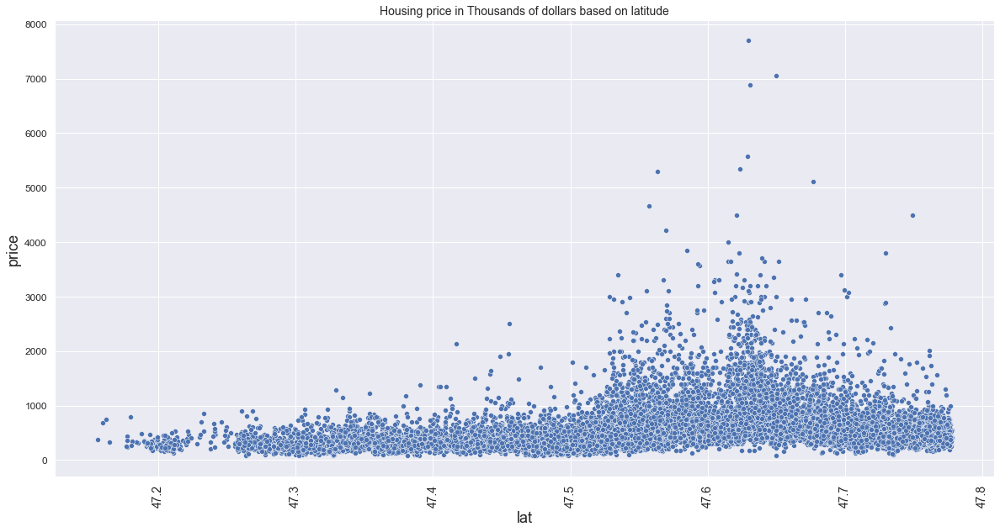

In [93]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.scatterplot(data=df,y=df['price']/1000, x=df['lat'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on latitude", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

**Observations:**
- The price seems to be higher around the latitude 47.6,

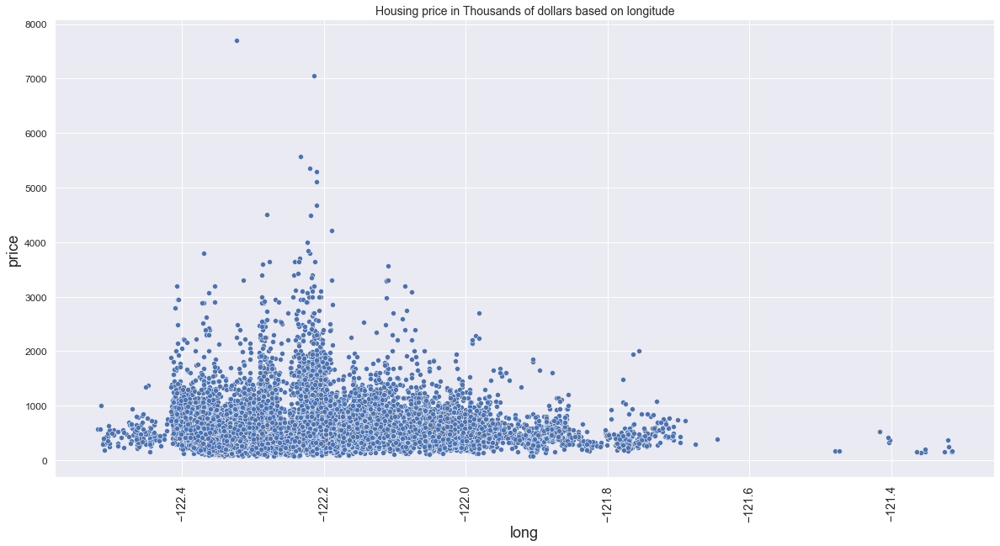

In [94]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.scatterplot(data=df,y=df['price']/1000, x=df['long'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on longitude", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

**Observations:**
- Housing price seems to be a bit higher around the -122.2 longitude

In [95]:
# creating data frame to plot coordinates
lat_long_df=df[['lat', 'long']]

In [96]:
fig=px.scatter_geo(df, lat='lat', lon='long',hover_data= lat_long_df)
fig.update_layout(title = 'Area of study: Seattle- Tacoma metro area',  title_x=0.5)
fig.show()

In [97]:
#save map
fig.write_html(r"C:\Users\charo\OneDrive\Escritorio\Python\Capstone _Project_Maria_Rosario_Marin_Marmol. Housing_Price_Regression_files.html")

**Observations:**

- The most expensive houses are located in the area of Medina, in Seattle- Tacoma metro area, which is exactly the same information we could find out by using the zip code variable.


### 14.Housing Price vs on year of sale

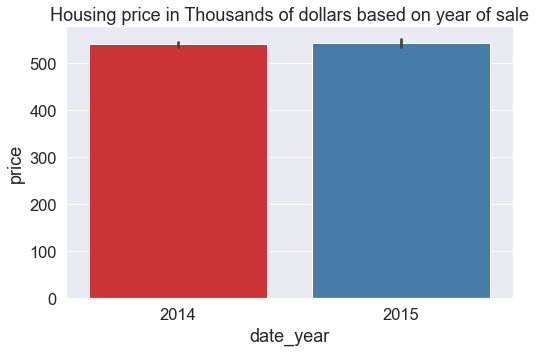

In [98]:
plt.figure(figsize=(8,5))
sns.barplot(data=df, y=df['price']/1000, x=df['date_year'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on year of sale")
plt.show()

In [99]:
# finding mean house value per year of sale 
df_sale_year=df.groupby('date_year')['price'].mean()
df_sale_year

date_year
2014   539280.46
2015   542072.50
Name: price, dtype: float64

**Observations:**

- The mean housing price is not much different from houses sold in 2014 and 2015.
- As we can see 2015 houses are just slightly more expensive in average, with a mean value of 542,072 dollars while for 2014 the average value is 539,280 dollars.
- Data is given in nominal value, so values are not adjusted to correct the effect for inflation


### 15.Housing price vs month of sale

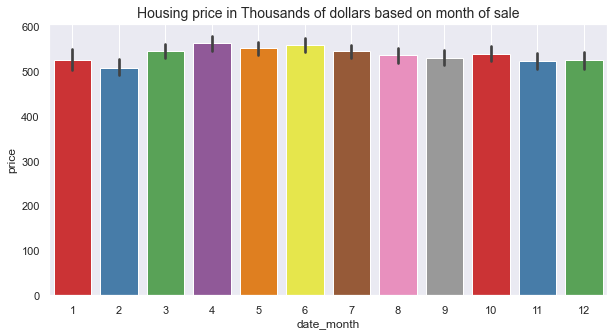

In [100]:
plt.figure(figsize=(10,5))
sns.set(font_scale=1)
sns.barplot(data=df, y=df['price']/1000, x=df['date_month'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars based on month of sale", fontsize= 14)
plt.grid()
plt.show()

In [101]:
# finding mean house price per month of sale 
df_sale_month=df.groupby('date_month')['price'].mean().sort_values(ascending=False)
df_sale_month

date_month
4    561933.46
6    558123.74
5    550849.75
7    544892.16
3    544057.68
10   539127.48
8    536527.04
9    529315.87
1    525963.25
12   524602.89
11   522058.86
2    507919.60
Name: price, dtype: float64

**Observation:**
    
- In regards with the months of sale, there is not a big different in terms of the average price.
- In April, June and May we find the prices a little bit higher.
- In February and November, the prices are slightly lower.


### 16.  Housing Price vs total living space, lot space and basement square footage

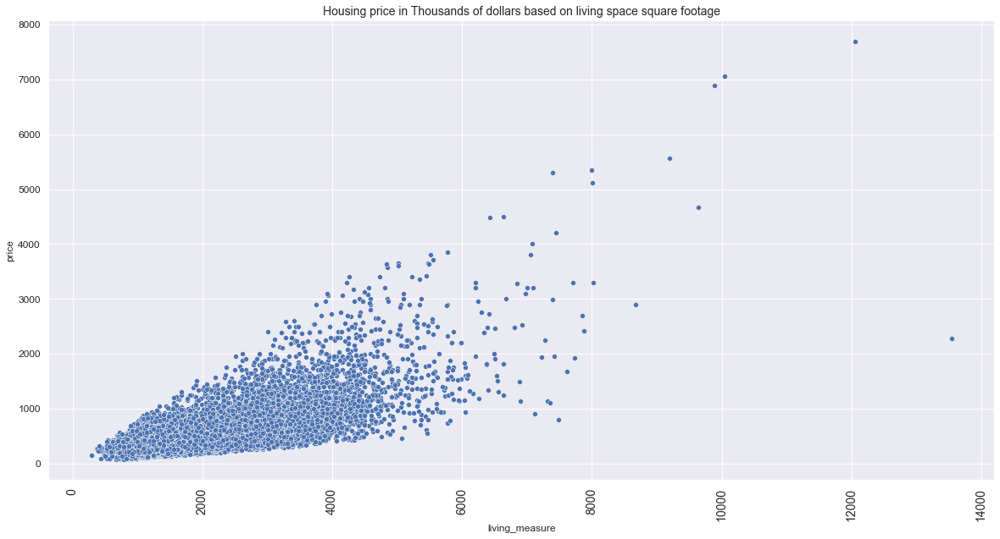

In [102]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1)
sns.scatterplot(data=df,y=df['price']/1000, x=df['living_measure'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on living space square footage", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

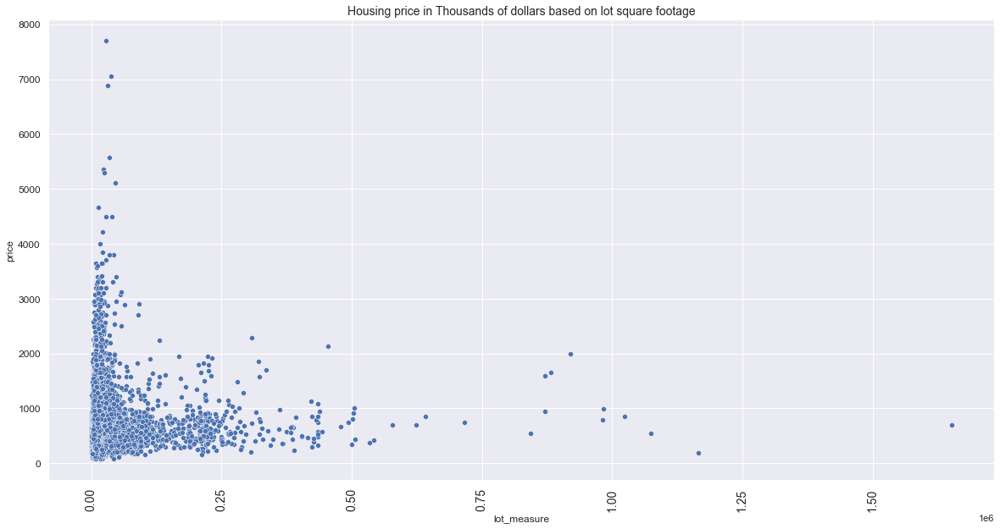

In [103]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1)
sns.scatterplot(data=df,y=df['price']/1000, x=df['lot_measure'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on lot square footage", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

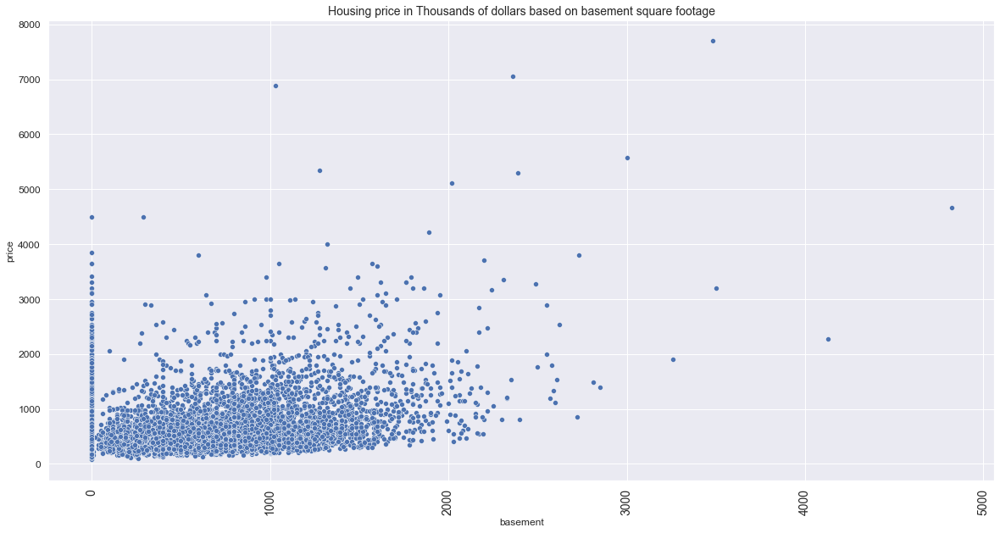

In [104]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1)
sns.scatterplot(data=df,y=df['price']/1000, x=df['basement'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on basement square footage", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()


**Observations:**

- There is a clear relationship between the living square footage and the price. The higher prices are observed for bigger living space.
- The lot dimensions do not seem to show such a strong relationship with housing price. If we check the data points, we can find lots of houses with smaller lot dimension and higher prices. Also, some properties with big lot space and lower prices.
- Basement size seems to have a positive relation with the house price, but also there are houses with no basement and very high prices in the data set for the geographical area of study.


### 17. Housing price and renovated living area (living_measure15)

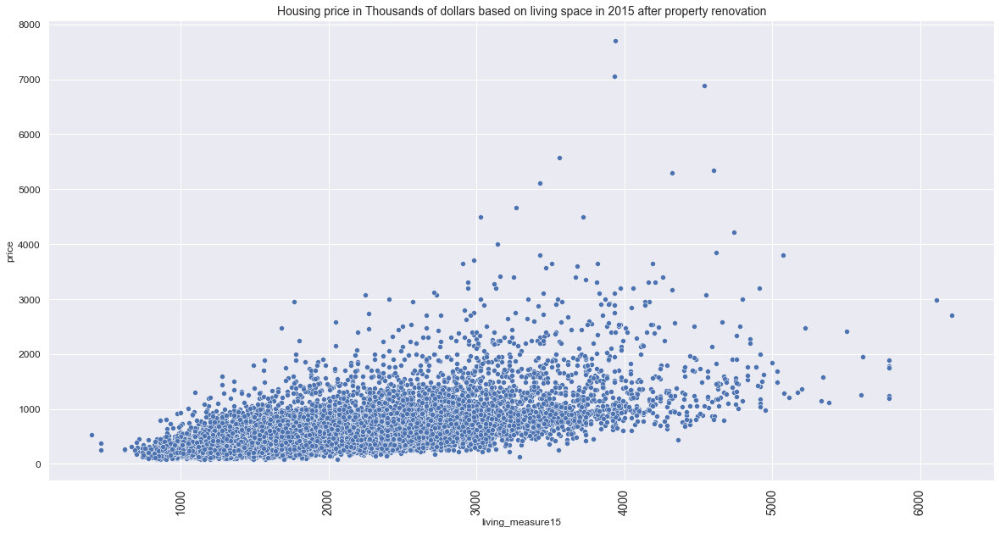

In [105]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1)
sns.scatterplot(data=df,y=df['price']/1000, x=df['living_measure15'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on living space in 2015 after property renovation", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

**Observation:**
- As we saw in the previous pair plot, the living_measure15 distribution is very similar to the living_measure15 so the relation with the price variable is not much different, but slightly less correlated.
- The bigger the living space after renovation the more expensive will be the property.

### 18. Housing price and furnished houses

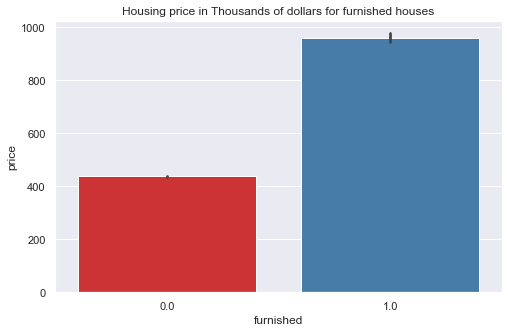

In [106]:
plt.figure(figsize=(8,5))
sns.barplot(data=df, y=df['price']/1000, x=df['furnished'], palette= 'Set1')
plt.title ("Housing price in Thousands of dollars for furnished houses")
plt.show()

In [107]:
# finding mean house price for funished homes and unfurnished houses
df_furnished=df.groupby('furnished')['price'].mean().sort_values(ascending=False)
df_furnished

furnished
1.0   960565.75
0.0   437277.81
Name: price, dtype: float64

**Observation:**
    
- As expected, the house prices increase for furnished houses.
- The average price of a furnished house double the mean value of a house sold without furniture (96,565 dollars and 437,respectivelly).


### 18. Housing price per month and year

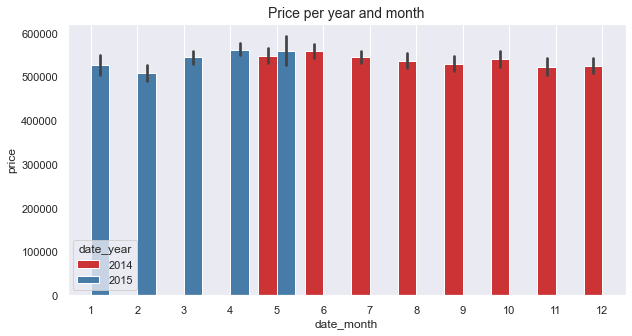

In [108]:
plt.figure(figsize=(10, 5))
sns.barplot(
    data=df,
    x=df["date_month"],
    y=df["price"],
    hue=df["date_year"],
    palette="Set1",
)
plt.title('Price per year and month', fontsize=14)
plt.grid()
plt.show()


In [109]:
#Checking dates of purchase for both years
df['dayhours'].sample(100, random_state=0).head(10)

17384   2015-03-12
722     2014-05-29
2680    2015-03-24
18754   2014-10-07
14554   2014-06-24
16227   2014-08-14
6631    2015-04-09
19813   2014-11-21
3367    2014-06-26
21372   2014-09-11
Name: dayhours, dtype: category
Categories (372, datetime64[ns]): [2014-05-02, 2014-05-03, 2014-05-04, 2014-05-05, ..., 2015-05-14, 2015-05-15, 2015-05-24, 2015-05-27]

**Observations:**

- The data provided in the data frame correspond is limited to 13 months, starting in May 2014, and finishing in May 2015.
- Information for early months in 2014 and late months in 2015 would make the analysis more complete, because we cannot complete data for same month is different years.


# PART II: DATA PRE-PROCESSING AND DATA ENGINEERING.

## 1. MISSING VALUES TREATMENT

In [110]:
df.isnull().sum()

cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 72
coast                31
sight                57
condition            85
quality               1
ceil_measure          1
basement              1
yr_built             15
yr_renovated          0
zipcode               0
lat                   0
long                 34
living_measure15    166
lot_measure15        29
furnished            29
total_area           68
date_month            0
date_year             0
date_day              0
dtype: int64

In [111]:
# create a copy of the data set before transformation.
df1=df.copy()

### 1.1 Variable 'Ceil', number of floors missing values 

In [112]:
df1[df1['ceil'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
193,1023059313.00,2015-02-05,390000.00,3.00,2.50,1910.00,4755.00,NaN,NaN,0.00,3.00,8.00,1910.00,0.00,1997.00,0.00,98059.00,47.50,-122.16,2460.00,6099.00,0.00,6665.00,2,2015,5
271,9187200275.00,2015-04-20,905000.00,4.00,2.25,2240.00,NaN,NaN,0.00,0.00,3.00,8.00,1770.00,470.00,1900.00,2014.00,98122.00,47.60,-122.30,2120.00,5000.00,0.00,7240.00,4,2015,20
834,3066200440.00,2014-06-08,684680.00,4.00,2.25,2370.00,NaN,NaN,0.00,0.00,4.00,8.00,2370.00,0.00,1979.00,0.00,98052.00,47.65,-122.12,2370.00,9720.00,0.00,11730.00,6,2014,8
929,1455600030.00,2015-01-08,645000.00,4.00,2.00,2780.00,NaN,NaN,0.00,3.00,3.00,8.00,1190.00,1590.00,1955.00,0.00,98125.00,47.73,-122.28,2580.00,10241.00,0.00,14363.00,1,2015,8
1041,4058801065.00,2014-08-08,272000.00,3.00,2.00,1200.00,NaN,NaN,0.00,0.00,5.00,7.00,1200.00,0.00,1942.00,0.00,98178.00,47.50,-122.24,1190.00,6384.00,0.00,6900.00,8,2014,8
1241,8838900032.00,2014-05-18,732000.00,3.00,2.00,1940.00,55756.00,NaN,NaN,0.00,5.00,9.00,1940.00,0.00,1954.00,0.00,98007.00,47.59,-122.15,2330.00,10018.00,1.00,57696.00,5,2014,18
1529,240000058.00,2015-04-08,469000.00,4.00,2.75,3550.00,NaN,NaN,0.00,0.00,5.00,8.00,2100.00,1450.00,1966.00,0.00,98188.00,47.42,-122.28,2050.00,9000.00,0.00,17488.00,4,2015,8
1835,1025079074.00,2014-12-02,510000.00,3.00,2.00,2350.00,NaN,NaN,0.00,0.00,3.00,7.00,2350.00,0.00,1983.00,0.00,98014.00,47.66,-121.89,2270.00,222156.00,0.00,268501.00,12,2014,2
1927,4217400590.00,2014-11-18,589000.00,3.00,1.50,1390.00,5040.00,NaN,NaN,0.00,3.00,7.00,1090.00,300.00,1947.00,0.00,98105.00,47.66,-122.28,1910.00,4800.00,0.00,6430.00,11,2014,18
2458,1115600130.00,2014-09-30,415000.00,4.00,2.50,2891.00,NaN,NaN,0.00,0.00,3.00,9.00,2891.00,0.00,2014.00,0.00,98001.00,47.34,-122.26,2550.00,8383.00,1.00,9390.00,9,2014,30


In [113]:
df1['ceil'].fillna(df1['ceil'].mode()[0], inplace=True)

**Observations:**
- We fill in the null values with the most frequent number of levels for the 'ceil' column, which is 1 level ( the values is the mode, since 'ceil' is a category.

### 1.2  Variables 'room_bath' and 'room_bed" missing values - number of bathrooms and  bedrooms

#### a Missing values for number of bathrooms

In [114]:
# Checking for missing values
df1['room_bath'].value_counts(dropna=False).sort_values(ascending=True).head(12)

7.75     1
7.50     1
6.25     2
6.50     2
8.00     2
6.75     2
0.50     4
5.75     4
6.00     6
1.25     9
5.50    10
0.00    10
Name: room_bath, dtype: int64

**Observation:**
- Number of bathrooms contains 108 missing values and also 10 zeros. A house needs to have bathrooms so we need to treat the zeros as missing values.


In [115]:
df1['room_bath']=df1['room_bath'].replace({0: np.nan})

In [116]:
df1['room_bath'].value_counts(dropna=False).sort_values(ascending=True).head(12)

7.75     1
7.50     1
6.25     2
6.50     2
8.00     2
6.75     2
0.50     4
5.75     4
6.00     6
1.25     9
5.50    10
5.25    13
Name: room_bath, dtype: int64

In [117]:
#showing data frame for null bath values
df1[df1['room_bath'].isnull().values].head(20)


,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
131,2768100510.00,2015-04-02,649000.00,NaN,NaN,1530.00,1442.00,3.00,0.00,0.00,3.00,9.00,1530.00,0.00,NaN,0.00,98107.00,47.67,-122.37,NaN,1456.00,1.00,2972.00,4,2015,2
300,8813400245.00,2015-02-27,635000.00,NaN,NaN,1210.00,4400.00,1.50,0.00,0.00,4.00,8.00,1210.00,0.00,1930.00,0.00,98105.00,47.66,-122.29,NaN,3750.00,0.00,5610.00,2,2015,27
571,3881900321.00,2014-05-14,339950.00,NaN,NaN,1050.00,5402.00,1.50,0.00,NaN,NaN,7.00,1050.00,0.00,1906.00,0.00,98144.00,47.59,-122.31,NaN,4685.00,0.00,6452.00,5,2014,14
660,9368700006.00,2015-03-24,375000.00,NaN,NaN,2230.00,7560.00,1.00,0.00,NaN,NaN,7.00,1230.00,1000.00,1959.00,0.00,98178.00,47.51,-122.26,NaN,6570.00,0.00,9790.00,3,2015,24
1451,2419600075.00,2014-12-01,465000.00,NaN,NaN,NaN,6360.00,1.00,0.00,0.00,3.00,7.00,1480.00,0.00,1954.00,0.00,98133.00,47.73,-122.35,1480.00,6360.00,0.00,7840.00,12,2014,1
1817,7443000480.00,2015-05-07,865000.00,NaN,NaN,NaN,5527.00,2.00,0.00,0.00,3.00,8.00,2130.00,620.00,1901.00,1987.00,98119.00,47.65,-122.37,1290.00,1764.00,0.00,8277.00,5,2015,7
1841,7634800070.00,2015-01-16,453000.00,NaN,NaN,1820.00,16300.00,1.00,0.00,0.00,4.00,7.00,1220.00,600.00,NaN,0.00,98166.00,47.46,-122.36,NaN,16300.00,0.00,18120.00,1,2015,16
1906,7905200205.00,2014-10-21,410000.00,NaN,NaN,1230.00,7020.00,1.00,0.00,0.00,3.00,7.00,1090.00,140.00,NaN,0.00,98116.00,47.57,-122.39,NaN,5850.00,0.00,8250.00,10,2014,21
2092,3463400330.00,2015-04-16,460000.00,NaN,NaN,2930.00,29136.00,2.00,0.00,0.00,3.00,8.00,2240.00,690.00,1990.00,0.00,98010.00,47.31,-122.04,NaN,29362.00,0.00,32066.00,4,2015,16
2099,4046601010.00,2014-10-23,399950.00,NaN,NaN,2450.00,15001.00,1.00,0.00,0.00,NaN,7.00,1980.00,470.00,1989.00,0.00,98014.00,47.70,-121.91,NaN,15323.00,0.00,17451.00,10,2014,23


**Observations:**

- We can see that frequently number of bathrooms and number of bethrooms are missing for the same houses.

- Based on the prior data, we are going to fill the bedroom and bathroom missing values with the average number of bathrooms and bedrooms found for each number house levels.

#### b Missing values for number of bathrooms

In [118]:
#Checking number of bathrooms based on the number of floors.
subset_bath= df1.groupby('ceil')['room_bath'].mean()
subset_bath

ceil
1.0   1.76
1.5   1.77
2.0   2.62
2.5   2.84
3.0   2.49
3.5   2.89
Name: room_bath, dtype: float64

In [119]:
# replacing null values for bathrooms on one level house
df1.loc[df1['ceil']==1, ['room_bath']]=df1.loc[df1['ceil']==1, ['room_bath']].replace(np.nan,1.76)

In [120]:
# replacing null values for bathrooms on 1.5 level house
df1.loc[df1['ceil']==1.5, ['room_bath']]=df1.loc[df1['ceil']==1.5, ['room_bath']].replace(np.nan,1.77)

In [121]:
# replacing null values for bathrooms on 2 levels house
df1.loc[df1['ceil']==2, ['room_bath']]=df1.loc[df1['ceil']==2, ['room_bath']].replace(np.nan,2.62)

In [122]:
# replacing null values for bathrooms on 2.5 levels house
df1.loc[df1['ceil']==2.5, ['room_bath']]=df1.loc[df1['ceil']==2.5, ['room_bath']].replace(np.nan,2.84)

In [123]:
# replacing null values for bathrooms on 3 levels house
df1.loc[df1['ceil']==3, ['room_bath']]=df1.loc[df1['ceil']==3, ['room_bath']].replace(np.nan,2.49)

In [124]:
# replacing null values for bathrooms on 3.5 levels house
df1.loc[df1['ceil']==3.5, ['room_bath']]=df1.loc[df1['ceil']==3.5, ['room_bath']].replace(np.nan,2.89)

In [125]:
# Checking for missing values on the bathroom column
df1['room_bath'].isnull().any()

False

**Observations:**
- As we can see all missing values have been replaced with the average number of bathrooms per house style (based on number of floors)

**Missing values in number of bedrooms**

In [126]:
#showing data frame for null bath values
subset_bed=df1[df1['room_bed'].isnull().values]
subset_bed.head(10)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
131,2768100510.00,2015-04-02,649000.00,NaN,2.49,1530.00,1442.00,3.00,0.00,0.00,3.00,9.00,1530.00,0.00,NaN,0.00,98107.00,47.67,-122.37,NaN,1456.00,1.00,2972.00,4,2015,2
300,8813400245.00,2015-02-27,635000.00,NaN,1.77,1210.00,4400.00,1.50,0.00,0.00,4.00,8.00,1210.00,0.00,1930.00,0.00,98105.00,47.66,-122.29,NaN,3750.00,0.00,5610.00,2,2015,27
571,3881900321.00,2014-05-14,339950.00,NaN,1.77,1050.00,5402.00,1.50,0.00,NaN,NaN,7.00,1050.00,0.00,1906.00,0.00,98144.00,47.59,-122.31,NaN,4685.00,0.00,6452.00,5,2014,14
660,9368700006.00,2015-03-24,375000.00,NaN,1.76,2230.00,7560.00,1.00,0.00,NaN,NaN,7.00,1230.00,1000.00,1959.00,0.00,98178.00,47.51,-122.26,NaN,6570.00,0.00,9790.00,3,2015,24
1451,2419600075.00,2014-12-01,465000.00,NaN,1.76,NaN,6360.00,1.00,0.00,0.00,3.00,7.00,1480.00,0.00,1954.00,0.00,98133.00,47.73,-122.35,1480.00,6360.00,0.00,7840.00,12,2014,1
1817,7443000480.00,2015-05-07,865000.00,NaN,2.62,NaN,5527.00,2.00,0.00,0.00,3.00,8.00,2130.00,620.00,1901.00,1987.00,98119.00,47.65,-122.37,1290.00,1764.00,0.00,8277.00,5,2015,7
1841,7634800070.00,2015-01-16,453000.00,NaN,1.76,1820.00,16300.00,1.00,0.00,0.00,4.00,7.00,1220.00,600.00,NaN,0.00,98166.00,47.46,-122.36,NaN,16300.00,0.00,18120.00,1,2015,16
1906,7905200205.00,2014-10-21,410000.00,NaN,1.76,1230.00,7020.00,1.00,0.00,0.00,3.00,7.00,1090.00,140.00,NaN,0.00,98116.00,47.57,-122.39,NaN,5850.00,0.00,8250.00,10,2014,21
2092,3463400330.00,2015-04-16,460000.00,NaN,2.62,2930.00,29136.00,2.00,0.00,0.00,3.00,8.00,2240.00,690.00,1990.00,0.00,98010.00,47.31,-122.04,NaN,29362.00,0.00,32066.00,4,2015,16
2099,4046601010.00,2014-10-23,399950.00,NaN,1.76,2450.00,15001.00,1.00,0.00,0.00,NaN,7.00,1980.00,470.00,1989.00,0.00,98014.00,47.70,-121.91,NaN,15323.00,0.00,17451.00,10,2014,23


In [127]:
#Checking number of bedrooms based on the number of floors.
df1.groupby('ceil')['room_bed'].mean()

ceil
1.0   3.16
1.5   3.51
2.0   3.63
2.5   3.99
3.0   2.95
3.5   3.00
Name: room_bed, dtype: float64

In [128]:
# replacing null values for bedrooms on one level house
df1.loc[df1['ceil']==1, ['room_bed']]= df1.loc[df1['ceil']==1, ['room_bed']].replace(np.nan, 3.16)

In [129]:
# replacing null values for bedrooms on 1.5 level house
df1.loc[df1['ceil']==1.5, ['room_bed']]=df1.loc[df1['ceil']==1.5, ['room_bed']].replace(np.nan,3.51)

In [130]:
# replacing null values for bedrooms on 2 levels house
df1.loc[df1['ceil']==2, ['room_bed']]=df1.loc[df1['ceil']==2, ['room_bed']].replace(np.nan,3.63)

In [131]:
# replacing null values for bedrooms on 2.5 levels house
df1.loc[df1['ceil']==2.5, ['room_bed']]=df1.loc[df1['ceil']==2.5, ['room_bed']].replace(np.nan,3.99)

In [132]:
# replacing null values for bedrooms on 3 levels house
df1.loc[df1['ceil']==3, ['room_bed']]=df1.loc[df1['ceil']==3, ['room_bed']].replace(np.nan,2.95)

In [133]:
# replacing null values for bedrooms on 3.5 levels house
df1.loc[df1['ceil']==3.5, ['room_bed']]=df1.loc[df1['ceil']==3.5, ['room_bed']].replace(np.nan,3.00)

In [134]:
df1['room_bed'].isnull().any()

False

**Observations:**
- All missing values have been replaced with the average number of bedrooms according to the mean number of bedrooms per house style ( based on number of floors).

### 1.3 Fixing missing values for continous variables with outliers.


In [135]:
# list of variable to be treated with the median value of the column
list_median_values=[['living_measure','lot_measure', 'ceil_measure','basement','living_measure15','lot_measure15', 'total_area']]

In [136]:
for i in list_median_values:
    m=df1[i].median()
    df1[i]=df1[i].replace(np.nan, m)

### 1.4 Fixing missing values for sight

In [137]:
df1[df1['sight'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
150,3622900200.00,2014-06-27,1200000.00,5.00,2.75,3650.00,13297.00,2.00,0.00,NaN,NaN,9.00,2750.00,900.00,1969.00,0.00,98040.00,47.55,-122.23,1840.00,11568.00,1.00,16947.00,6,2014,27
269,9161100730.00,2014-07-01,620000.00,4.00,3.00,2130.00,6325.00,1.00,0.00,NaN,NaN,7.00,1440.00,690.00,1948.00,0.00,98116.00,47.57,-122.40,1840.00,6325.00,0.00,8455.00,7,2014,1
571,3881900321.00,2014-05-14,339950.00,3.51,1.77,1050.00,5402.00,1.50,0.00,NaN,NaN,7.00,1050.00,0.00,1906.00,0.00,98144.00,47.59,-122.31,1840.00,4685.00,0.00,6452.00,5,2014,14
660,9368700006.00,2015-03-24,375000.00,3.16,1.76,2230.00,7560.00,1.00,0.00,NaN,NaN,7.00,1230.00,1000.00,1959.00,0.00,98178.00,47.51,-122.26,1840.00,6570.00,0.00,9790.00,3,2015,24
2146,4077800029.00,2014-10-27,630000.00,4.00,1.75,1930.00,10210.00,1.50,0.00,NaN,NaN,8.00,1670.00,260.00,1941.00,0.00,98125.00,47.71,-122.28,1840.00,6600.00,0.00,12140.00,10,2014,27
2577,1024069037.00,2014-09-15,525000.00,3.00,2.00,1600.00,16530.00,1.00,0.00,NaN,NaN,7.00,1600.00,0.00,1967.00,0.00,98075.00,47.58,-122.02,1840.00,41006.00,0.00,18130.00,9,2014,15
2848,3211000190.00,2014-10-01,310000.00,3.16,1.76,1490.00,9120.00,1.00,0.00,NaN,NaN,7.00,1490.00,0.00,1959.00,0.00,98059.00,47.48,-122.16,1840.00,8040.00,0.00,10610.00,10,2014,1
2883,2273600250.00,2014-08-04,500000.00,3.16,1.76,1570.00,8530.00,1.00,0.00,NaN,NaN,7.00,1190.00,380.00,1983.00,0.00,98033.00,47.69,-122.18,1840.00,8708.00,0.00,10100.00,8,2014,4
2999,8133700020.00,2014-07-02,496000.00,2.00,1.00,900.00,9260.00,1.00,0.00,NaN,NaN,7.00,900.00,0.00,1946.00,0.00,98107.00,47.67,-122.36,1840.00,6913.00,0.00,10160.00,7,2014,2
3010,7399200770.00,2014-12-09,417400.00,3.00,3.00,2680.00,12285.00,1.00,0.00,NaN,NaN,8.00,2680.00,0.00,1970.00,0.00,98055.00,47.46,-122.20,1840.00,9558.00,0.00,14965.00,12,2014,9


In [138]:
# checking average price to fill in the number of time a house was seen
df1.groupby('sight')['price'].mean()

sight
0.00    496554.08
1.00    812518.61
2.00    791860.88
3.00    972468.39
4.00   1466554.04
Name: price, dtype: float64

**Obsevations:**
- As we could see the higher the price the greater number of visits the houses received.
- We are the average price per visit in order to fill in the times that the houses have been seen to complete the missing values.
 

In [139]:
# for houses in the lower price range under 500,000 dollars
df1.loc[df1['price']<500000, ['sight']]=df1.loc[df1['price']<500000, ['sight']].replace(np.nan,0)

In [140]:
# for houses with prices above 1 million dollars we are fill in the number of visit with 4
df1.loc[df1['price']>1000000, ['sight']]=df1.loc[df1['price']<1000000, ['sight']].replace(np.nan,4)

In [141]:
# for houses in the middle range, from 500,000 to 1 Million we are using the middle value 2.
df1.loc[df1['price']>=500000, ['sight']]=df1.loc[df1['price']>=500000, ['sight']].replace(np.nan,2)

In [142]:
df1['sight'].isnull().any()

False

### 1.5 Variable 'Quality' missing values

In [143]:
df1[df1['quality'].isnull().values]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
21226,2474400250.00,2014-06-30,327500.00,3.00,2.25,2310.00,7618.00,1.00,NaN,0.00,NaN,NaN,1560.00,0.00,NaN,0.00,98031.00,47.41,-122.19,1960.00,7201.00,0.00,9510.00,6,2014,30


In [144]:
# Filling the missing values with the median value of the quality distribution (7)
df1['quality']=df1['quality'].replace (np.nan, df1['quality'].median())

In [145]:
df1['quality'].isnull().any()

False

### 1.6 Variable furnished missing values

In [146]:
df1[df1['furnished'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
455,7852180560.00,2015-04-24,403000.00,3.00,2.50,1700.00,4125.00,2.00,0.00,0.00,3.00,7.00,1700.00,0.00,2004.00,0.00,98065.00,47.53,-121.85,1840.00,7620.00,NaN,9575.00,4,2015,24
843,7856610200.00,2014-05-23,902000.00,4.00,2.25,2530.00,9200.00,1.00,0.00,0.00,5.00,9.00,1570.00,960.00,1976.00,0.00,98006.00,47.56,-122.15,1840.00,7620.00,NaN,9575.00,5,2014,23
860,9435300030.00,2014-05-28,550000.00,4.00,1.00,1660.00,34848.00,1.00,0.00,0.00,1.00,5.00,930.00,730.00,1933.00,0.00,98052.00,47.66,-122.13,1840.00,7620.00,NaN,9575.00,5,2014,28
2870,7234601544.00,2014-08-25,660000.00,3.00,3.00,2260.00,1825.00,2.00,0.00,0.00,3.00,8.00,1660.00,600.00,2002.00,0.00,98122.00,47.61,-122.31,1840.00,7620.00,NaN,9575.00,8,2014,25
5317,7559600200.00,2014-10-21,641000.00,4.00,2.50,2600.00,6015.00,2.00,0.00,0.00,3.00,8.00,2600.00,0.00,2004.00,0.00,98075.00,47.60,-122.03,1840.00,7620.00,NaN,9575.00,10,2014,21
5998,5379802816.00,2015-02-24,197000.00,4.00,1.00,1360.00,11175.00,1.00,0.00,0.00,3.00,7.00,1360.00,0.00,1961.00,0.00,98188.00,47.46,-122.27,1840.00,7620.00,NaN,9575.00,2,2015,24
6252,4022901316.00,2014-10-31,475000.00,3.00,2.50,2480.00,6031.00,2.00,0.00,0.00,3.00,8.00,2480.00,0.00,2001.00,0.00,98155.00,47.77,-122.30,1840.00,7620.00,NaN,9575.00,10,2014,31
7267,7852020670.00,2015-04-02,475000.00,3.00,2.75,1890.00,3938.00,2.00,0.00,0.00,3.00,8.00,1890.00,0.00,1999.00,0.00,98065.00,47.53,-121.87,1840.00,7620.00,NaN,9575.00,4,2015,2
9178,546000865.00,2014-09-19,556000.00,3.00,1.00,1800.00,4005.00,1.50,0.00,0.00,4.00,7.00,1160.00,640.00,1929.00,0.00,98117.00,47.69,-122.38,1840.00,7620.00,NaN,9575.00,9,2014,19
9665,7452500530.00,2015-02-19,250000.00,2.00,1.00,850.00,6370.00,1.00,0.00,0.00,3.00,6.00,850.00,0.00,1951.00,0.00,98126.00,47.52,-122.37,1840.00,7620.00,NaN,9575.00,2,2015,19


**Observations:**
- All missing values for furnished variable show the same pattern, same living area in 2015 and same total area.
- Let's check for houses with the same total area in data set to find out a pattern as well.

In [147]:
# Let's check the properties furnished with the same total area
df1[df1['total_area']==9575.00]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
128,1954440080.00,2015-01-29,532000.00,3.00,2.50,1830.00,8022.00,2.00,0.00,0.00,3.00,8.00,1830.00,0.00,1987.00,0.00,98074.00,47.62,-122.04,2030.00,7736.00,0.00,9575.00,1,2015,29
402,1257200290.00,2014-05-12,910000.00,3.00,2.00,2700.00,6120.00,1.00,0.00,0.00,4.00,8.00,1350.00,1350.00,1962.00,0.00,98115.00,47.67,-122.33,1700.00,4590.00,0.00,9575.00,5,2014,12
455,7852180560.00,2015-04-24,403000.00,3.00,2.50,1700.00,4125.00,2.00,0.00,0.00,3.00,7.00,1700.00,0.00,2004.00,0.00,98065.00,47.53,-121.85,1840.00,7620.00,NaN,9575.00,4,2015,24
578,191100250.00,2015-03-20,750000.00,4.00,2.25,2160.00,9525.00,1.00,0.00,0.00,3.00,8.00,1080.00,1080.00,1961.00,0.00,98040.00,47.57,-122.22,2780.00,9525.00,0.00,9575.00,3,2015,20
843,7856610200.00,2014-05-23,902000.00,4.00,2.25,2530.00,9200.00,1.00,0.00,0.00,5.00,9.00,1570.00,960.00,1976.00,0.00,98006.00,47.56,-122.15,1840.00,7620.00,NaN,9575.00,5,2014,23
860,9435300030.00,2014-05-28,550000.00,4.00,1.00,1660.00,34848.00,1.00,0.00,0.00,1.00,5.00,930.00,730.00,1933.00,0.00,98052.00,47.66,-122.13,1840.00,7620.00,NaN,9575.00,5,2014,28
1020,3034200410.00,2015-03-30,430000.00,3.00,1.00,940.00,12521.00,1.50,0.00,0.00,4.00,7.00,940.00,0.00,1949.00,0.00,98133.00,47.72,-122.33,1920.00,9046.00,0.00,9575.00,3,2015,30
1159,1853000300.00,2015-02-24,875000.00,3.00,2.75,3270.00,39586.00,1.50,0.00,0.00,3.00,11.00,3270.00,0.00,1988.00,0.00,98077.00,47.73,-122.08,3480.00,35998.00,1.00,9575.00,2,2015,24
1192,4137020360.00,2014-07-22,265000.00,3.00,2.50,1780.00,6527.00,2.00,0.00,0.00,3.00,8.00,1780.00,0.00,1989.00,0.00,98092.00,47.26,-122.22,2040.00,8840.00,0.00,9575.00,7,2014,22
2211,4055700784.00,2014-08-15,720000.00,4.00,2.50,3420.00,17038.00,2.00,0.00,0.00,3.00,9.00,3420.00,0.00,2007.00,0.00,98034.00,47.72,-122.24,2520.00,14190.00,1.00,9575.00,8,2014,15


**Observations:**
- Houses with quality equal or above 9 are furnished. We are going to fill the missing values the same way: furnished (1) for quality equal or above 9 and not furnished (0) for houses with lower quality.

In [148]:
df1.groupby('furnished')['quality'].value_counts()

furnished  quality
0.0        7.00       8973
           8.00       6056
           6.00       2035
           5.00        241
           4.00         29
           3.00          3
           1.00          1
1.0        9.00       2612
           10.00      1132
           11.00       399
           12.00        90
           13.00        13
Name: quality, dtype: int64

In [149]:
# for houses with higher quality (above 8) are funished 
df1.loc[df1['quality']>8, ['furnished']]=df1.loc[df1['quality']>8, ['furnished']].fillna(value=1)

In [150]:
# for houses with lower quality (below 9) are not  funished 
df1.loc[df1['quality']<9, ['furnished']]=df1.loc[df1['quality']<9, ['furnished']].fillna(value=0)

In [151]:
df1['furnished'].isnull().any()

False

### 1.7 Variable 'Condition' missing values

In [152]:
df1[df1['condition'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
150,3622900200.00,2014-06-27,1200000.00,5.00,2.75,3650.00,13297.00,2.00,0.00,2.00,NaN,9.00,2750.00,900.00,1969.00,0.00,98040.00,47.55,-122.23,1840.00,11568.00,1.00,16947.00,6,2014,27
269,9161100730.00,2014-07-01,620000.00,4.00,3.00,2130.00,6325.00,1.00,0.00,2.00,NaN,7.00,1440.00,690.00,1948.00,0.00,98116.00,47.57,-122.40,1840.00,6325.00,0.00,8455.00,7,2014,1
571,3881900321.00,2014-05-14,339950.00,3.51,1.77,1050.00,5402.00,1.50,0.00,0.00,NaN,7.00,1050.00,0.00,1906.00,0.00,98144.00,47.59,-122.31,1840.00,4685.00,0.00,6452.00,5,2014,14
660,9368700006.00,2015-03-24,375000.00,3.16,1.76,2230.00,7560.00,1.00,0.00,0.00,NaN,7.00,1230.00,1000.00,1959.00,0.00,98178.00,47.51,-122.26,1840.00,6570.00,0.00,9790.00,3,2015,24
2099,4046601010.00,2014-10-23,399950.00,3.16,1.76,2450.00,15001.00,1.00,0.00,0.00,NaN,7.00,1980.00,470.00,1989.00,0.00,98014.00,47.70,-121.91,1840.00,15323.00,0.00,17451.00,10,2014,23
2146,4077800029.00,2014-10-27,630000.00,4.00,1.75,1930.00,10210.00,1.50,0.00,2.00,NaN,8.00,1670.00,260.00,1941.00,0.00,98125.00,47.71,-122.28,1840.00,6600.00,0.00,12140.00,10,2014,27
2577,1024069037.00,2014-09-15,525000.00,3.00,2.00,1600.00,16530.00,1.00,0.00,2.00,NaN,7.00,1600.00,0.00,1967.00,0.00,98075.00,47.58,-122.02,1840.00,41006.00,0.00,18130.00,9,2014,15
2848,3211000190.00,2014-10-01,310000.00,3.16,1.76,1490.00,9120.00,1.00,0.00,0.00,NaN,7.00,1490.00,0.00,1959.00,0.00,98059.00,47.48,-122.16,1840.00,8040.00,0.00,10610.00,10,2014,1
2883,2273600250.00,2014-08-04,500000.00,3.16,1.76,1570.00,8530.00,1.00,0.00,2.00,NaN,7.00,1190.00,380.00,1983.00,0.00,98033.00,47.69,-122.18,1840.00,8708.00,0.00,10100.00,8,2014,4
2999,8133700020.00,2014-07-02,496000.00,2.00,1.00,900.00,9260.00,1.00,0.00,0.00,NaN,7.00,900.00,0.00,1946.00,0.00,98107.00,47.67,-122.36,1840.00,6913.00,0.00,10160.00,7,2014,2


**Observations:**

- We can see that for the missing values belonging to the 'condition' distribution, the living space in 2015 is 1840.0 square feetfor most of them (there are two expection with different living_measure values).
- Let's check what is the average value for a house with the previously mentioned living space for 2015 and let's use that value as a replacement for null values.


In [153]:
df1[df1['living_measure15']==1840].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
131,2768100510.00,2015-04-02,649000.00,2.95,2.49,1530.00,1442.00,3.00,0.00,0.00,3.00,9.00,1530.00,0.00,NaN,0.00,98107.00,47.67,-122.37,1840.00,1456.00,1.00,2972.00,4,2015,2
150,3622900200.00,2014-06-27,1200000.00,5.00,2.75,3650.00,13297.00,2.00,0.00,2.00,NaN,9.00,2750.00,900.00,1969.00,0.00,98040.00,47.55,-122.23,1840.00,11568.00,1.00,16947.00,6,2014,27
203,1823059223.00,2014-05-20,291000.00,3.00,1.75,1560.00,9788.00,1.00,0.00,0.00,3.00,7.00,1560.00,0.00,1964.00,0.00,98178.00,47.49,-122.23,1840.00,11180.00,0.00,11348.00,5,2014,20
269,9161100730.00,2014-07-01,620000.00,4.00,3.00,2130.00,6325.00,1.00,0.00,2.00,NaN,7.00,1440.00,690.00,1948.00,0.00,98116.00,47.57,-122.40,1840.00,6325.00,0.00,8455.00,7,2014,1
300,8813400245.00,2015-02-27,635000.00,3.51,1.77,1210.00,4400.00,1.50,0.00,0.00,4.00,8.00,1210.00,0.00,1930.00,0.00,98105.00,47.66,-122.29,1840.00,3750.00,0.00,5610.00,2,2015,27
382,5095400460.00,2014-07-23,390000.00,4.00,2.50,1840.00,15496.00,2.00,0.00,0.00,3.00,8.00,1840.00,0.00,1991.00,0.00,98059.00,47.47,-122.07,1840.00,15040.00,0.00,17336.00,7,2014,23
455,7852180560.00,2015-04-24,403000.00,3.00,2.50,1700.00,4125.00,2.00,0.00,0.00,3.00,7.00,1700.00,0.00,2004.00,0.00,98065.00,47.53,-121.85,1840.00,7620.00,0.00,9575.00,4,2015,24
505,3624039111.00,2015-04-29,215000.00,3.00,1.00,980.00,5600.00,1.00,0.00,0.00,2.00,6.00,980.00,0.00,1949.00,0.00,98106.00,47.53,-122.36,1840.00,5302.00,0.00,6580.00,4,2015,29
571,3881900321.00,2014-05-14,339950.00,3.51,1.77,1050.00,5402.00,1.50,0.00,0.00,NaN,7.00,1050.00,0.00,1906.00,0.00,98144.00,47.59,-122.31,1840.00,4685.00,0.00,6452.00,5,2014,14
660,9368700006.00,2015-03-24,375000.00,3.16,1.76,2230.00,7560.00,1.00,0.00,0.00,NaN,7.00,1230.00,1000.00,1959.00,0.00,98178.00,47.51,-122.26,1840.00,6570.00,0.00,9790.00,3,2015,24


**Observations:**
    
- The average condition rank for a house with a living space in 2015 of 1840 square feet is 3.

In [154]:
# Filling null values with the mode value for the condition variable based on houses with square feet living space in 2015 (1,840.0).
df1.loc[df1['living_measure15'], ['condition']]= df1.loc[df1['living_measure15'], ['condition']].fillna(value=3)

In [155]:
df1['condition'].isnull().any()

False

### 1.8 Variable 'yr_built' missing values - Year built 

In [156]:
df1[df1['yr_built'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
131,2768100510.00,2015-04-02,649000.00,2.95,2.49,1530.00,1442.00,3.00,0.00,0.00,3.00,9.00,1530.00,0.00,NaN,0.00,98107.00,47.67,-122.37,1840.00,1456.00,1.00,2972.00,4,2015,2
1841,7634800070.00,2015-01-16,453000.00,3.16,1.76,1820.00,16300.00,1.00,0.00,0.00,3.00,7.00,1220.00,600.00,NaN,0.00,98166.00,47.46,-122.36,1840.00,16300.00,0.00,18120.00,1,2015,16
1906,7905200205.00,2014-10-21,410000.00,3.16,1.76,1230.00,7020.00,1.00,0.00,0.00,3.00,7.00,1090.00,140.00,NaN,0.00,98116.00,47.57,-122.39,1840.00,5850.00,0.00,8250.00,10,2014,21
2407,1112000035.00,2015-03-11,420000.00,3.16,1.76,1000.00,5375.00,1.00,0.00,0.00,3.00,7.00,1000.00,0.00,NaN,0.00,98118.00,47.54,-122.27,1840.00,5000.00,0.00,6375.00,3,2015,11
2974,3524039060.00,2014-06-01,250000.00,3.16,1.76,750.00,4000.00,1.00,0.00,0.00,3.00,6.00,750.00,0.00,NaN,0.00,98136.00,47.52,-122.39,1840.00,4850.00,0.00,4750.00,6,2014,1
4529,3574801350.00,2014-11-20,410000.00,3.16,1.76,1410.00,8088.00,1.00,0.00,0.00,4.00,7.00,1410.00,0.00,NaN,0.00,98034.00,47.73,-122.23,1840.00,7401.00,0.00,9498.00,11,2014,20
5351,7843500070.00,2014-11-18,308000.00,3.63,2.62,1960.00,12243.00,2.00,0.00,0.00,5.00,8.00,1960.00,0.00,NaN,0.00,98042.00,47.34,-122.06,1840.00,12230.00,0.00,14203.00,11,2014,18
8205,8682230550.00,2014-09-16,428000.00,3.16,1.76,1350.00,4225.00,1.00,0.00,0.00,5.00,8.00,1350.00,0.00,NaN,0.00,98053.00,47.71,-122.03,1840.00,4225.00,0.00,5575.00,9,2014,16
13562,3760500516.00,2014-07-24,835000.00,3.16,1.76,3600.00,14720.00,1.00,0.00,2.00,3.00,8.00,1800.00,1800.00,NaN,0.00,98034.00,47.70,-122.23,1840.00,15358.00,0.00,18320.00,7,2014,24
13581,7224500375.00,2014-07-15,305000.00,3.16,1.76,1030.00,5350.00,1.00,0.00,0.00,4.00,7.00,1030.00,0.00,NaN,2009.00,98055.00,47.49,-122.21,1840.00,5250.00,0.00,6380.00,7,2014,15


**Observations:**
- Missing values for year built are showing common square feet for living space after 2015.
- Let's check what are the most common year of construction for the housing with 1840.00 square feet living space.

In [157]:
# most frequent year of built for houses with a living space of 1,840 squared feet.
df1[df1['living_measure15']==1840]['yr_built'].mode()[0]


1977.0

In [158]:
# Using the most frequent year (1977) to fill in the values
df1.loc[df1['living_measure15'], ['yr_built']]=df1.loc[df1['living_measure15'], ['yr_built']].replace(np.nan,1977)

In [159]:
#Checking for missing values
df1['yr_built'].isnull().any()

False

### 1.9 Variable 'Coast' missing values

In [160]:
df1[df1['coast'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
193,1023059313.00,2015-02-05,390000.00,3.00,2.50,1910.00,4755.00,1.00,NaN,0.00,4.00,8.00,1910.00,0.00,1990.00,0.00,98059.00,47.50,-122.16,2460.00,6099.00,0.00,6665.00,2,2015,5
1241,8838900032.00,2014-05-18,732000.00,3.00,2.00,1940.00,55756.00,1.00,NaN,0.00,4.00,9.00,1940.00,0.00,1954.00,0.00,98007.00,47.59,-122.15,2330.00,10018.00,1.00,57696.00,5,2014,18
1927,4217400590.00,2014-11-18,589000.00,3.00,1.50,1390.00,5040.00,1.00,NaN,0.00,3.00,7.00,1090.00,300.00,2007.00,0.00,98105.00,47.66,-122.28,1910.00,4800.00,0.00,6430.00,11,2014,18
3107,125069038.00,2014-11-25,2140000.00,4.00,3.75,5150.00,453895.00,1.00,NaN,2.00,4.00,11.00,4360.00,790.00,1980.00,0.00,98053.00,47.68,-121.99,2500.00,215186.00,1.00,459045.00,11,2014,25
3534,7636800041.00,2014-06-25,995000.00,3.00,4.50,4380.00,47044.00,1.00,NaN,3.00,3.00,9.00,3720.00,660.00,1957.00,1990.00,98166.00,47.47,-122.36,2460.00,18512.00,1.00,51424.00,6,2014,25
3569,2621760480.00,2014-10-14,367000.00,4.00,2.50,2350.00,8182.00,1.00,NaN,0.00,3.00,8.00,2350.00,0.00,1967.00,0.00,98042.00,47.37,-122.11,2330.00,7000.00,0.00,10532.00,10,2014,14
3791,7893804845.00,2015-02-23,340000.00,2.00,1.00,1700.00,6718.00,1.00,NaN,2.00,3.00,7.00,1230.00,470.00,2009.00,0.00,98198.00,47.41,-122.33,2040.00,7500.00,0.00,8418.00,2,2015,23
4115,1250202145.00,2014-08-28,1070000.00,2.00,2.25,3900.00,14864.00,1.00,NaN,2.00,3.00,8.00,1950.00,1950.00,2014.00,0.00,98144.00,47.59,-122.29,2580.00,5184.00,0.00,18764.00,8,2014,28
5467,1326049130.00,2014-07-02,605000.00,4.00,2.25,2940.00,48788.00,1.00,NaN,0.00,5.00,7.00,1520.00,1420.00,1911.00,0.00,98028.00,47.74,-122.25,2470.00,14900.00,0.00,51728.00,7,2014,2
5636,3797001702.00,2014-12-16,1070000.00,5.00,3.50,2920.00,3000.00,1.00,NaN,2.00,3.00,9.00,2260.00,660.00,2000.00,0.00,98103.00,47.68,-122.35,1580.00,4000.00,1.00,5920.00,12,2014,16


**Observations:**
- All houses with missing coast values are only one-level houses.
- As we initially found out, houses with water view are more expensive. Let's calculate the median price for water view houses and use it to separate the missing data into water view or not water view.


**Let's check the median price for houses near the water with 1 level.**

In [161]:
# subset of houses with 1 level
subset_ceil=df1[df1['ceil']==1]

In [162]:
# Median price for houses with 1 level and water view (1) and not water view (0)

subset_ceil.groupby('coast')['price'].median()

coast
0.0   389000.00
1.0   854750.00
Name: price, dtype: float64

**observations:**
- Median price for houses with water view and 1 level is  854750 dollars and we will use it to separate data into water view and not water view.

In [163]:
# houses with no water view
df1.loc[df1['price']<854750, ['coast']]=df1.loc[df1['price']<854750, ['coast']].fillna(value=0)

In [164]:
#Adding values to variable coast for houses with water view
df1.loc[df1['price']>=854750, ['coast']]=df1.loc[df1['price']>=854750, ['coast']].fillna(value=1)

In [165]:
df1['price'].isnull().any()

False

### 1.9 Variables 'long' missing values -longitude

In [166]:
df1[df1['long'].isnull().values].head(20)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day
5,8016250080.00,2014-07-09,245000.00,3.00,2.50,1610.00,7223.00,2.00,0.00,0.00,3.00,7.00,1610.00,0.00,2005.00,0.00,98030.00,47.37,NaN,1610.00,7162.00,0.00,8833.00,7,2014,9
1408,3782100035.00,2014-08-13,299000.00,3.00,1.00,960.00,8100.00,1.00,0.00,0.00,4.00,7.00,960.00,0.00,1925.00,0.00,98155.00,47.78,NaN,1080.00,8100.00,0.00,9060.00,8,2014,13
1961,2206700215.00,2015-04-22,550000.00,4.00,2.00,2070.00,9822.00,1.00,0.00,0.00,3.00,7.00,2070.00,0.00,2007.00,0.00,98006.00,47.57,NaN,1300.00,9572.00,0.00,11892.00,4,2015,22
5153,1941400080.00,2014-10-20,277000.00,3.00,2.25,1610.00,11920.00,1.00,0.00,0.00,3.00,7.00,1110.00,500.00,1948.00,0.00,98032.00,47.37,NaN,1690.00,11839.00,0.00,13530.00,10,2014,20
5413,1930301015.00,2015-04-28,818000.00,3.00,3.25,2200.00,4800.00,2.00,0.00,2.00,5.00,7.00,1910.00,290.00,1911.00,1996.00,98103.00,47.66,NaN,1410.00,4800.00,0.00,7000.00,4,2015,28
6362,3830630310.00,2014-07-25,260000.00,3.00,2.50,1670.00,5797.00,2.00,0.00,0.00,3.00,7.00,1670.00,0.00,1969.00,0.00,98030.00,47.35,NaN,1670.00,6183.00,0.00,7467.00,7,2014,25
7983,6072400280.00,2014-06-19,619850.00,4.00,2.50,2270.00,9247.00,1.00,0.00,0.00,4.00,8.00,1500.00,770.00,1927.00,0.00,98006.00,47.56,NaN,2270.00,9163.00,0.00,11517.00,6,2014,19
8230,567000660.00,2014-12-04,425000.00,4.00,2.00,1490.00,5300.00,1.00,0.00,0.00,4.00,7.00,1110.00,380.00,1983.00,0.00,98144.00,47.59,NaN,1330.00,1499.00,0.00,6790.00,12,2014,4
8586,5135000050.00,2014-08-01,960000.00,4.00,2.50,2820.00,5934.00,1.00,0.00,3.00,4.00,9.00,1770.00,1050.00,1990.00,0.00,98116.00,47.57,NaN,2230.00,6000.00,1.00,8754.00,8,2014,1
9930,1952000150.00,2014-05-06,530000.00,5.00,2.50,2910.00,9636.00,1.00,0.00,0.00,4.00,7.00,1690.00,1220.00,1964.00,0.00,98008.00,47.58,NaN,2830.00,10385.00,0.00,12546.00,5,2014,6


In [167]:
# Checking top long values
df1['long'].sort_values(ascending=True).head()

2958    -122.52
10194   -122.52
14816   -122.51
12374   -122.51
9521    -122.51
Name: long, dtype: float64

In [168]:
# checking lower values for variable long
df1['long'].sort_values(ascending=False).head()

20548   -121.31
14550   -121.31
5653    -121.32
19769   -121.32
20517   -121.32
Name: long, dtype: float64

**Observations:**
    
- We cannot find any clear pattern to fill in the missing values. 
- Because we are treating geographic data, we are going to use KNN imputer in order to use the average data of the nearest neighbors’ data points.

In [169]:
# Checking numeric variables
df1.select_dtypes(np.number).columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'quality', 'ceil_measure', 'basement',
       'yr_renovated', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'total_area'],
      dtype='object')

In [170]:
# creating a data frame to impute data
df_imp=df1[['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'quality', 'ceil_measure', 'basement',
       'yr_renovated', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'total_area']]

In [171]:
imputer=KNNImputer(n_neighbors=10)
Imputed_data=imputer.fit_transform(df_imp)

In [172]:
#changing array from KNN imputer result to data frame
df_imputed=pd.DataFrame(Imputed_data)
df_imputed.columns=df_imp.columns

In [173]:
# adding the imputed column long to df1 data frame to fill in missing data
df1['long']=df_imputed['long']

**There ara not missing values in df1 data frame**

In [174]:
df1.isnull().any()

cid                 False
dayhours            False
price               False
room_bed            False
room_bath           False
living_measure      False
lot_measure         False
ceil                False
coast               False
sight               False
condition           False
quality             False
ceil_measure        False
basement            False
yr_built            False
yr_renovated        False
zipcode             False
lat                 False
long                False
living_measure15    False
lot_measure15       False
furnished           False
total_area          False
date_month          False
date_year           False
date_day            False
dtype: bool

## 2.CREATING NEW VARIABLES

### 2.1. Varible 'ratio_bath_bed'.

In [175]:
# Variable to check the ratio of number of  bedrooms per bathrooms in each house
df1['ratio_bath_bed']=(df1['room_bed'])/(df1['room_bath'])
df1['ratio_bath_bed']=np.round(df1['ratio_bath_bed'],2)

**Observations:**
- This variable is indicating the number of bedrooms per bathroom in each house of the data set.
- Ideally, people would prefer a bathroom per bedroom. The higher this value is the better.
- Some houses may be studios, with not separate bedrooms, so their value would be 0.

### 2.2 Variable 'ratio_sight_condition'

In [176]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   cid               21613 non-null  float64 
 1   dayhours          21613 non-null  category
 2   price             21613 non-null  float64 
 3   room_bed          21613 non-null  float64 
 4   room_bath         21613 non-null  float64 
 5   living_measure    21613 non-null  float64 
 6   lot_measure       21613 non-null  float64 
 7   ceil              21613 non-null  category
 8   coast             21613 non-null  category
 9   sight             21613 non-null  float64 
 10  condition         21613 non-null  category
 11  quality           21613 non-null  float64 
 12  ceil_measure      21613 non-null  float64 
 13  basement          21613 non-null  float64 
 14  yr_built          21613 non-null  category
 15  yr_renovated      21613 non-null  float64 
 16  zipcode           2161

In [177]:
#Converting condition into a numeric variable
df1['condition']=df1['condition'].astype(np.number)
#Adding a new variable to data frame df1

df1['ratio_sight_condition']= (df1['sight'])/(df1['condition'])
df1['ratio_sight_condition']=np.round(df1['ratio_sight_condition'],2)

**Observations:**
- This ratio will show the number times that a house was visited in relation with the condition of the house.
- We will need to analyze the data and find out if the better the quality the more visits the house has received, because more people where interested.

### 2.3 Variable zip_area

In [178]:

# converting zipcode variable into a list
zipcode_2=df1['zipcode'].astype(int)
list_area=zipcode_2.tolist()

In [179]:
# Creating an empty list to iterate a  for loop and  store the first 3 digits of the zip code
list_zip=[]
for i in list_area:
    i=i/100
    i=str(i)
    z=i.split('.')
    list_zip.append(z[0])
    
     

In [180]:
df1['zip_area']=pd.Series(list_zip).astype('category')

**Observations:**
- We have separated the first 3 digits of the postal code or zip code in order to analyze data and try to find some patterns.
- Every zip code is associate to a different area. We could do some research and check how the zip code area is affected and the housing prices based on location.


### 2.4 Variable Indicator_condition_quality

### Creating bins for quality

In [181]:
#counting values for variable quality
df1['quality'].value_counts()

7.00     8982
8.00     6067
9.00     2615
6.00     2038
10.00    1134
11.00     399
5.00      242
12.00      90
4.00       29
13.00      13
3.00        3
1.00        1
Name: quality, dtype: int64

**Observations:**
- Quality variable contains many different values. We are simplifying the variable by putting the values in bins and stored as 'poor', 'good' and 'very_good'

In [182]:
# we create a list with the values and by using a for loop we will store them on a emptly list called qualitiy_2list
quality_list=df1['quality'].tolist()

In [183]:
quality_2list=[]
for i in quality_list:
    if i<=6:
        i='q_poor_'
        quality_2list.append(i)
    elif i>=9:
        i='q_very_good_'
        quality_2list.append(i)
    else:
        i='q_good_'
        quality_2list.append(i)
  
        

In [184]:
# Add new variable to data frame
df1['quality_2']=pd.Series(quality_2list)

### Creating bins for condition

In [185]:
#counting values for variable condition
df1['condition'].value_counts()

3.00    14143
4.00     5335
5.00     1905
1.00      175
2.00       55
Name: condition, dtype: int64

**Observations:**
- We have divided the condition values in 3 bins: poor for values 1 and 2, good for value 3 and very_good for values 4 and 5.

In [186]:
# we create a list with the values and by using a for loop we will store them on a emptly list called condition_2list
condition_list=df1['condition'].tolist()

In [187]:
condition_2list=[]
for i in condition_list:
    if i<=2:
        i='c_poor'
        condition_2list.append(i)
    elif i>=4:
        i='c_very_good'
        condition_2list.append(i)
    else:
        i='c_good'
        condition_2list.append(i)
       
   

In [188]:
# Add new variable to data frame
df1['condition_2']=pd.Series(condition_2list)

In [189]:

df1[['quality_2', 'condition_2']].head(10)

,quality_2,condition_2
0,q_good_,c_very_good
1,q_poor_,c_good
2,q_good_,c_good
3,q_good_,c_good
4,q_good_,c_good
5,q_good_,c_good
6,q_good_,c_very_good
7,q_very_good_,c_very_good
8,q_very_good_,c_very_good
9,q_good_,c_very_good


In [190]:
df1['quality_condition']=df1['quality_2']+df1['condition_2']


In [191]:
#changing to category
df1['quality_condition']=df1['quality_condition'].astype('category')

In [192]:
#Changing data type to category
df1['quality_2']=df1['quality_2'].astype('category')
df1['condition_2']=df1['condition_2'].astype('category')

**Observations:**
- We have created a new variable that would be a combination of quality and house condition.

### 2.5 Varible week of the year

In [193]:
# Check the counts for date_day variable
df1['date_day'].value_counts()

23    906
9     808
5     807
24    801
20    787
16    759
17    748
27    745
22    742
13    741
8     740
25    740
2     737
10    732
6     719
12    719
18    717
11    700
3     682
4     679
26    670
29    659
21    658
14    655
7     650
19    646
15    623
28    612
30    611
1     569
31    251
Name: date_day, dtype: int64

In [194]:
#divide the variable in bins for weeks of the month
list_day=df1['date_day'].to_list()


In [195]:
list_day2=[]
for i in list_day:
    if i in [1,2,3,4,5.6,7,8,9,10,11,12,13,14]:
        i='week1&2'
        list_day2.append(i)
    else:
        i='week3&4'
        list_day2.append(i)

In [196]:
df1['week_of_month']=pd.Series(list_day2).astype('category')

In [197]:
df1['week_of_month'].value_counts()

week3&4    13201
week1&2     8412
Name: week_of_month, dtype: int64

**Observations**
- We have created a new variable based on the week of the month that the house was purchased.
- First week and second week of the month are grouped toguether as week1&2 and week 3 and 4 are grouped as week3&4.

### 2.6 Variable Season of the year

In [198]:
# Check the counts for date_month variable
df1['date_month'].value_counts()

5     2414
4     2231
7     2211
6     2180
8     1940
10    1878
3     1875
9     1774
12    1471
11    1411
2     1250
1      978
Name: date_month, dtype: int64

In [199]:
list_month=df1['date_month'].tolist()

In [200]:
list_month2=[]
for i in list_month:
    if i in [12,1,2]:
        i= 'Winter'
        list_month2.append(i)   
    elif i in [3,4,5]:
        i= 'Spring'
        list_month2.append(i)
    elif i in [6,7,8]:
        i= 'Summer'
        list_month2.append(i)
    elif i in [9,10,11]:
        i= 'Fall'
        list_month2.append(i)
    else:
        break

In [201]:
df1['season']=pd.Series(list_month2).astype('category')

**Observations:**
- We have create another variable that contains the season of the year in which each house was purchased.

### 1.7 house_age

In [202]:
df1['yr_built'].value_counts().head(10)

1978.0    699
1992.0    638
1999.0    598
1990.0    572
1948.0    547
2000.0    530
2007.0    497
2005.0    466
1964.0    437
1969.0    413
Name: yr_built, dtype: int64

In [203]:
# Checking new houses data frame
df1[df1['yr_built']==2015]['yr_built'].value_counts()

2015.0    175
1973.0      0
1985.0      0
1984.0      0
1983.0      0
1982.0      0
1981.0      0
1980.0      0
1979.0      0
1978.0      0
1977.0      0
1976.0      0
1975.0      0
1974.0      0
1972.0      0
1901.0      0
1971.0      0
1970.0      0
1969.0      0
1968.0      0
1967.0      0
1966.0      0
1965.0      0
1964.0      0
1963.0      0
1962.0      0
1961.0      0
1960.0      0
1986.0      0
1987.0      0
1988.0      0
1989.0      0
2014.0      0
2013.0      0
2012.0      0
2011.0      0
2010.0      0
2009.0      0
2008.0      0
2007.0      0
2006.0      0
2005.0      0
2004.0      0
2003.0      0
2002.0      0
2001.0      0
2000.0      0
1999.0      0
1998.0      0
1997.0      0
1996.0      0
1995.0      0
1994.0      0
1993.0      0
1992.0      0
1991.0      0
1990.0      0
1959.0      0
1900.0      0
1957.0      0
1928.0      0
1926.0      0
1925.0      0
1924.0      0
1923.0      0
1922.0      0
1921.0      0
1920.0      0
1919.0      0
1918.0      0
1917.0      0
1916.0

In [204]:
df1['yr_built']=df1['yr_built'].astype('int')

In [205]:
df1['house_age']=2015-(df1['yr_built'])

In [206]:
df1['house_age'].value_counts().nunique()

96

In [207]:
df1['house_age'].value_counts().sort_values(ascending=False).head(20)

37    699
23    638
16    598
25    572
67    547
15    530
8     497
10    466
51    437
46    413
41    413
87    409
12    400
91    390
4     369
7     368
48    363
11    348
35    341
47    339
Name: house_age, dtype: int64

In [208]:
# comparing values among year built and house age
df1[['house_age', 'yr_built']].head(10)


,house_age,yr_built
0,39,1976
1,67,1948
2,67,1948
3,38,1977
4,38,1977
5,10,2005
6,39,1976
7,39,1976
8,25,1990
9,25,1990


**observations:**
- This variable shows the age of the houses of the data set.
- There are 175 houses built in 2015, those houses are brand new contruction.


### 1.8 reno_age

In [209]:
#adding a new variable to express how recent was the renovation
df1['reno_age']=2015-(df1['yr_renovated'])

In [210]:
#replace 2015 with 0 for houses renovated in 2015

df1['reno_age']= df1['reno_age'].replace({0:0.5})

In [211]:
#replace 2015 with 0 for houses no renovated

df1['reno_age']= df1['reno_age'].replace({2015:0})

In [212]:
df1['reno_age'].nunique()

70

In [213]:
df1['reno_age'].value_counts(ascending=False).head(10)

0.00     20699
1.00        91
2.00        37
12.00       36
8.00        35
15.00       35
10.00       35
11.00       26
25.00       25
9.00        24
Name: reno_age, dtype: int64

**Observations:**
    
- Most of the houses have not been renovated (0).
- Also value 0.5 indicates that the houses have been renovated in 2015.
- Depending on the type of regression we use for modeling, this variable may not be added because it does not work with linear regression. We may need to determine what variables to use.

In [214]:
#checking data types
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 36 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   cid                    21613 non-null  float64 
 1   dayhours               21613 non-null  category
 2   price                  21613 non-null  float64 
 3   room_bed               21613 non-null  float64 
 4   room_bath              21613 non-null  float64 
 5   living_measure         21613 non-null  float64 
 6   lot_measure            21613 non-null  float64 
 7   ceil                   21613 non-null  category
 8   coast                  21613 non-null  category
 9   sight                  21613 non-null  float64 
 10  condition              21613 non-null  float64 
 11  quality                21613 non-null  float64 
 12  ceil_measure           21613 non-null  float64 
 13  basement               21613 non-null  float64 
 14  yr_built               21613 non-null 

In [215]:
# cheking missing values
df1.isnull().sum()

cid                      0
dayhours                 0
price                    0
room_bed                 0
room_bath                0
living_measure           0
lot_measure              0
ceil                     0
coast                    0
sight                    0
condition                0
quality                  0
ceil_measure             0
basement                 0
yr_built                 0
yr_renovated             0
zipcode                  0
lat                      0
long                     0
living_measure15         0
lot_measure15            0
furnished                0
total_area               0
date_month               0
date_year                0
date_day                 0
ratio_bath_bed           0
ratio_sight_condition    0
zip_area                 0
quality_2                0
condition_2              0
quality_condition        0
week_of_month            0
season                   0
house_age                0
reno_age                 0
dtype: int64

**Observations:**
- We have added 7 additional categories and two numerical variables to the data frame.
- There are not missing values.
- We may use some of this variables only for the  purpose of analyzing data.


## 3. DATA ENGINEERING/ VARIABLE TRANSFORMATION

### 3.1 Checking outliers

In [216]:
df1.select_dtypes(np.number).columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'total_area', 'ratio_bath_bed',
       'ratio_sight_condition', 'house_age', 'reno_age'],
      dtype='object')

In [217]:
#creating a list to feed the continues predictor features in the boxplot 
list_out=[ 'price',  'living_measure',
       'lot_measure',  'ceil_measure',
       'basement', 'lat', 'long', 'living_measure15',
       'lot_measure15', 'total_area']

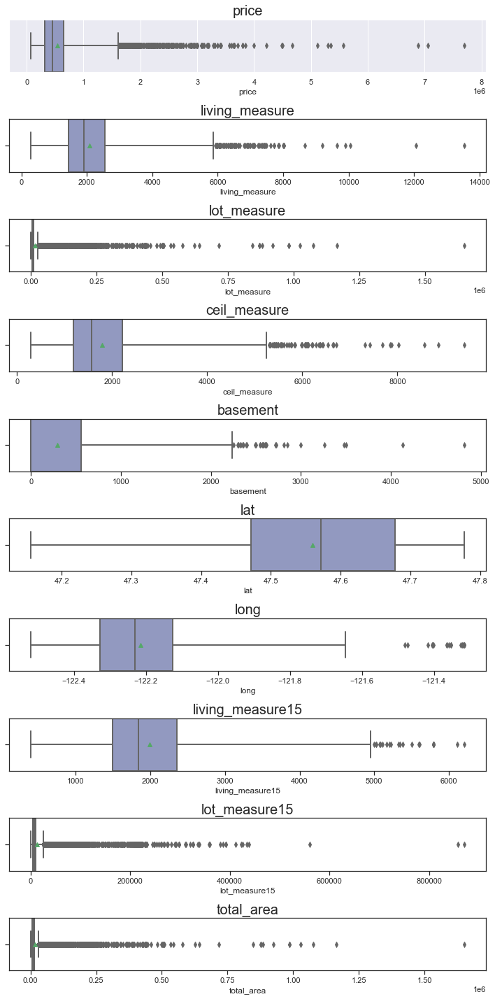

In [218]:
# checking outliers
 

plt.figure(figsize=(10,20))

for i in range(len(list_out)):
    plt.subplot(10, 1, i + 1)
    sns.boxplot(
    x=df1[list_out[i]],showmeans=True, palette ="BuPu",linewidth=2,
        saturation=0.8,
        width=1,whis=3)
    plt.title(list_out[i], fontsize=20)
    sns.set_theme(style="ticks")
    plt.tight_layout()

**Observations:**
- All variables contain outliers on the upper extreme.
- We are not going to cap and floor outliers because those values are also part of the general behavior of the data, instead, we are going to use log transformation to spread the data.

### 3.2.Variable transformation. Log transformation

In [219]:
# create a copy of df1
df2=df1.copy()

In [220]:
# data to apply log transformation for skewed variables
list_log_trans=['price',  'living_measure',
       'lot_measure',  'ceil_measure',
       'basement',  'living_measure15',
       'lot_measure15', 'total_area']

In [221]:
for col in list_log_trans:
    df2[col+'_log']=np.log(df2[col])

In [222]:
df2.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'date_month', 'date_year', 'date_day', 'ratio_bath_bed',
       'ratio_sight_condition', 'zip_area', 'quality_2', 'condition_2',
       'quality_condition', 'week_of_month', 'season', 'house_age', 'reno_age',
       'price_log', 'living_measure_log', 'lot_measure_log',
       'ceil_measure_log', 'basement_log', 'living_measure15_log',
       'lot_measure15_log', 'total_area_log'],
      dtype='object')

**Observations:**
- We are transforming the target variable with log function in order to deal with outlier and get a bell-shaped distribution since it is skewed.
- Other variables also high skewed needed the log transformation such as 'total_area' or ‘basement'.
- Log tranformation help scaling the data of large variables.


#### a.Target variable 'price'

In [223]:
# Create funtion to plot histogram in variable before and after tranformation
def hist(data, feature):
    """
    histogram
    data: dataframe
    feature: dataframe column

    """
    
    sns.histplot(data=data, x=feature,  color='darkblue') 

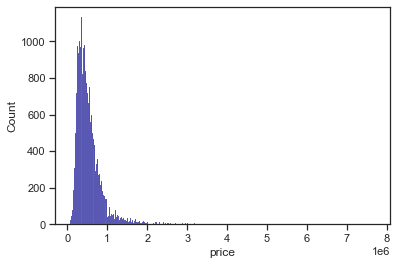

In [224]:
hist(df1, 'price')

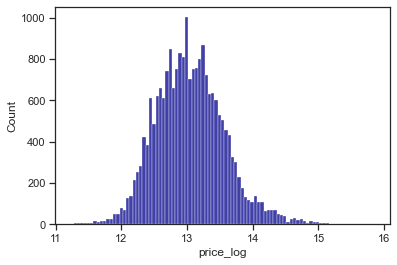

In [225]:
hist(df2, 'price_log')

**Observations:**

- The distribution has changed into a bell-shaped one, being normally distributed.

### b. Transformed Predictors

#### Variables before log transformation

In [226]:
# variables without log transformation
list_log_trans=[ 'living_measure',
       'lot_measure',  'ceil_measure',
       'basement',  'living_measure15',
       'lot_measure15', 'total_area']

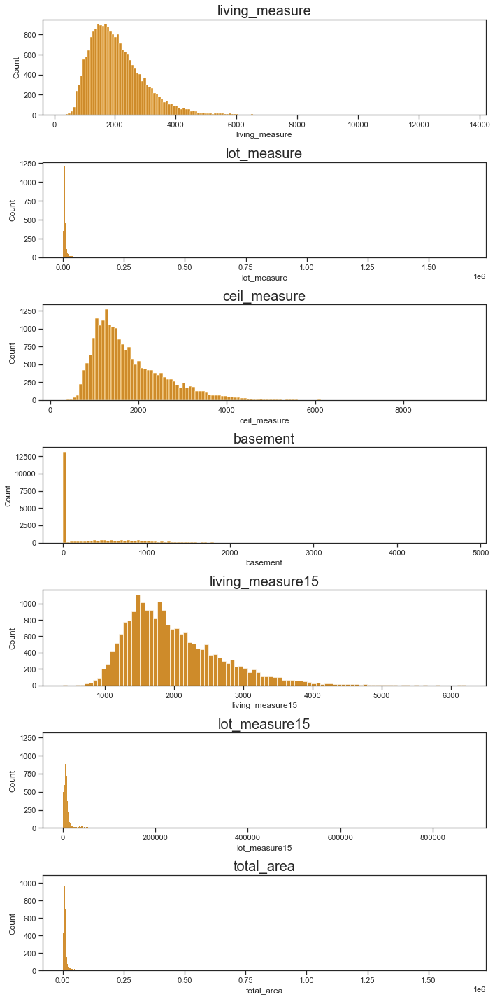

In [227]:

plt.figure(figsize=(10,20))

for i in range(len(list_log_trans)):
    plt.subplot(7, 1, i + 1)
    hist(df2,df2[list_log_trans[i]])
    sns.histplot(df2[list_log_trans[i]], color='orange')
    plt.title(list_log_trans[i], fontsize=20)
    plt.tight_layout()

#### Variables after log transformation

In [228]:
list_log1=[
       'living_measure_log', 'lot_measure_log', 'ceil_measure_log',
       'basement_log', 'living_measure15_log', 'lot_measure15_log',
       'total_area_log']

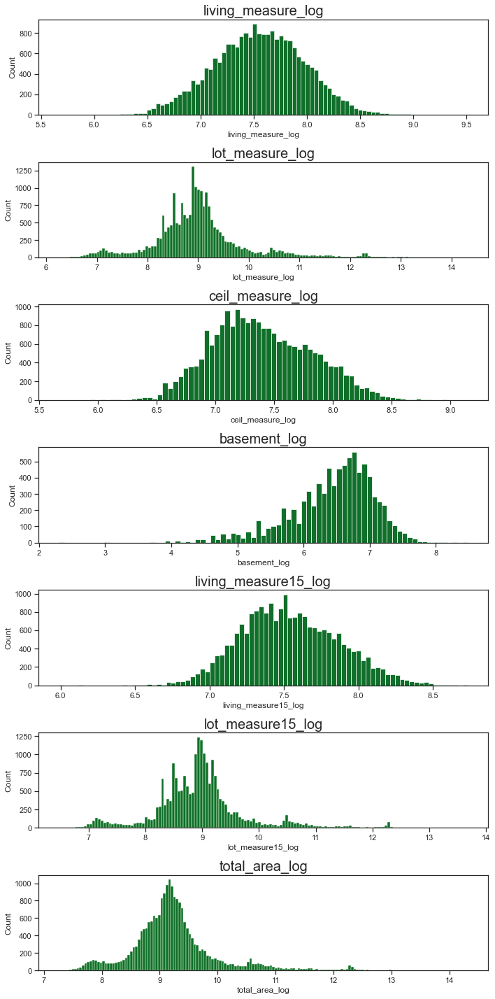

In [229]:
plt.figure(figsize=(10,20))

for i in range(len(list_log1)):
    plt.subplot(7, 1, i + 1)
    hist(df2,df2[list_log1[i]])
    sns.histplot(df2[list_log1[i]], color='green')
    plt.title(list_log1[i], fontsize=20)
    plt.tight_layout()

**Observations:**
- The variables are less skewed in general, and the data is more spread 



### Basement_log variable

In [230]:
df2.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day,ratio_bath_bed,ratio_sight_condition,zip_area,quality_2,condition_2,quality_condition,week_of_month,season,house_age,reno_age,price_log,living_measure_log,lot_measure_log,ceil_measure_log,basement_log,living_measure15_log,lot_measure15_log,total_area_log
0,3876100940.00,2015-04-27,600000.00,4.00,1.75,3050.00,9440.00,1.00,0.00,0.00,4.00,8.00,1800.00,1250.00,1976,0.00,98034.00,47.72,-122.18,2020.00,8660.00,0.00,12490.00,4,2015,27,2.29,0.00,980,q_good_,c_very_good,q_good_c_very_good,week3&4,Spring,39,0.00,13.30,8.02,9.15,7.50,7.13,7.61,9.07,9.43
1,3145600250.00,2015-03-17,190000.00,2.00,1.00,670.00,3101.00,1.00,0.00,0.00,3.00,6.00,670.00,0.00,1948,0.00,98118.00,47.55,-122.27,1660.00,4100.00,0.00,3771.00,3,2015,17,2.00,0.00,981,q_poor_,c_good,q_poor_c_good,week3&4,Spring,67,0.00,12.15,6.51,8.04,6.51,-inf,7.41,8.32,8.24
2,7129303070.00,2014-08-20,735000.00,4.00,2.75,3040.00,2415.00,2.00,1.00,4.00,3.00,8.00,3040.00,0.00,1948,0.00,98118.00,47.52,-122.26,2620.00,2433.00,0.00,5455.00,8,2014,20,1.45,1.33,981,q_good_,c_good,q_good_c_good,week3&4,Summer,67,0.00,13.51,8.02,7.79,8.02,-inf,7.87,7.80,8.60
3,7338220280.00,2014-10-10,257000.00,3.00,2.50,1740.00,3721.00,2.00,0.00,0.00,3.00,8.00,1740.00,0.00,1977,0.00,98002.00,47.34,-122.21,2030.00,3794.00,0.00,5461.00,10,2014,10,1.20,0.00,980,q_good_,c_good,q_good_c_good,week1&2,Fall,38,0.00,12.46,7.46,8.22,7.46,-inf,7.62,8.24,8.61
4,7950300670.00,2015-02-18,450000.00,2.00,1.00,1120.00,4590.00,1.00,0.00,0.00,3.00,7.00,1120.00,0.00,1977,0.00,98118.00,47.57,-122.28,1120.00,5100.00,0.00,5710.00,2,2015,18,2.00,0.00,981,q_good_,c_good,q_good_c_good,week3&4,Winter,38,0.00,13.02,7.02,8.43,7.02,-inf,7.02,8.54,8.65


In [231]:
# maximum value for variable basement
df2['basement_log'].max()

8.480529207044645

In [232]:
# minimum value for variable basement
df2['basement_log'].min()

-inf

**Observations:**

- After transformation basement_log have some values -inf so the transformation of  variable basement into a logarithmic variables is not appropriate. We are going to use the original variable for modeling.


In [233]:
data_scale=df2[['basement','total_area']]

In [234]:
#scaling varible basement
scaler = MinMaxScaler()
scaled_data=scaler.fit_transform(data_scale)

In [235]:
df_scaled=pd.DataFrame(scaled_data)
df_scaled.columns= data_scale.columns

In [236]:
#Adding variable to the data frame
df2['basement_scaled']=df_scaled['basement']

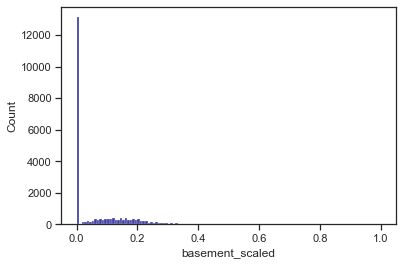

In [237]:
# Plotting variable basement_scaled.
hist(df2, 'basement_scaled')

In [238]:
df2.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,date_month,date_year,date_day,ratio_bath_bed,ratio_sight_condition,zip_area,quality_2,condition_2,quality_condition,week_of_month,season,house_age,reno_age,price_log,living_measure_log,lot_measure_log,ceil_measure_log,basement_log,living_measure15_log,lot_measure15_log,total_area_log,basement_scaled
0,3876100940.00,2015-04-27,600000.00,4.00,1.75,3050.00,9440.00,1.00,0.00,0.00,4.00,8.00,1800.00,1250.00,1976,0.00,98034.00,47.72,-122.18,2020.00,8660.00,0.00,12490.00,4,2015,27,2.29,0.00,980,q_good_,c_very_good,q_good_c_very_good,week3&4,Spring,39,0.00,13.30,8.02,9.15,7.50,7.13,7.61,9.07,9.43,0.26
1,3145600250.00,2015-03-17,190000.00,2.00,1.00,670.00,3101.00,1.00,0.00,0.00,3.00,6.00,670.00,0.00,1948,0.00,98118.00,47.55,-122.27,1660.00,4100.00,0.00,3771.00,3,2015,17,2.00,0.00,981,q_poor_,c_good,q_poor_c_good,week3&4,Spring,67,0.00,12.15,6.51,8.04,6.51,-inf,7.41,8.32,8.24,0.00
2,7129303070.00,2014-08-20,735000.00,4.00,2.75,3040.00,2415.00,2.00,1.00,4.00,3.00,8.00,3040.00,0.00,1948,0.00,98118.00,47.52,-122.26,2620.00,2433.00,0.00,5455.00,8,2014,20,1.45,1.33,981,q_good_,c_good,q_good_c_good,week3&4,Summer,67,0.00,13.51,8.02,7.79,8.02,-inf,7.87,7.80,8.60,0.00
3,7338220280.00,2014-10-10,257000.00,3.00,2.50,1740.00,3721.00,2.00,0.00,0.00,3.00,8.00,1740.00,0.00,1977,0.00,98002.00,47.34,-122.21,2030.00,3794.00,0.00,5461.00,10,2014,10,1.20,0.00,980,q_good_,c_good,q_good_c_good,week1&2,Fall,38,0.00,12.46,7.46,8.22,7.46,-inf,7.62,8.24,8.61,0.00
4,7950300670.00,2015-02-18,450000.00,2.00,1.00,1120.00,4590.00,1.00,0.00,0.00,3.00,7.00,1120.00,0.00,1977,0.00,98118.00,47.57,-122.28,1120.00,5100.00,0.00,5710.00,2,2015,18,2.00,0.00,981,q_good_,c_good,q_good_c_good,week3&4,Winter,38,0.00,13.02,7.02,8.43,7.02,-inf,7.02,8.54,8.65,0.00


In [239]:
#min value variable
df2['basement_scaled'].min()

0.0

In [240]:
#maxvalue variable
df2['basement_scaled'].max()

1.0

**Observations:**
    
- Variable basement_scaled is within the values and would be a good bit for the model since the lower scale will not affect the performance result of square errors,
RMSE.

## 4. EDA AFTER DATA-PROCESSING

In [241]:
#Columns in data set
df2.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'date_month', 'date_year', 'date_day', 'ratio_bath_bed',
       'ratio_sight_condition', 'zip_area', 'quality_2', 'condition_2',
       'quality_condition', 'week_of_month', 'season', 'house_age', 'reno_age',
       'price_log', 'living_measure_log', 'lot_measure_log',
       'ceil_measure_log', 'basement_log', 'living_measure15_log',
       'lot_measure15_log', 'total_area_log', 'basement_scaled'],
      dtype='object')

### 4.1 Price and ratio_bath_bed

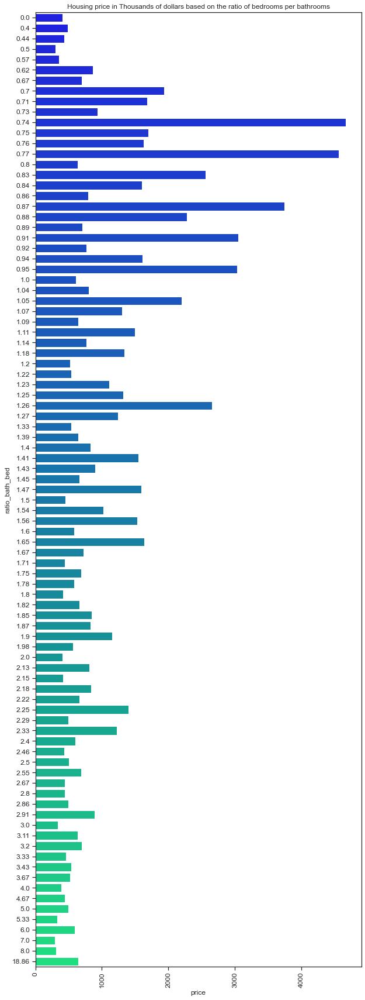

In [242]:
plt.figure(figsize=(10,30))
sns.barplot(data=df2, x=df2['price']/1000, y=df2['ratio_bath_bed'], palette= 'winter',orient='h',ci=None)
plt.title ("Housing price in Thousands of dollars based on the ratio of bedrooms per bathrooms")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

In [243]:
df2.groupby('ratio_bath_bed')['price'].mean().sort_values(ascending=False).head(10)

ratio_bath_bed
0.74   4670000.00
0.77   4565000.00
0.87   3745000.00
0.91   3051250.00
0.95   3035000.00
1.26   2653333.33
0.83   2560000.00
0.88   2280000.00
1.05   2196363.64
0.70   1940000.00
Name: price, dtype: float64

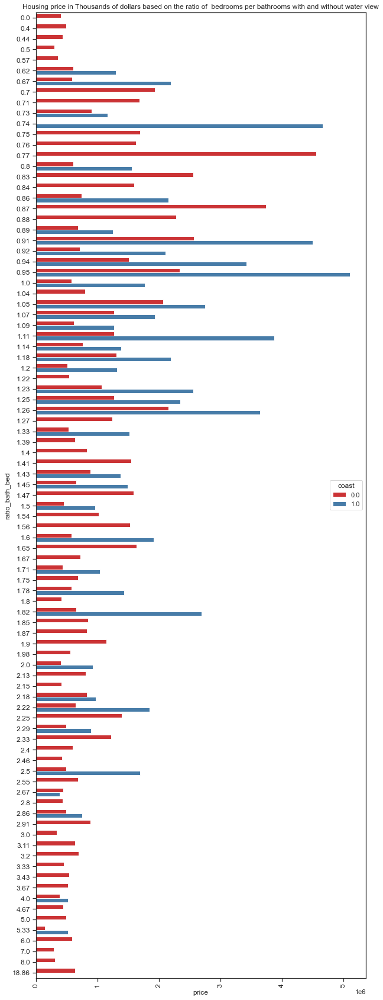

In [244]:
plt.figure(figsize=(10,30))
sns.barplot(data=df2, x=df2['price'], y=df2['ratio_bath_bed'], palette= 'Set1', hue='coast',orient='h',ci=None)
plt.title ("Housing price in Thousands of dollars based on the ratio of  bedrooms per bathrooms with and without water view")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

In [245]:
#Subset to check the price and ration differencen in houses with and without water view
S1=df2[df2['coast']==1]
S1.groupby('ratio_bath_bed')['price'].mean().sort_values(ascending=False).head(10)

ratio_bath_bed
0.95   5110000.00
0.74   4670000.00
0.91   4500000.00
1.11   3876666.67
1.26   3650000.00
0.94   3425000.00
1.05   2750000.00
1.82   2700000.00
1.23   2562857.14
1.25   2350000.00
Name: price, dtype: float64

In [246]:
#Subset to check the price and ration differencen in houses with and without water view
S2=df2[df2['coast']==0]# no water view
S2.groupby('ratio_bath_bed')['price'].mean().sort_values(ascending=False).head(10)

ratio_bath_bed
0.77   4565000.00
0.87   3745000.00
0.91   2568333.33
0.83   2560000.00
0.95   2343333.33
0.88   2280000.00
1.26   2155000.00
1.05   2073333.33
0.70   1940000.00
0.75   1698583.33
Name: price, dtype: float64

**Observations:**
- Lower values are telling us that there are more bathrooms than bedrooms in the house, maybe because each room has its own bathroom and then there are additional bathrooms shared for common living space.
- We can see how the prices this ratio does not show a pattern.
- In places with water view, the ratio 0.95 shows higher market prices. That would be a bath per bedroom, and they do not have to be all bathroom attached to the bedrooms because generally, houses have bathrooms in common areas.
- For houses with no water view, the value 0.77 is the one showing higher prices. This is telling us that a greater number of bathrooms per bedrooms is preferred in these areas.
- If we analyze the data as a whole, the average house value for the ratio_bath_bed is 0.74, what it means a bathroom per bedroom and maybe one common bathroom is the better valued by clients.


### 4.2 price vs ratio_sight_condition and zip area

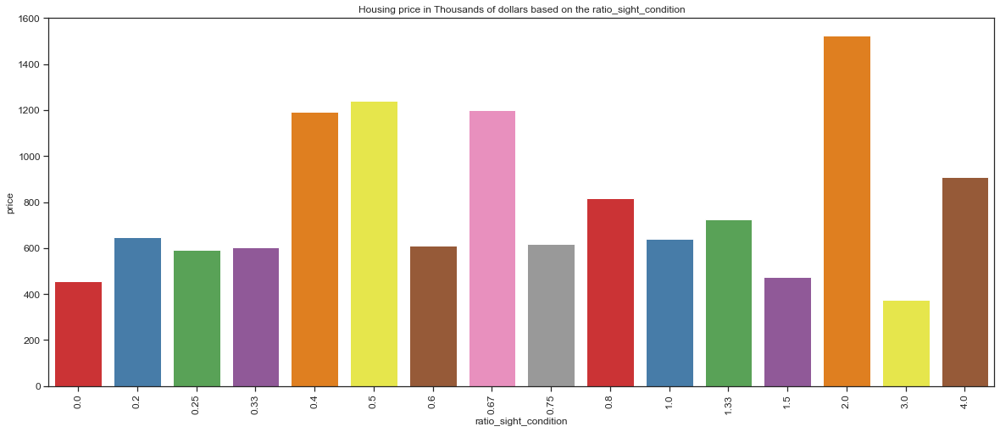

In [247]:
plt.figure(figsize=(20,8))
sns.barplot(data=df2, y=df2['price']/1000, x=df2['ratio_sight_condition'],palette= 'Set1',orient='v',ci=None)
plt.title ("Housing price in Thousands of dollars based on the ratio_sight_condition")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

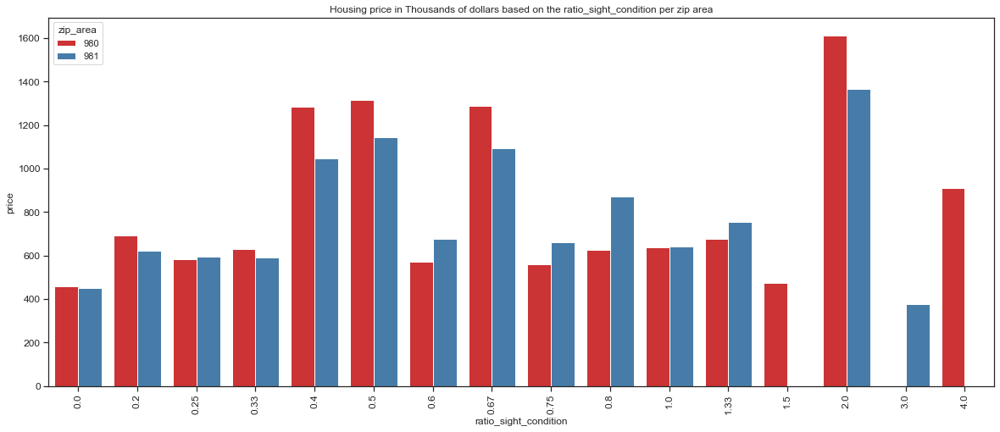

In [248]:
plt.figure(figsize=(20,8))
sns.barplot(data=df2, y=df2['price']/1000, x=df2['ratio_sight_condition'], hue=df2['zip_area'],palette= 'Set1',orient='v',ci=None)
plt.title ("Housing price in Thousands of dollars based on the ratio_sight_condition per zip area")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

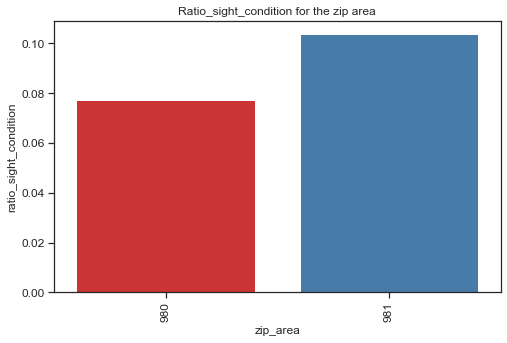

In [249]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['ratio_sight_condition'], palette= 'Set1',orient='v',ci=None)
plt.title ("Ratio_sight_condition for the zip area")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations**

- This ratio compares the times a house was seen and the house condition. lower values are due to good condition and low number of visits or higher number of visits and low condition rate.
- Since the maximum number of times a house was seen is 4, we can expect low values for better condition, in general terms.
- We cannot find a direct relationship between the ratio_sight_condition and zip_area, but the higher house prices are found for ratio 2, 0.5 and 0.4.
- The ratio_sight_condition is better for the area code 981.
- The ratios with higher prices is the same 2, for both zip area codes, and the variable behaves similarly.
- ratio 0 refers to houses with that have not been seen in person.


### 4.3 zip area vs price , quality rate and house condition, living area and square footage.

In [250]:
# checking prices per area code
df2.groupby('zip_area')['price'].mean().sort_values(ascending=False)

zip_area
980   543814.33
981   535069.52
Name: price, dtype: float64

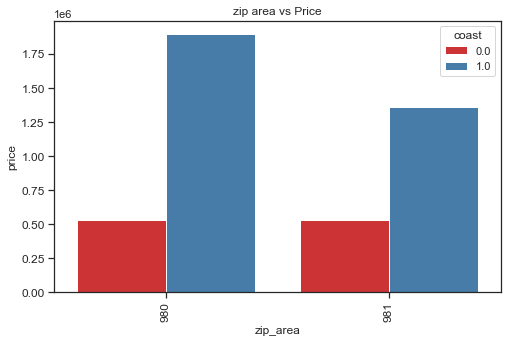

In [251]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['price'], hue=df2['coast'],palette= 'Set1',orient='v',ci=0.95)
plt.title ("zip area vs Price")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

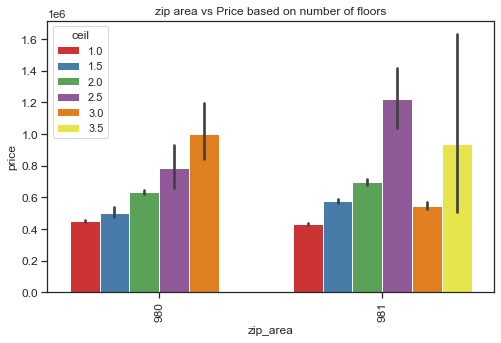

In [252]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['price'], hue=df2['ceil'],palette= 'Set1',orient='v')
plt.title ("zip area vs Price based on number of floors")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

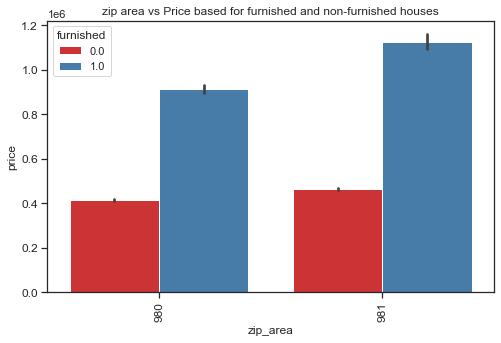

In [253]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['price'], hue=df2['furnished'],palette= 'Set1',orient='v')
plt.title ("zip area vs Price based for furnished and non-furnished houses")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**

- when checking prices per zip area, we can see that the prices for houses without water view are very similar, but a bit higher for 981 area. On the other hand, for the zip-area code 980 the prices are much higher for water front houses.
- The average price of a house in the 890 zip- area is very similar to the one on 981, the average price is 10,000 dollars less for 981.
- The average price is similar for houses with 1,1.5 and 2 levels. On the other hand, the prices go up abruptly for 2.5 floors houses in 981 area, but not so much in the 980 area, and the opposite behavior can be found for houses with 3 floors.
- We can only find 3.5 level-houses in 980 area.
- The house prices for furnished houses area very similar in both areas for houses without water view. For houses with water view the price is higher in 981.
- In average, the houses prices for 981 are higher than for 980, because there are not many water view houses.


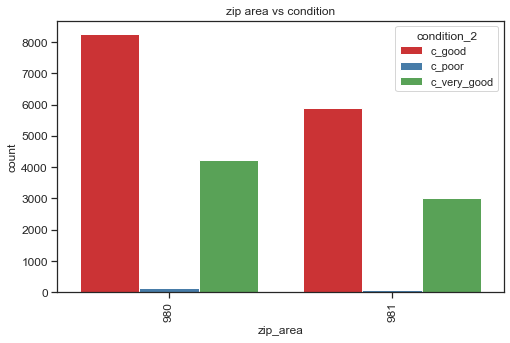

In [254]:
plt.figure(figsize=(8,5))
sns.countplot(data=df2, x=df2['zip_area'],hue=df2['condition_2'], palette= 'Set1')
plt.title ("zip area vs condition")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

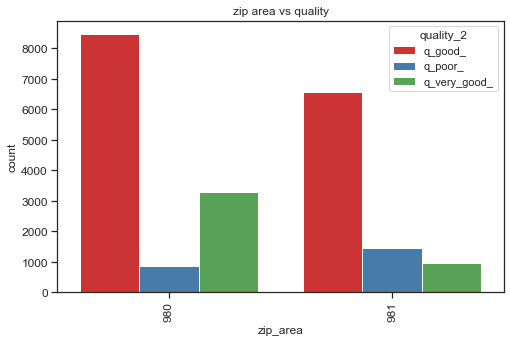

In [255]:
plt.figure(figsize=(8,5))
sns.countplot(data=df2, x=df2['zip_area'],hue=df2['quality_2'], palette= 'Set1')
plt.title ("zip area vs quality")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- The area 981 has more houses which quality is rated as bad.
- The area 980 has more houses rated as good above all many more houses which quality is rate very good.
- The house condition is rated higher for 980 in average, with more houses rated good and very good than for 981 area.


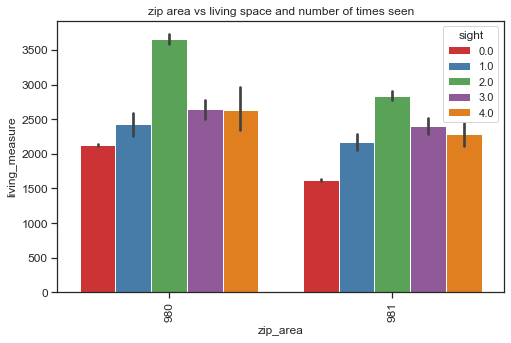

In [256]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['living_measure'], hue=df2['sight'],palette= 'Set1',orient='v')
plt.title ("zip area vs living space and number of times seen")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

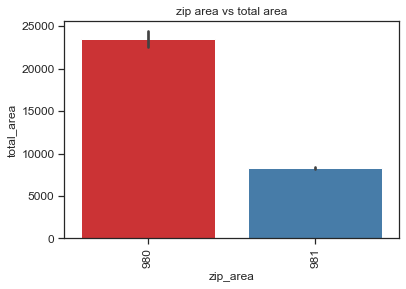

In [257]:
sns.barplot(data=df2, y=df2['total_area'], x=df2['zip_area'],palette= 'Set1')
plt.title ("zip area vs total area")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

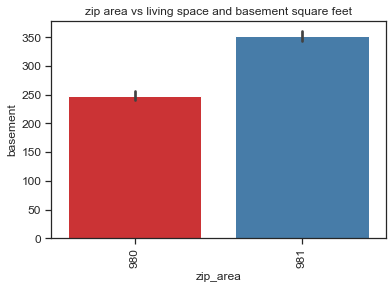

In [258]:
sns.barplot(data=df2, y=df2['basement'], x=df2['zip_area'],palette= 'Set1')
plt.title ("zip area vs living space and basement square feet")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

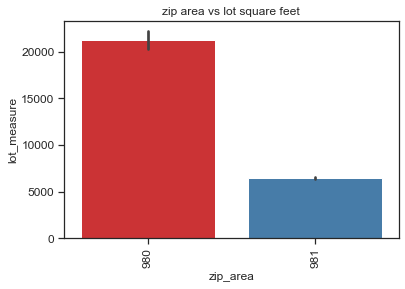

In [259]:
sns.barplot(data=df2, y=df2['lot_measure'], x=df2['zip_area'],palette= 'Set1')
plt.title ("zip area vs lot square feet")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- Houses in area 980 have much bigger lot square footage in average, but houses in area 981 have bigger living space, bigger basements and more levels.

### 4.4 Quality_condition vs price, year  built, living_measure2015.

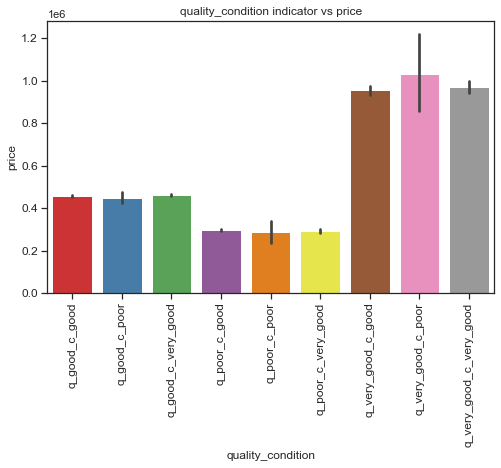

In [260]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, y=df2['price'], x=df2['quality_condition'],palette= 'Set1')
plt.title ("quality_condition indicator vs price")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()



**Observations:**

- It is very interesting that the indicator seems to be more affected by the quality than the condition of the house, even though initially it seems that condition of the house was more important.
- Good quality is associated to higher prices, which makes sense.


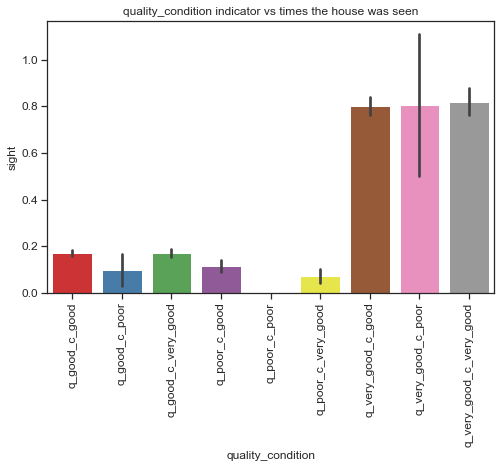

In [261]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, y=df2['sight'], x=df2['quality_condition'],palette= 'Set1')
plt.title ("quality_condition indicator vs times the house was seen")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Obsevations:**

- This variable is telling us that houses with quality rate are been seen more often independently of the condition, maybe because they stay longer in the market.
- poor quality and poor condition do not receive any visits.
- When quality is good and condition is good, houses receive a moderate number of visits; maybe because they sell quickly.


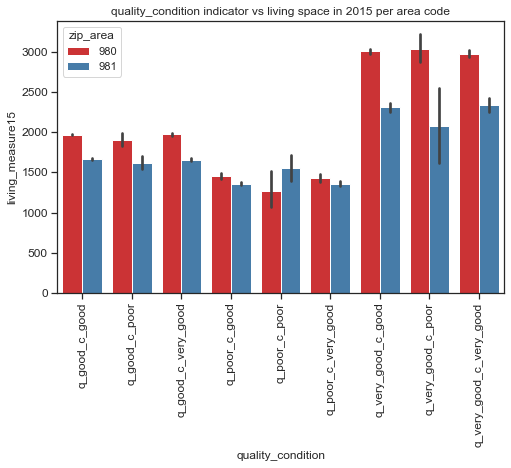

In [262]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, y=df2['living_measure15'], x=df2['quality_condition'],hue=df2['zip_area'], palette= 'Set1')
plt.title ("quality_condition indicator vs living space in 2015 per area code")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- Houses in the market with very good quality tend to have in average much bigger living space footage.
- The houses with very good quality, independently of their condition rate, where bigger for 980 zip area.
- Houses with poor quality tend to be smaller in the 980 area instead.

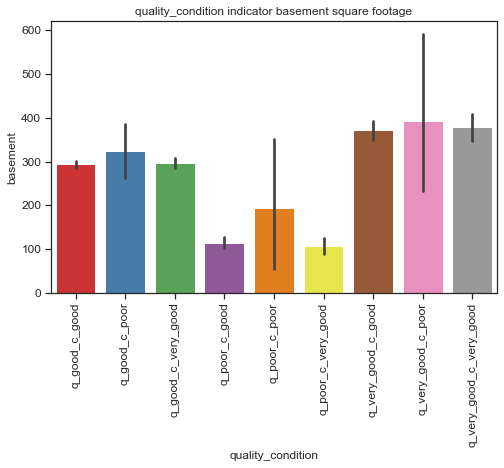

In [263]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, y=df2['basement'], x=df2['quality_condition'],palette= 'Set1')
plt.title ("quality_condition indicator basement square footage")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
    
- The better the quality the bigger the basement square footage, independently of the house condition.

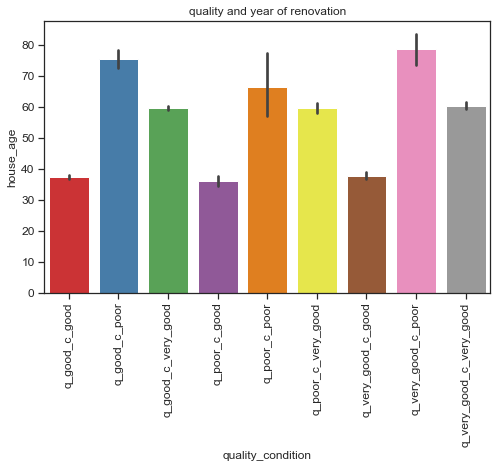

In [264]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, y=df2['house_age'], x=df2['quality_condition'],palette= 'Set1')
plt.title ("quality and year of renovation")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
    
- The houses with good quality and poor condition are the oldest.
- Also houses with the best quality and condition are about 60 years old in average.
- Newer houses are lower quality and very good condition.


### 4.5 Renovation age and house age versus price, zip area.

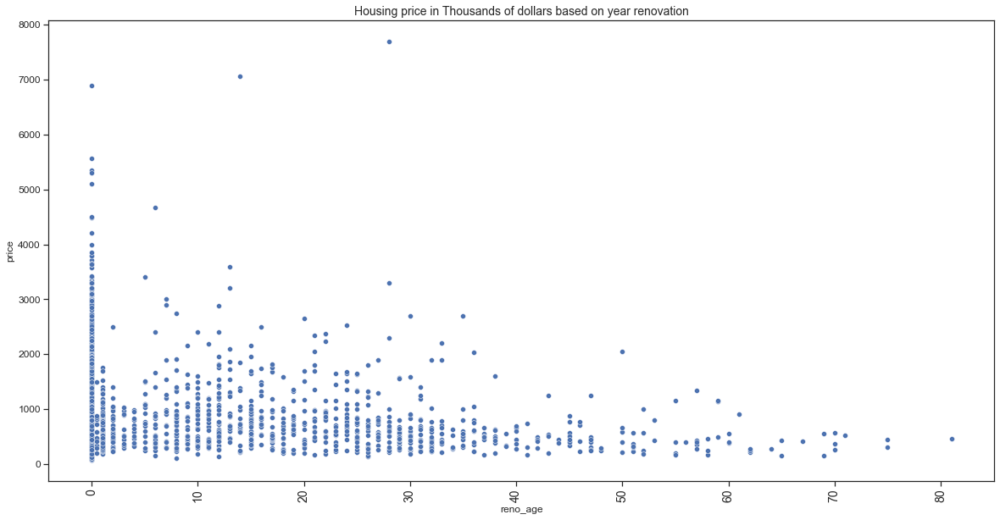

In [265]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df2,y=df2['price']/1000, x=df2['reno_age'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on year renovation", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

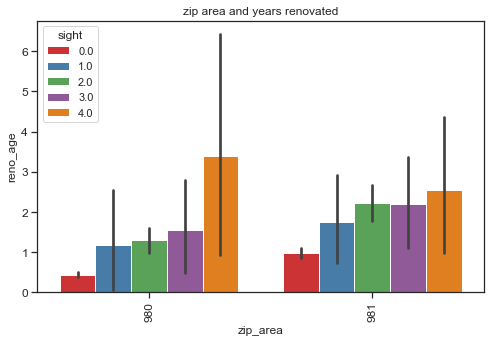

In [266]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['reno_age'],hue=df2['sight'], palette='Set1',orient='v')
plt.title ("zip area and years renovated")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- The longer since the house was renovated the lower the price. It may be an indication of the house condition as well.
- Older houses were seen more times because they probably stayed longer in the market. This is more visible for the area 980.

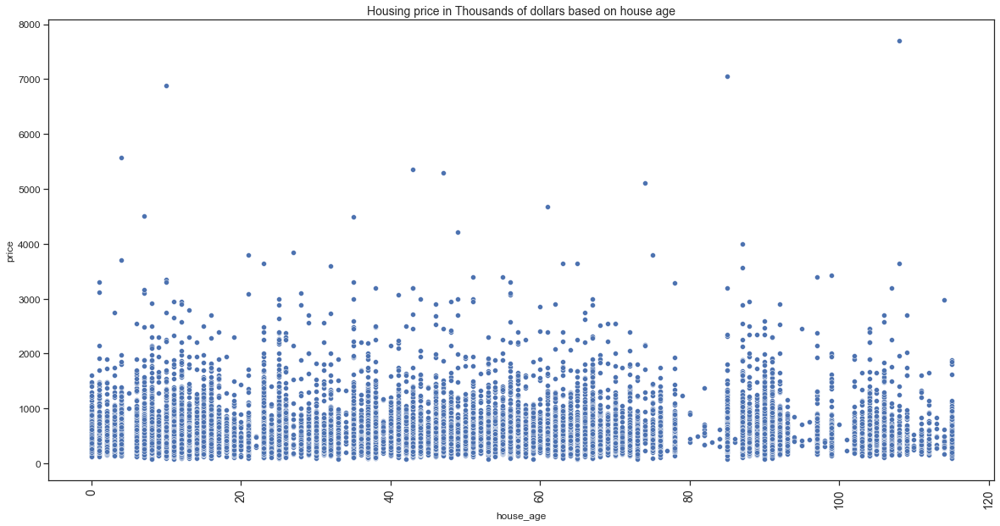

In [267]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=df2,y=df2['price']/1000, x=df2['house_age'], palette= 'winter')
plt.title ("Housing price in Thousands of dollars based on house age", fontsize=14)
plt.xticks(size=14, rotation=90)
plt.yticks(size=12)
plt.show()

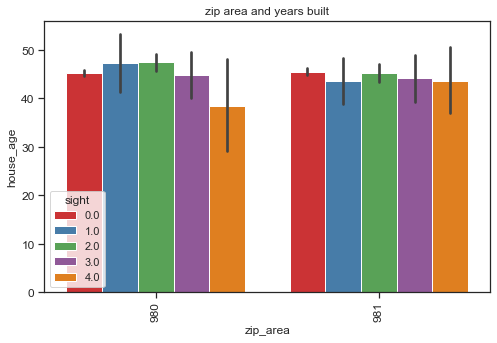

In [268]:
plt.figure(figsize=(8,5))
sns.barplot(data=df2, x=df2['zip_area'], y=df2['house_age'],hue=df2['sight'], palette='Set1',orient='v')
plt.title ("zip area and years built")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- We cannot see any pattern in the house age and price, which is the contrary of what we could expect since newer houses tend to be more expensive.
- Newer houses were seen more often on 980.

### 4.5 Temporal variables 'week_of_month' and 'season'

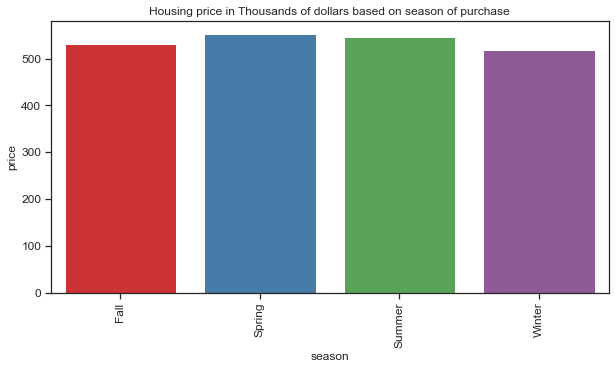

In [269]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2, y=df2['price']/1000, x=df2['season'],palette= 'Set1',orient='v',ci=None)
plt.title ("Housing price in Thousands of dollars based on season of purchase")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

In [270]:
df2.groupby('season')['price'].mean()

season
Fall     530932.81
Spring   552689.11
Summer   546884.97
Winter   519324.80
Name: price, dtype: float64

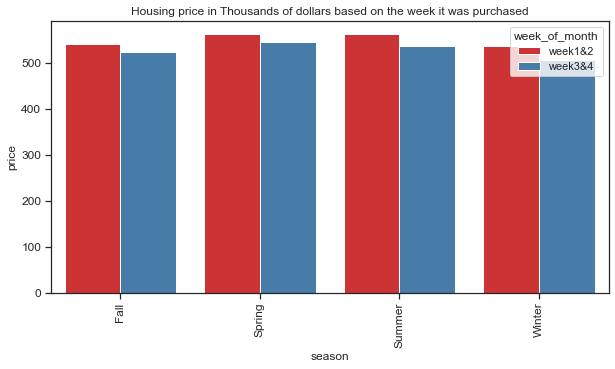

In [271]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2, y=df2['price']/1000, x=df2['season'], hue= df2['week_of_month'],palette= 'Set1',orient='v',ci=None)
plt.title ("Housing price in Thousands of dollars based on the week it was purchased")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

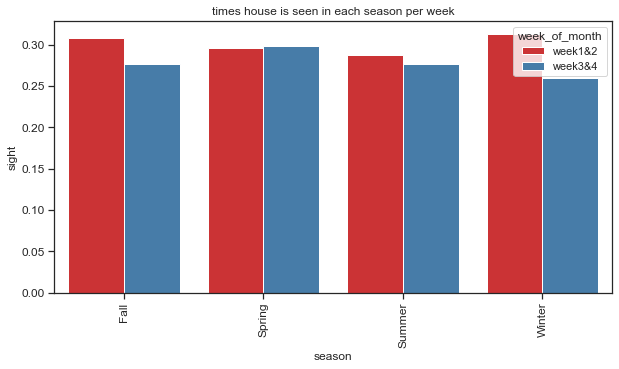

In [272]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2, x=df2['season'], y=df2['sight'],hue=df2['week_of_month'], palette= 'Set1',orient='v',ci=None)
plt.title ("times house is seen in each season per week")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

In [273]:
df2.groupby('season')['sight'].mean()

season
Fall     0.29
Spring   0.30
Summer   0.28
Winter   0.28
Name: sight, dtype: float64

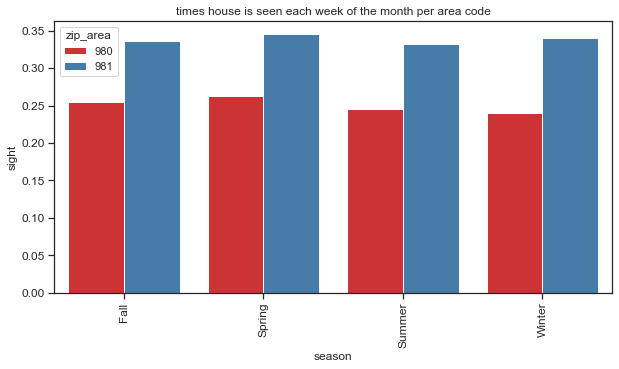

In [274]:
plt.figure(figsize=(10,5))
sns.barplot(data=df2, x=df2['season'], y=df2['sight'],hue=df2['zip_area'], palette= 'Set1',orient='v',ci=None)
plt.title ("times house is seen each week of the month per area code")
plt.xticks(size=12)
plt.yticks(size=12)
plt.xticks(rotation=90)
plt.show()

**Observations:**
- Price houses are higher in spring and summer.
- Winter is the best month to get a house for lower price.
- Houses are mostly purchased at the beginning of the month, during the first two weeks.
- The houses received more visits during the first weeks of the month, except for Spring time, when houses are seen slightly a few more times at the end of the month.
- Area 981 receives more visits during the whole year.


### 4.6 log transformed variables pairplot and heatmap

In [275]:
df2.select_dtypes(np.number).columns

Index(['cid', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'total_area', 'ratio_bath_bed',
       'ratio_sight_condition', 'house_age', 'reno_age', 'price_log',
       'living_measure_log', 'lot_measure_log', 'ceil_measure_log',
       'basement_log', 'living_measure15_log', 'lot_measure15_log',
       'total_area_log', 'basement_scaled'],
      dtype='object')

In [276]:
list_paired_new=['ratio_bath_bed',
       'ratio_sight_condition', 'house_age', 'reno_age', 'price_log',
       'living_measure_log', 'lot_measure_log', 'ceil_measure_log',
       'basement_log', 'living_measure15_log', 'lot_measure15_log',
       'total_area_log','basement_scaled','sight']

<Figure size 10800x10800 with 0 Axes>

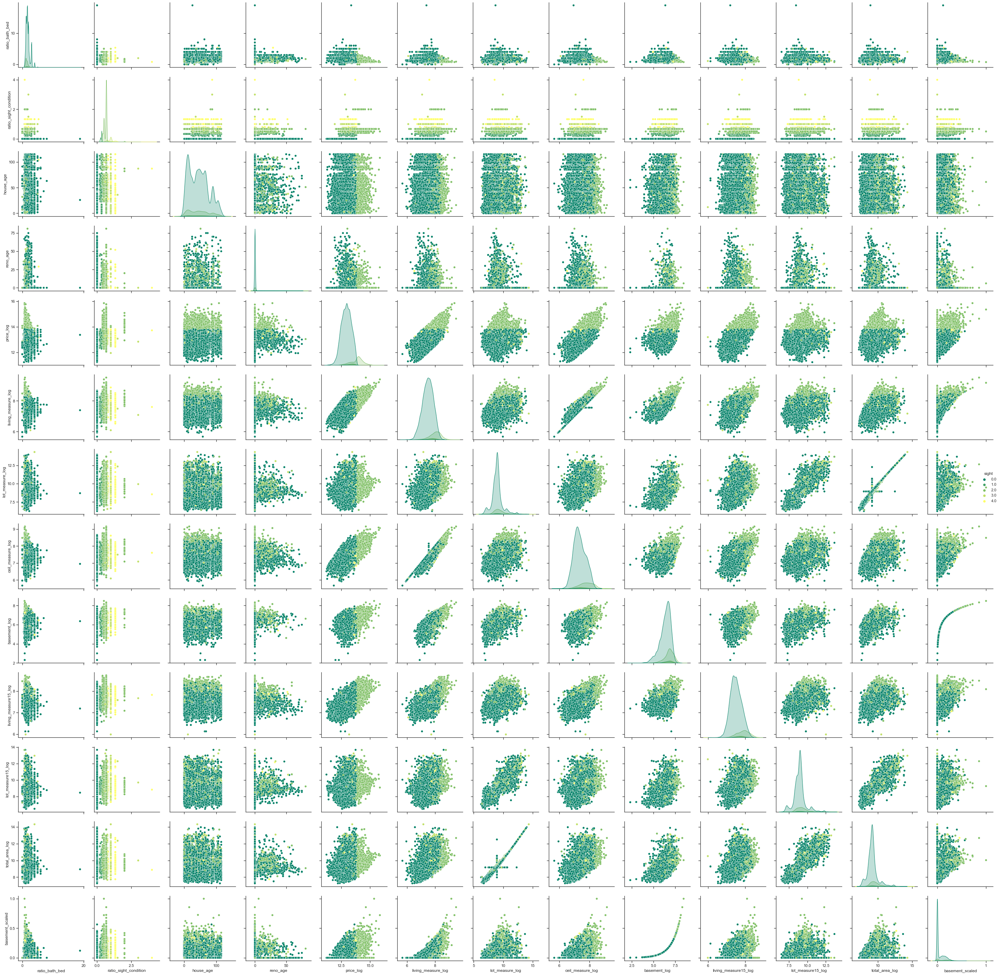

In [277]:
plt.figure(figsize=(150, 150))  # set size
sns.pairplot(data=df2[list_paired_new],diag_kind='kde', height=3, palette="summer", hue='sight'
)  # pairplot with density distribution in the diagonal.
plt.tight_layout(pad=1.5)
sns.set(font_scale=2.1)
plt.show()

**Observations:**

- We can see a positive patern between some variables like ratio_bath_bed and total_area_log.
- Also lot_measure15_log shows a positive pattern with lot_measure_log and total_measure_log.This behavior was present in the original data.
- total_measure_log and lot_measure_log show a very clear linear relationship.
- we cannot spot any clear negative relationship but the heatmap will help us verify our observations.



<AxesSubplot:>

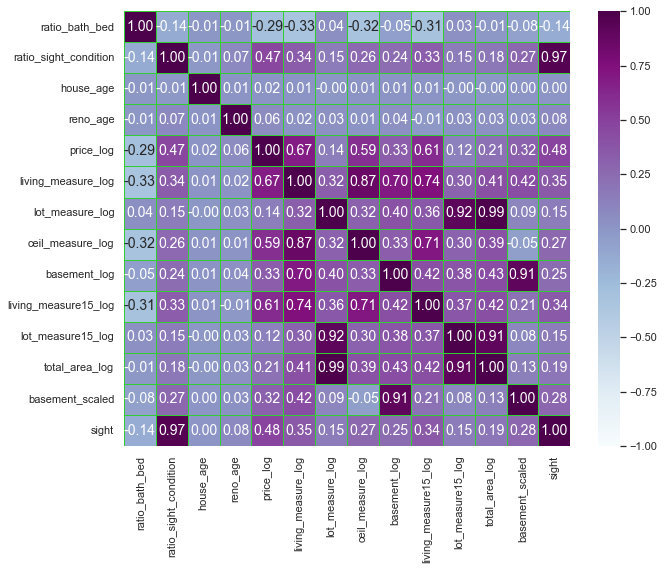

In [278]:
"""we will plot a heatmap with a min value of -1 and max value of 1 to simulate the 
coefficient of correlation."""
plt.figure(figsize=(10, 8))  # setting the size of the plot
sns.set(font_scale=1)
sns.heatmap(
    df2[list_paired_new].corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cmap='BuPu',
    linewidths=1,
    linecolor="limegreen", annot_kws={"size": 14}
)  # creating heatmap with annotations


**Observations:**
    
We have many variables are highly positive correlated, for example:
- Variable ratio_sight_condition is highly correlated with variable sight.
- Variable total_area_log is highly correlated with lot_measure15_log and lot_measure_log.
- Variable living_measure_log is highly correlated with ceil_mesure_log.
- Variable living_measure15_log is also positive and highly correlated with living_measure_log
- house age and reno age are independent.
- There are only a few variables with slightly negative correlation like ratio_bath_bed and living_measure_log


#### Time variables heatmap.

In [279]:
df2.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'date_month', 'date_year', 'date_day', 'ratio_bath_bed',
       'ratio_sight_condition', 'zip_area', 'quality_2', 'condition_2',
       'quality_condition', 'week_of_month', 'season', 'house_age', 'reno_age',
       'price_log', 'living_measure_log', 'lot_measure_log',
       'ceil_measure_log', 'basement_log', 'living_measure15_log',
       'lot_measure15_log', 'total_area_log', 'basement_scaled'],
      dtype='object')

In [280]:
list_time_heatmap=['yr_built', 'yr_renovated','house_age', 'reno_age']

<AxesSubplot:>

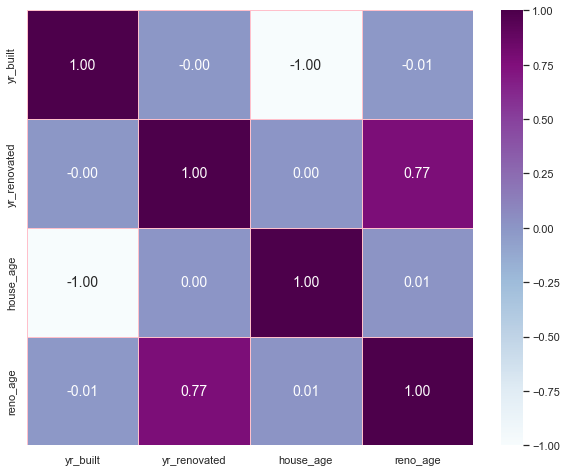

In [281]:
"""we will plot a heatmap with a min value of -1 and max value of 1 to simulate the 
coefficient of correlation."""
plt.figure(figsize=(10, 8))  # setting the size of the plot
sns.set(font_scale=1)
sns.heatmap(
    df2[list_time_heatmap].corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cmap='BuPu',
    linewidths=1,
    linecolor="pink", annot_kws={"size": 14}
)  # creating heatmap with annotations


**Observations:**
- We can find high correlation among yr_renovated and  reno_age variable.
- Variable yr_built and house age are negativelly correlated and the correlation is the maximum, so they both could not be part of a model.


# PART III: BUILDING A BASIC DECISION TREE MODEL

**Choosing a regression model**
- We are not going to use the linear regression algorithm because the presents of outliers will affect the model negatively.
- Our model will be based in a tree based model and will will perform ensemble techniques and hyperparameter tunning to improve performance.
- Tree based model as Random forest or XG boost are robust againts outliers so they are a better option in our case.

In [282]:
# Making a copy of data set
df3=df2.copy()

In [283]:
#checking data and data types
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 45 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   cid                    21613 non-null  float64 
 1   dayhours               21613 non-null  category
 2   price                  21613 non-null  float64 
 3   room_bed               21613 non-null  float64 
 4   room_bath              21613 non-null  float64 
 5   living_measure         21613 non-null  float64 
 6   lot_measure            21613 non-null  float64 
 7   ceil                   21613 non-null  category
 8   coast                  21613 non-null  category
 9   sight                  21613 non-null  float64 
 10  condition              21613 non-null  float64 
 11  quality                21613 non-null  float64 
 12  ceil_measure           21613 non-null  float64 
 13  basement               21613 non-null  float64 
 14  yr_built               21613 non-null 

## 1. DIVIDE DATA INTO TARGET AND PREDICTOR VARIABLES 

In [284]:
# Variables to include in the model predictor
x_list2=['room_bed', 'room_bath',  'ceil', 'coast', 'sight', 'condition', 'quality','lat', 'long', 'furnished','date_month', 'date_year', 'ratio_bath_bed',
        'zip_area','date_day', 'week_of_month', 'season', 'house_age', 'reno_age',
        'lot_measure_log', 'ceil_measure_log', 'basement_scaled', 'living_measure15_log', 'quality_condition','zipcode']
       


**Obsservations:**

- Decision tree models can be robust against outliers but they can be affected by correlation so we will have to drop variables that are highly correlated and/or perform regularization.

- We are building a  decision tree based model and even though trees are not sensitive to the scale of the predictors, transforming a large variable like price or lot_measure values might improve predictions because it will minimize square error that is influenced by large scales.

- We droped variables that did not provide any information to the model like Cid or dayhours, which was not relevant after extracting variables 'date_year', 'date_month' and 'date_of_week'.

- We created new variables by using bin methods such as grouping months in seasons and days in weeks ot the month.

- Variable zip_area was added to the data along with zipcode. 

- Variables yr_built and yr_renovated have been dropped from the data since we created house_age and reno_age that provide better interpretation of the data.

- Variable ratio_bath_bed was created by dividing number of bedrooms among number of bathrooms. This variable does not have any correlation with the original ones, so it was included in the model.

- Variable 'quality_condition' is a combination of both variables 'quality' and 'condition' after grouping both variables in bins.

- Variable sight_condition was highly correlated to sight and after analysis, we did not find this variable very conclusive, so sight is a better choice.

- Due to the great number of outliers for most of the variables, and the skeweness of the data, we performed a log transformation for most of the continuous predictor and the target. The transformation was not suitable for variable basement so we scaled the variable using MinMaxscaler to create a new variable basement_scaled.

- The nature of the variables ‘lat’ and ‘long’ did not allow us to transform them because they would lose the meaning after any type of data processing for these two variables.


- After reviewing thoroughly, the data we came to the conclusion that some features were not giving any additional information and did not need to be in the modeling step:

    - We dropped living_measure_log from the data because this variable is the addition of other two variables: ceil_mesure and basement, having the information separated in two variables it seems better to complete a model building.
    
    - Variable total_area is the addition of other two variables: living_measure and lot_measure so we removed it from de model. Since any of the mentioned original variables was relevant, their log transformed did not need to be included either.
    
    - We removed lot_measure15_log as well since it was highly correlated with lot_measure_log.
    
- The rest of the categorical variables such as level of the house 'ceil', 'furnished’, ‘sight', coast, seem to be very relevant to the model according to the initial data exploratory analysis.





In [285]:
# predictors
x= df3[x_list2]

# target variable  
y= df3['price_log']

In [286]:
#getting dummy variables
x=pd.get_dummies(data=x,columns=x.select_dtypes('category').columns.tolist(),drop_first=True)

In [287]:
x.head()

,room_bed,room_bath,sight,condition,quality,lat,long,ratio_bath_bed,house_age,reno_age,lot_measure_log,ceil_measure_log,basement_scaled,living_measure15_log,ceil_1.5,ceil_2.0,ceil_2.5,ceil_3.0,ceil_3.5,coast_1.0,furnished_1.0,date_month_2,date_month_3,date_month_4,date_month_5,date_month_6,date_month_7,date_month_8,date_month_9,date_month_10,date_month_11,date_month_12,date_year_2015,zip_area_981,date_day_2,date_day_3,date_day_4,date_day_5,date_day_6,date_day_7,date_day_8,date_day_9,date_day_10,date_day_11,date_day_12,date_day_13,date_day_14,date_day_15,date_day_16,date_day_17,date_day_18,date_day_19,date_day_20,date_day_21,date_day_22,date_day_23,date_day_24,date_day_25,date_day_26,date_day_27,date_day_28,date_day_29,date_day_30,date_day_31,week_of_month_week3&4,season_Spring,season_Summer,season_Winter,quality_condition_q_good_c_poor,quality_condition_q_good_c_very_good,quality_condition_q_poor_c_good,quality_condition_q_poor_c_poor,quality_condition_q_poor_c_very_good,quality_condition_q_very_good_c_good,quality_condition_q_very_good_c_poor,quality_condition_q_very_good_c_very_good,zipcode_98002.0,zipcode_98003.0,zipcode_98004.0,zipcode_98005.0,zipcode_98006.0,zipcode_98007.0,zipcode_98008.0,zipcode_98010.0,zipcode_98011.0,zipcode_98014.0,zipcode_98019.0,zipcode_98022.0,zipcode_98023.0,zipcode_98024.0,zipcode_98027.0,zipcode_98028.0,zipcode_98029.0,zipcode_98030.0,zipcode_98031.0,zipcode_98032.0,zipcode_98033.0,zipcode_98034.0,zipcode_98038.0,zipcode_98039.0,zipcode_98040.0,zipcode_98042.0,zipcode_98045.0,zipcode_98052.0,zipcode_98053.0,zipcode_98055.0,zipcode_98056.0,zipcode_98058.0,zipcode_98059.0,zipcode_98065.0,zipcode_98070.0,zipcode_98072.0,zipcode_98074.0,zipcode_98075.0,zipcode_98077.0,zipcode_98092.0,zipcode_98102.0,zipcode_98103.0,zipcode_98105.0,zipcode_98106.0,zipcode_98107.0,zipcode_98108.0,zipcode_98109.0,zipcode_98112.0,zipcode_98115.0,zipcode_98116.0,zipcode_98117.0,zipcode_98118.0,zipcode_98119.0,zipcode_98122.0,zipcode_98125.0,zipcode_98126.0,zipcode_98133.0,zipcode_98136.0,zipcode_98144.0,zipcode_98146.0,zipcode_98148.0,zipcode_98155.0,zipcode_98166.0,zipcode_98168.0,zipcode_98177.0,zipcode_98178.0,zipcode_98188.0,zipcode_98198.0,zipcode_98199.0
0,4.00,1.75,0.00,4.00,8.00,47.72,-122.18,2.29,39,0.00,9.15,7.50,0.26,7.61,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2.00,1.00,0.00,3.00,6.00,47.55,-122.27,2.00,67,0.00,8.04,6.51,0.00,7.41,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,4.00,2.75,4.00,3.00,8.00,47.52,-122.26,1.45,67,0.00,7.79,8.02,0.00,7.87,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,3.00,2.50,0.00,3.00,8.00,47.34,-122.21,1.20,38,0.00,8.22,7.46,0.00,7.62,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.00,1.00,0.00,3.00,7.00,47.57,-122.28,2.00,38,0.00,8.43,7.02,0.00,7.02,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [288]:
x.columns.nunique()

145

**Observations:**

- after obtaining dummy variables the x data frame contains 145 columns.

In [289]:
#Split data in 70:30 ratio, 70% train data and 30% test data to built the model.
x_train,x_test, y_train, y_test=train_test_split(x,y,test_size=0.3, random_state=1)

In [290]:
# checking x_train and x_test size
x_train.shape, x_test.shape

((15129, 145), (6484, 145))

In [291]:
# checking y_train and y_test size
y_train.shape, y_test.shape

((15129,), (6484,))

**Observations:**
- The x_train set has 15129 rows and 145 variables.
- The x_test set contains 6484 rows and 145 variables.
- Variable y_train contains 15129 rows and y_test contain 6484 rows.

## 2 . BUILDING A SIMPLE TREE-BASED MODEL

In [292]:
#Building a tree model
dtree=DecisionTreeRegressor(random_state=1)
dtree.fit(x_train,y_train)

DecisionTreeRegressor(random_state=1)

**MODEL PERFORMACE FUNCTION**

In [293]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

**MODEL PERFORMANCE**

In [294]:
# calculating train performance
Per_train=model_performance_regression(dtree, x_train, y_train)
Per_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.00,0.00,1.00,1.00,0.00


**Observations:**
- This model has not error and the model R2 score and R2 adjusted are 1.
- Model is performing excellent on train set but it is clearly because of overfitting.

In [295]:
# calculating test performance
per_test=model_performance_regression(dtree, x_test, y_test)
per_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.25,0.18,0.77,0.77,1.38


**Observations:**
- On test set, model is not performing so well even though R2 score and R2-adjusted are good, the test set performance shows errors and the R2 and R2-adjusted fall very far from the results on train set.

**Observations:**
- The model is clearly overfitted, maybe because of the great number of variables included.
- We are going to try some ensemble technique that are robust to outliers and can help with overfitting such as random forest or gradient boosting or XGboost.
- Regularization can be also included by using some parameters and hyperparameters of the tree regressor.



## 3. PLOTTING MODEL FEATURES 

In [296]:
# importance of features in the tree building

print(pd.DataFrame(dtree.feature_importances_, columns = ["Imp"], index = x_train.columns).sort_values(by = 'Imp', ascending = False))

                                           Imp
quality                                   0.35
lat                                       0.28
sight                                     0.09
ceil_measure_log                          0.07
living_measure15_log                      0.05
long                                      0.04
basement_scaled                           0.02
lot_measure_log                           0.02
room_bath                                 0.02
house_age                                 0.01
ratio_bath_bed                            0.00
coast_1.0                                 0.00
room_bed                                  0.00
zipcode_98144.0                           0.00
season_Spring                             0.00
zipcode_98040.0                           0.00
condition                                 0.00
date_year_2015                            0.00
reno_age                                  0.00
season_Winter                             0.00
week_of_month

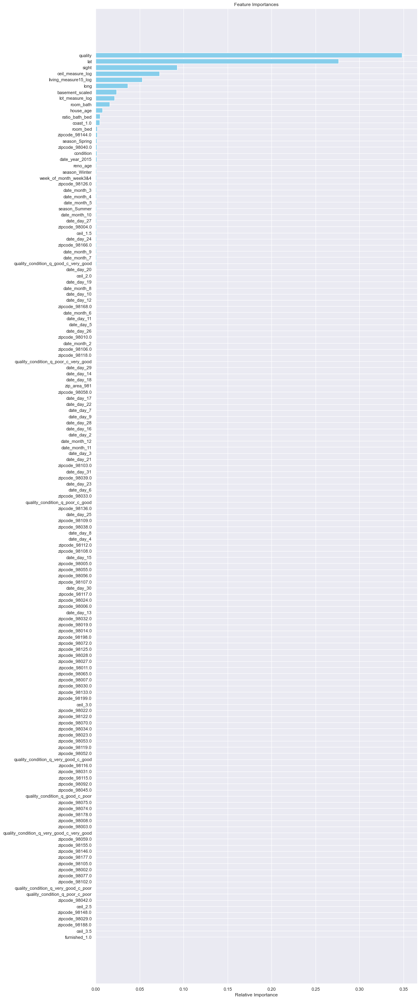

In [297]:
feature_names = x_train.columns
importances = dtree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(15,35))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='skyblue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.tight_layout(pad=2)
plt.show()

**Observations:**

- According to the first analysis, the three more important features that affect the house price are variable 'quality'(35 per cent of the weight of all features), variable 'lat' (28 per cent) which is a clear reference to location and sight (9 per cent), as higher price was associated to greater number of visits to the house by potential clients. In four place we can find ceil_measure (7 percent), associated to living space without basement and in fifth position the living_measure15 what is referring to the living square footage of the house with basement included.

**Conclusion**

- Model dtree is our initial model, the most basic one. We are going to use ensemble techniques to improve performance along with hyper parameter tuning and pruning.
- This model is susceptible of improvement by using ensemble techniques as Random Forest, XG boost and Gradient Boosting, all of them very robust against outliers.
- hyperparameter tuning will be used to minimize the effect of the number of variables that is overfitting the model. By using parameters as maximum number of features (max_feature parameter) or tree_depth parameter to help pruning the tree.
- we will create different models and select the one that show better performance in train and test data and best prediction power.
- Bescause fo the great number of outliers a linear regression model was not suitable for this case so the decision tree models will be the based of our study.


# PART IV: IMPROVING OUR BASIC DECISION TREE MODEL.

## 1. HYPER TUNING DTREE MODEL

- Based on the previous dtree model, we are going to used hyper pameters to improve the model.

In [298]:
#funtion to calculate overfitting

def  overfit(model, predictor_train,target_train, predictor_test,target_test):
    pred_train = model.predict(predictor_train)
    r2_train = r2_score(target_train, pred_train) 
    rmse_train = np.sqrt(mean_squared_error(target_train, pred_train))    
    pred_test = model.predict(predictor_test)
    r2_test = r2_score(target_test, pred_test) 
    rmse_test = np.sqrt(mean_squared_error(target_test, pred_test))
    dif_r2= (r2_train-r2_test)*100
    dif_rmse=(rmse_train-rmse_test)*100
    # creating a dataframe of metrics
    df_overfit = pd.DataFrame({"dif_r2":dif_r2 ,"dif_rmse": dif_rmse}, index=[0])
    #return dataframe
    return df_overfit



In [299]:
overfit(dtree,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,22.61,-24.89


**Observations:**
- As we initially observed, dtree model is overfitted because it is performing very good on training set but on test set the results are not as good.
- In order to reduce overfitting, we are going to use hyperparameters to pre-prune the tree.


### a. Model dtree_tuned

In [300]:
%%time
#Building a tree model with hyper parameter tuning
# Choose the type of regressor. 
dtree_tuned = DecisionTreeRegressor(random_state=1)

# Grid of parameters to choose from
param = {'max_depth': list(np.arange(1,7)), 
              'min_samples_leaf': [1, 3, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10, 15] ,
              'min_impurity_decrease': [0.001, 0.01, 0.1, 0.0]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the search
obj = RandomizedSearchCV(estimator=DecisionTreeRegressor(random_state=1), n_iter=50, scoring=scorer, cv=5 ,random_state=1,param_distributions=param)
obj = obj.fit(x_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned =obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_tuned.fit(x_train, y_train)

Wall time: 23.9 s


DecisionTreeRegressor(max_depth=5, max_leaf_nodes=15, min_samples_leaf=3,
                      random_state=1)

**Observations:**
- We provide different hyperparameters, maximum of leaf nodes, minimum of impurity decrease for splitting the nodes, maximum of level for the tree and minimum of samples for each leaf. The total number of iterations set up is 50 and the number of k folders for cross validation is 5.
- The best tree for the possible parameters shows a maximum depth of 5 levels, minimum samples per leaf is 3 and maximum of final nodes is 15.


### a.1 Model dtree_tuned performance

In [301]:
#checking performance on train set
dtree_tuned_train=model_performance_regression(dtree_tuned, x_train, y_train)
dtree_tuned_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.27,0.20,0.74,0.74,1.57


In [302]:
#Checking perfomrance on test set
dtree_tuned_test=model_performance_regression(dtree_tuned, x_test, y_test)
dtree_tuned_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.28,0.21,0.72,0.71,1.62


In [303]:
# checking difference between train and test set
overfit(dtree_tuned,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,2.36,-0.93


**Observations**
- Model dtree_tuned is showing a fair R2 score but it is suitable of improvement.
- The train and test set perform similarly so this model is not overfitted, we solve overfitting with the pre-pruning parameters set up.
- MAPE mean absolute percentage error, is telling us the percentage of error in the model what is high, 1.62 per cent.

### b. Model dtree2_tuned

In [304]:
%%time
#Building a tree model with hyper parameter tuning
# Choose the type of classifier. 
dtree_tuned2 = DecisionTreeRegressor(random_state=1)

# Grid of parameters to choose from
param = {'max_depth': list(np.arange(3,15)),
              'min_samples_leaf': [ 10, 30,35],
              'min_impurity_decrease': [0,0.001, 0.01, 0.3],
               'max_features':[0.6, 0.3 ,0.8 ,0.9],
        'ccp_alpha':[0.2,0.01,0.5,0.001]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

# Run the search
obj = RandomizedSearchCV(estimator=DecisionTreeRegressor(random_state=1), n_iter=60, scoring=scorer, cv=30 ,random_state=1,param_distributions=param)
obj = obj.fit(x_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned2 =obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_tuned2.fit(x_train, y_train)

Wall time: 2min 45s


DecisionTreeRegressor(ccp_alpha=0.001, max_depth=5, max_features=0.9,
                      min_impurity_decrease=0.001, min_samples_leaf=30,
                      random_state=1)

**Observations:**

- The hyperparameter selected to perform a randomized search are maximum number of levels of the tree, minimum required samples for each node to split, the maximum number of features or columns, minimum of impurity decreased for splitting the node and minimal cost complexity(ccp_alpha) will help us to prune the tree, The sub-tree with the largest cost complexity that is smaller than ccp_alpha will be chosen. WE selected 60 total iterations and 30 k folds for cross validation.

- The parameters that provided the optimal tree are minimum impurity decrease 0.001, maximum number of levels is 5, maximum columns to include is 90 percent, minimum samples per leaf is 30.


### b.1 Model dtree2_tuned performance

In [305]:
#checking performance on train set
dtree_tuned2_train=model_performance_regression(dtree_tuned2, x_train, y_train)
dtree_tuned2_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.26,0.20,0.75,0.75,1.52


In [306]:
#Checking performance on test set
dtree_tuned2_test=model_performance_regression(dtree_tuned2, x_test, y_test)
dtree_tuned2_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.27,0.20,0.73,0.72,1.57


In [307]:
overfit(dtree_tuned2,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,2.65,-1.12


**Observations:**
- The tree has improved slightly when compared to dtree_tuned but still the performance is a bit better on the train set.
With r2 of 0.75 in the train set and 0.73 in test set, the result can be improved.
- The absolute mean error percentage is very similar for both data sets, 1.52 for train set and 1.57 for test set.

## 2. CREATING A MODEL WITH ENSEMBLE METHODS AND HYPER TUNING.

## 2.1. SELECTING BEST MODEL ACCORDING TO CROSS VALIDATION RESULTS

In [308]:
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.r2_score)

In [309]:
 models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Linear regression", LinearRegression()))
models.append(("Decision tree regression",DecisionTreeRegressor(random_state=1)))
models.append(("Bagging", BaggingRegressor(random_state=1)))
models.append(("GradientBoosting", GradientBoostingRegressor(random_state=1)))
models.append(("AdaBoost", AdaBoostRegressor(random_state=1)))
models.append(("RandomForest", RandomForestRegressor(random_state=1)))
models.append(("XGBoost", XGBRegressor(random_state=1)))



results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
    

print( "Cross-Validation  r2 performance:" )
print('--------------------------')
  
for name, model in models:
     
    kf = KFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(estimator=model, X=x_train, y=y_train, scoring=scorer, cv=kf)
    
    results.append(cv_result)
    names.append(name)
    print(f'model {name},cross validation result {np.round(np.mean(cv_result),4)}')
    

print(" "*20 )
print("r2 Performance on test set:" )
print('--------------------------')

for name, model in models:
    model.fit(x_train, y_train)
    scores_validation =r2_score(y_test, model.predict(x_test))
    print(f'model {name},test set result {np.mean(np.round(scores_validation,4))}')
    print('************************************************')
    

    
   

Cross-Validation  r2 performance:
--------------------------
model Linear regression,cross validation result 0.8835
model Decision tree regression,cross validation result 0.7735
model Bagging,cross validation result 0.8752
model GradientBoosting,cross validation result 0.8772
model AdaBoost,cross validation result 0.765
model RandomForest,cross validation result 0.8874
model XGBoost,cross validation result 0.8937
                    
r2 Performance on test set:
--------------------------
model Linear regression,test set result 0.8784
************************************************
model Decision tree regression,test set result 0.7739
************************************************
model Bagging,test set result 0.8748
************************************************
model GradientBoosting,test set result 0.8708
************************************************
model AdaBoost,test set result 0.7661
************************************************
model RandomForest,test set result 0.885

In [310]:
#Creating series from the results list to add to a dataframe with all cross validation results
results_linear_regr=pd.Series(results[0])
results_decision_tree=pd.Series(results[1])
results_Bagging=pd.Series(results[2])
results_Gradient_boost=pd.Series(results[3])
results_Ada=pd.Series(results[4])
results_Random_f=pd.Series(results[5])
results_XGB=pd.Series(results[6])

In [311]:
# creating a data frame with all cross validation results
df_cv=pd.concat([results_linear_regr,results_decision_tree,results_Bagging,results_Gradient_boost,results_Ada,results_Random_f,results_XGB], axis=1)

df_cv.columns= names

In [312]:
df_cv

,Linear regression,Decision tree regression,Bagging,GradientBoosting,AdaBoost,RandomForest,XGBoost
0,0.88,0.76,0.87,0.87,0.77,0.88,0.89
1,0.88,0.78,0.87,0.87,0.76,0.89,0.89
2,0.88,0.77,0.87,0.87,0.75,0.88,0.89
3,0.90,0.79,0.89,0.89,0.78,0.90,0.91
4,0.88,0.77,0.87,0.88,0.78,0.88,0.89


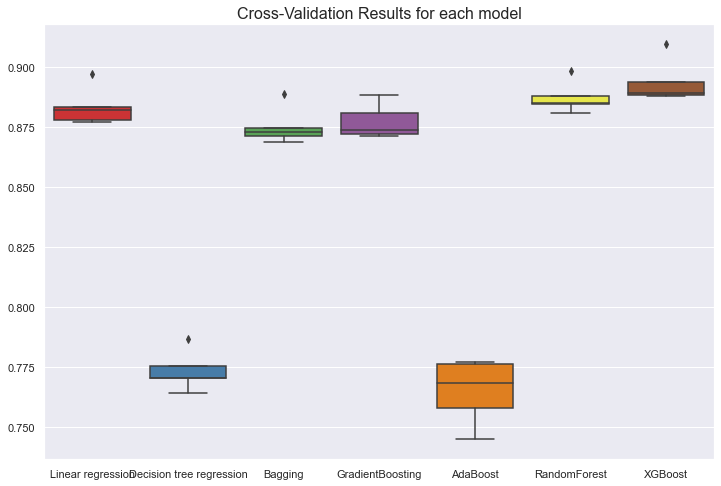

In [313]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df_cv, palette= 'Set1')
plt.title('Cross-Validation Results for each model', fontsize= 16)
plt.show()

**Observations:**
    
- As per the r2 performance by using cross validation, the model with better performance seems to be XGBoost, followed by random forest and surprisingly linear regression. 
- The worst results are for our Adaboost and our initial model, decision tree regression.

## 2.2 RANDOM FOREST-BASED MODELS

## a. Random forest: Model rf_estimator

In [314]:
rf_estimator=RandomForestRegressor(random_state=1)
rf_estimator.fit(x_train,y_train)

RandomForestRegressor(random_state=1)

**PERFORMACE**

In [315]:
#Checking performance on train set
rf_estimator_train=model_performance_regression(rf_estimator, x_train, y_train)
rf_estimator_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.07,0.05,0.98,0.98,0.36


In [316]:
#Checking performance on test set
rf_estimator_test=model_performance_regression(rf_estimator, x_test, y_test)
rf_estimator_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.13,0.89,0.88,0.97


In [317]:
overfit(rf_estimator,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,9.90,-11.17


**Observations:**
- We have selected the random forest as a technique of ensemble in the most basic form.
- The performance shows how the model is clearly overfit with train set performing much better than test set, r2 for test set it is 0.98 and that is almost 10 percentual point above the test set.
- Hyper parameter tuning will help control overfitting.to pre-prune the tree.


### a.1 Model rf_tuned, random forest with hyper parameter tunning

In [318]:
%%time
rf_estimator=RandomForestRegressor(random_state=1)
parameters={'n_estimators':[200,150,100],
            'max_depth': list(np.arange(3,15)),
            'max_features':[0.7,0.9],
            'min_samples_leaf': [ 10, 30,35],
            'min_impurity_decrease': [0,0.001, 0.01, 0.3],
            'ccp_alpha':[0.0001,0.0005,0.002]}
                                      
rs=RandomizedSearchCV(estimator=rf_estimator, param_distributions=parameters,n_jobs = -1,  n_iter=15,scoring=scorer,cv=10,random_state=1)

rs.fit(x_train,y_train)
print(f'Best parameters: {rs.best_params_}, best score: {rs.best_score_}')

Best parameters: {'n_estimators': 200, 'min_samples_leaf': 10, 'min_impurity_decrease': 0, 'max_features': 0.9, 'max_depth': 6, 'ccp_alpha': 0.0001}, best score: 0.8216665900824596
Wall time: 6min 53s


In [319]:
rf_tuned=RandomForestRegressor(random_state=1, n_estimators=200, min_samples_leaf=10, min_impurity_decrease= 0, max_features= 0.9, max_depth= 6, ccp_alpha= 0.0001)
rf_tuned.fit(x_train,y_train)

RandomForestRegressor(ccp_alpha=0.0001, max_depth=6, max_features=0.9,
                      min_impurity_decrease=0, min_samples_leaf=10,
                      n_estimators=200, random_state=1)

**Observations::**

- The best model for the given parameters implementing Random Forest is built with 200 trees, with 90 per cent of the features or columns included, the trees maximum number of levels (depth) is 6 and the minimum impurity to split nodes requested is 0; minimum samples per leaf to split is 10. Parameter ccp_alpha is a parameter to prune the trees, it is chosen to set up a minimal cost-complexity Pruning of 0.001. The model will choose a subtree with the largest cost complexity that is smaller than 0.001.

**PERFORMANCE**

In [320]:
#Checking performance on train set
rf_tuned_train=model_performance_regression(rf_tuned, x_train, y_train)
rf_tuned_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.22,0.16,0.83,0.83,1.23


In [321]:
#Checking performance on test set
rf_tuned_test=model_performance_regression(rf_tuned, x_test, y_test)
rf_tuned_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.23,0.17,0.81,0.81,1.29


In [322]:
overfit(rf_tuned,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,2.03,-1.06


**Observations:**
- The performance of the model rf_tuned is good, with a r2 score of 0.83 on train data and 0.81 in test data, so the difference between both set performance is small, within the desirable range difference.
- We can try different hyper parameters to try to improve the model, but this model is providing decent results.


### a.2 Model rf_tuned2, random forest with hyper parameter tunning

In [323]:
%%time
rf_estimator=RandomForestRegressor(random_state=1)

param={ "n_estimators": [200,250,300],
            "min_samples_leaf": [ 10, 8,15],
            'max_depth': list(np.arange(4,10,2)),
            "max_features": [0.8,0.7],
            "max_samples": [0.85, 0.7, 0.8],
            "ccp_alpha":[0.00001,0.00005,0.002]}  

                                      
rs2=RandomizedSearchCV(estimator=rf_estimator, param_distributions=param, n_jobs = -1, n_iter=15, scoring=scorer,cv=10, random_state=1)

rs2.fit(x_train,y_train)

print(f'Best parameters: {rs2.best_params_}, best score: {rs2.best_score_}')

Best parameters: {'n_estimators': 250, 'min_samples_leaf': 8, 'max_samples': 0.85, 'max_features': 0.7, 'max_depth': 8, 'ccp_alpha': 1e-05}, best score: 0.8593040309661738
Wall time: 16min 46s


In [324]:
# fitting the model with the best parameters
rf_tuned2=RandomForestRegressor(random_state=1,n_estimators=250, min_samples_leaf=8, max_depth= 8, max_samples= 0.85, max_features=0.7, ccp_alpha= 1e-05)
rf_tuned2.fit(x_train,y_train)

RandomForestRegressor(ccp_alpha=1e-05, max_depth=8, max_features=0.7,
                      max_samples=0.85, min_samples_leaf=8, n_estimators=250,
                      random_state=1)

**Observations:**

- For the given parameters, the best model founded was built with 250 decision trees, with a depth of 8 level per tree, the maximum number of features included in each tree was 70 per cent of the columns and the pruning parameter ccp_alpha is 0.0001.

**PERFORMANCE**

In [325]:
#Checking performance on train set
rf_tuned2_train=model_performance_regression(rf_tuned2, x_train, y_train)
rf_tuned2_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.13,0.88,0.88,1.03


In [326]:
#Checking performance on test set
rf_tuned2_test=model_performance_regression(rf_tuned2, x_test, y_test)
rf_tuned2_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.20,0.15,0.85,0.85,1.13


In [327]:
overfit(rf_tuned2,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,2.68,-1.74


**Observations:**

- The model rf_tuned2 is showing better performance than model rf_tuned in general terms, but the r2 shows that rf_tuned performs a bit better on train set, it shows a difference in terms of R2 score among both train and test data sets, that surpasses the 2 percent that was our maximum difference acceptance threshold.
- Let's try to improve the model by modifying the hyperparameters slightly.

### a.3 Model rf_tuned3

In [328]:

%%time
rf_estimator=RandomForestRegressor(random_state=1)
parameters={ "n_estimators": [200,240,270,300,350],
            "min_samples_leaf": [ 9,10],
            'max_depth': [2,4,6,7],
            "max_features": [0.6,0.7],
            "max_samples": [ 0.7, 0.8],
            "ccp_alpha":[0.00001,0.00005,0.002] }  


                                      
rs3=RandomizedSearchCV(estimator=rf_estimator, param_distributions=parameters,n_jobs = -1,  n_iter=10,scoring=scorer,cv=10,random_state=1)

rs3.fit(x_train,y_train)
print(f'Best parameters: {rs3.best_params_}, best score: {rs3.best_score_}')

Best parameters: {'n_estimators': 300, 'min_samples_leaf': 9, 'max_samples': 0.8, 'max_features': 0.6, 'max_depth': 7, 'ccp_alpha': 5e-05}, best score: 0.8441617325286339
Wall time: 5min 33s


In [329]:
# fitting the model with the best parameters
rf_tuned3=RandomForestRegressor(random_state=1,n_estimators= 300, min_samples_leaf=9, max_samples=0.8,max_features= 0.6,max_depth= 7,ccp_alpha=5e-05)
rf_tuned3.fit(x_train,y_train)

RandomForestRegressor(ccp_alpha=5e-05, max_depth=7, max_features=0.6,
                      max_samples=0.8, min_samples_leaf=9, n_estimators=300,
                      random_state=1)

**Observations:**
- The rf_tuned3 model is keeping almost all hyper parameters as rf_tuned2 but a bit more constrained, to reduce overfitting.
- The maximum depth of the trees now is 7 and maximum of features used in each tree is only 60 per cent of original data set. ccp_alpha is a bit bigger than in the previous model.


**PERFORMANCE**

In [330]:
#Checking performance on train set
rf_tuned3_train=model_performance_regression(rf_tuned3, x_train, y_train)
rf_tuned3_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.20,0.15,0.86,0.86,1.13


In [331]:
#Checking performance on test set
rf_tuned3_test=model_performance_regression(rf_tuned3, x_test, y_test)
rf_tuned3_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.21,0.16,0.84,0.83,1.20


In [332]:
overfit(rf_tuned3,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,2.11,-1.23


**Observations:**
- The performance is not as high in terms of r2 score as rf_tuned2 but both train and test set perform fairly well and the are difference is con performance can be considered within the 2 percent range that was our goal.

## 2.3 XGBOOST-BASED MODELS

## b. Model xgb_estimator: XGBoost  ensemble method

In [400]:
xgb_estimator = XGBRegressor(random_state=1)
xgb_estimator.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

**PERFORMACE**

In [334]:
#Checking performance on train set
xgb_estimator_train=model_performance_regression(xgb_estimator, x_train, y_train)
xgb_estimator_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.11,0.08,0.95,0.95,0.65


In [335]:
#Checking performance on test set
xgb_estimator_test=model_performance_regression(xgb_estimator, x_test, y_test)
xgb_estimator_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.17,0.12,0.89,0.89,0.95


In [336]:
overfit(xgb_estimator,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,6.10,-5.76


**Observations:**
    
- The model seems to be overfitting since the train set shows better performance than test set. 
- The difference between both data sets is much greater than our target 2 percent in terms of r2 score and root mean square error (RMSE).
- Let's apply hyper parameter tuning to fix the overfitting and improve the model.


### b.1 Model XGB_tuned, XGBoosting ensemble method and hyper parameter tuning.

In [337]:
%%time
# defining model
xgb_estimator = XGBRegressor(random_state=1)

# Parameters to pass in RandomSearchCV
param ={  'n_estimators': [150, 200],'max_depth':[6,3,4], 'eta': [0.1,0.05], 'gamma': [4,5,10],'reg_lambda':[0.5,0.2,0.9]}

#Calling RandomizedSearchCV
rs_cv = RandomizedSearchCV(estimator=xgb_estimator , param_distributions= param, n_iter=15, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
rs_cv.fit(x_train,y_train)

print(f'Best parameters: {rs_cv.best_params_}, best score: {rs_cv.best_score_}')



Best parameters: {'reg_lambda': 0.2, 'n_estimators': 200, 'max_depth': 6, 'gamma': 4, 'eta': 0.05}, best score: 0.8618033396805437
Wall time: 4min 29s


In [338]:
XGB_tuned= XGBRegressor(random_state=1, n_estimators= 150, max_depth= 6, reg_lambda= 0.2, gamma= 4, eta= 0.05)
XGB_tuned.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             eta=0.05, gamma=4, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.0500000007,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=150, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=0.2, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

**Observations:**

- Model xgb_tuned is built on the base estimator of xgb_estimator model but we modify the default parameters  and completed a randomized search to find the best parameters, the one that provides with the best model performance in terms of r2_score/
- The chosen parameters for the model are number of estimators 150 trees, maximum depth of each tree is 6 levels. The learning rate 'reg_lambda' in 0.2, gamma, that equals 4 and 'eta' or learning rate, which is 0.05, are used to fix overfitting.
- Gamma specifies the minimum loss reduction to split the node, so it is use to fight overfitting. When setting higher values is a good tool to fight overfitting. In this model is the main parameter used for overfitting along with the maximum depth of the trees.



 **PERFORMANCE**

In [339]:
#Checking performance on train set
XGB_tuned_train=model_performance_regression(XGB_tuned, x_train, y_train)
XGB_tuned_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.19,0.14,0.88,0.87,1.06


In [340]:
#Checking performance on test set
XGB_tuned_test=model_performance_regression(XGB_tuned, x_test, y_test)
XGB_tuned_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.20,0.14,0.86,0.86,1.10


In [341]:
overfit(XGB_tuned,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,1.59,-0.97


**Observations:**

- xgb_tuned is showing a good performance, r2 score is 0.88 for train data and 0.86 for test data. the root mean square error is very similar in both sets and even though the model performs slightly better on train data, it is within the 2 percent difference acceptance that we set as a goal.


### b.2 Model xgb_tuned2 

In [342]:
%%time
# defining model
xgb_estimator = XGBRegressor(random_state=1)

# Parameters to pass in RandomSearchCV
param ={ 'subsample':[0.5,0.3,0.7],
         'n_estimators': [150, 200,300],
         'max_depth':[6,4,8], 
         'eta': [0.1,0.05,0.05,0.001],
         'reg_lambda':[0.5,0.2,0.9],
         'colsample_bytree':[0.5,0.8,0.7,0.9], 
         'gamma': [2,4,3]}

#Calling RandomizedSearchCV
rs_cv2= RandomizedSearchCV(estimator=xgb_estimator , param_distributions= param, n_iter=15, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
rs_cv2.fit(x_train,y_train)

print(f'Best parameters: {rs_cv2.best_params_}, best score: {rs_cv2.best_score_}')

Best parameters: {'subsample': 0.5, 'reg_lambda': 0.9, 'n_estimators': 150, 'max_depth': 8, 'gamma': 2, 'eta': 0.05, 'colsample_bytree': 0.9}, best score: 0.8700820661276343
Wall time: 4min


In [343]:
XGB_tuned2= XGBRegressor(random_state=1,subsample=0.5, reg_lambda=0.9, gamma= 2, n_estimators= 150, max_depth=8 , eta= 0.05, colsample_bytree=0.9)
XGB_tuned2.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.9, enable_categorical=False,
             eta=0.05, gamma=2, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.0500000007,
             max_delta_step=0, max_depth=8, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=150, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=0.9, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

**Observations:**

- Model xgb_tuned2 is based on the previous xgb_tuned but we added an extra parameter to control overfitting, subsample, that set up the fraction of observations to be chosen randomly from the data to create each tree.
- In this case we allowed a wider range of values for the parameters in order to fight overfitting and improve performance, especially by adding more options to the parameter n_estimators, allowing to choose greater values.


**PERFORMANCE**

In [344]:
#Checking performance on train set
XGB_tuned2_train=model_performance_regression(XGB_tuned2, x_train, y_train)
XGB_tuned2_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.14,0.88,0.88,1.04


In [345]:
#Checking performance on test set
XGB_tuned2_test=model_performance_regression(XGB_tuned2, x_test, y_test)
XGB_tuned2_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.19,0.14,0.87,0.86,1.08


In [346]:
overfit(XGB_tuned2,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,1.37,-0.83


**observations:**
    
- As we can see the performance of the model is good, r2 score is relatively high for both sets, train, and test data sets.
- We managed to improve performance and reduce the difference between both sets, which is slightly above 1 percent in case of r2 score and less than 1 percent in terms of root mean square error.


## 2.4 LINEAR REGRESSION-BASED MODELS

 ## c.model_lre: Linear regression

In [347]:
lre=LinearRegression()
lre.fit(x_train,y_train)

LinearRegression()

In [348]:
#Checking performance on train set
lre_train=model_performance_regression(lre, x_train, y_train)
lre_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.13,0.89,0.89,1.00


In [349]:
#Checking performance on train set
lre_test=model_performance_regression(lre, x_test, y_test)
lre_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.13,0.88,0.88,1.03


In [350]:
overfit(lre,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,0.80,-0.44


**Observations:**
    
- The Linear regression model is providing excellent results without any type of improvement.
- The r2 score is good for train and test set and both performance show very similar results.
- Let's try to implement lienar regression booster on xGboost to see if further improvement is possible.


### c.1 Model XGB_tuned_lr with linear regression booster and hyperparameter tuning.

In [351]:
%%time
# defining model
xgb_estimator_lr = XGBRegressor(random_state=1,booster='gblinear', verbosity=0)

# Parameters to pass in RandomSearchCV
param ={ 'n_estimators': [2000,2500,3000],
         'max_depth':[10,12,15]}

#Calling RandomizedSearchCV
rs_cv_lr= RandomizedSearchCV(estimator=xgb_estimator_lr , param_distributions= param, n_iter=15, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
rs_cv_lr.fit(x_train,y_train)

print(f'Best parameters: {rs_cv_lr.best_params_}, best score: {rs_cv_lr.best_score_}')

Best parameters: {'n_estimators': 3000, 'max_depth': 12}, best score: 0.8772574852918972
Wall time: 12min 13s


In [352]:
xgb_tuned_lr = XGBRegressor(random_state=1,booster='gblinear',verbosity=0,n_estimators= 3000, max_depth=12)
xgb_tuned_lr.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None,
             enable_categorical=False, gamma=None, gpu_id=-1,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.5, max_delta_step=None, max_depth=12,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=3000, n_jobs=8, num_parallel_tree=None,
             predictor=None, random_state=1, reg_alpha=0, reg_lambda=0,
             scale_pos_weight=1, subsample=None, tree_method=None,
             validate_parameters=1, verbosity=0)

In [353]:
#Checking performance on train set
xgb_tuned_lr_train=model_performance_regression(xgb_tuned_lr, x_train, y_train)
xgb_tuned_lr_train

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.18,0.13,0.88,0.88,1.03


In [354]:
#Checking performance on test set
xgb_tuned_lr_test=model_performance_regression(xgb_tuned_lr, x_test, y_test)
xgb_tuned_lr_test

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,0.19,0.14,0.87,0.87,1.05


In [355]:
overfit(xgb_tuned_lr,x_train,y_train,x_test,y_test)

,dif_r2,dif_rmse
0,0.63,-0.30


**Observations:**
- We have use xgboost method with lglinear to create linear models. This model better performs by increasing the number of linear model. Since it does not overfit, we do not need to add many restriction.
- We have achieve good results as well but the limitation of the linear regression models will request that all the assumption of liner regression are met.
- Overall performance is good.

## 3. CHECKING LINEAR REGRESSION ASSUMPTIONS

- Due to the high performance of the linear models, which r2 score is around 0.87 and 0.88 for test set, we need to verify that all the assumption for linear regression is met before we go ahead with any of the linear models. 

- As sklearn linear regression method do not provide with all the information we need to check the assumptions, we are going to build a model with the help of statmodels library and afterwards we will be able to check that linear regression assumptions:

    - No Multicollinearity
    - Linearity of variables
    - Independence of error terms
    - Normality of error terms
    - No Heteroscedasticity

- The goal of this section is not to build a linear model but to check if we could use it as our main model to predict house prices with sufficient reliability, so we are not going to check performance in detail for test and train set. As we mention, we are only focusing in checking 



In [356]:
# copy predictor to use in stats model linear regression
x1=x.copy()

In [357]:
#copying target
y1=y.copy()

In [358]:
# adding intercept
x1=sm.add_constant(x1)

In [359]:
x1=x1.astype(float)

In [360]:
#Split data in 70:30 ratio, 70% train data and 30% test data to built the model.
x1_train,x1_test, y1_train, y1_test=train_test_split(x1,y1,test_size=0.3, random_state=1)

In [361]:
#Creating a linear model
model=sm.OLS(y1_train,x1_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     841.5
Date:                Wed, 06 Jul 2022   Prob (F-statistic):               0.00
Time:                        16:45:19   Log-Likelihood:                 4641.1
No. Observations:               15129   AIC:                            -9002.
Df Residuals:                   14989   BIC:                            -7935.
Df Model:                         139                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

We will be checking the following Linear Regression assumptions:

- No Multicollinearity

- Linearity of variables

- Independence of error terms

- Normality of error terms

- No Heteroscedasticity

**No Multicollinearity**

“Multicollinearity” in regression refers to the predictor which correlates with the other predictors.This leads to unstable coefficients.It would be difficult to interpret the model.

In [362]:


# we will define a function to check VIF
def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

In [363]:
checking_vif(x1_train)

,feature,VIF
0,const,0.00
1,room_bed,5.34
2,room_bath,10.15
3,sight,1.54
4,condition,7.23
5,quality,7.08
6,lat,65.40
7,long,32.44
8,ratio_bath_bed,6.33
9,house_age,1.20


**observations:**
- Many variables vif are higher than 5 so we need to drop them in descending order and check the r2 adjusted each time to avoid a big drop in r2 performance.
- We can ignore dummy variables unless all of the ones related to the same feature are higher than 5 so we could drop them.

In [364]:
def treating_multicollinearity(predictors, target, high_vif_columns):
    """
    Checking the effect of dropping the columns showing high multicollinearity
    on model performance (adj. R-squared and RMSE)

    predictors: independent variables
    target: dependent variable
    high_vif_columns: columns having high VIF
    """
    # empty lists to store adj. R-squared and RMSE values
    adj_r2 = []
    rmse = []

    # build ols models by dropping one of the high VIF columns at a time
    # store the adjusted R-squared and RMSE in the lists defined previously
    for cols in high_vif_columns:
        # defining the new train set
        train = predictors.loc[:, ~predictors.columns.str.startswith(cols)]

        # create the model
        olsmodel = sm.OLS(target, train).fit()

        # adding adj. R-squared and RMSE to the lists
        adj_r2.append(olsmodel.rsquared_adj)
        rmse.append(np.sqrt(olsmodel.mse_resid))

    # creating a dataframe for the results
    temp = pd.DataFrame(
        {
            "col": high_vif_columns,
            "Adj. R-squared after_dropping col": adj_r2,
            "RMSE after dropping col": rmse,
        }
    ).sort_values(by="Adj. R-squared after_dropping col", ascending=False)
    temp.reset_index(drop=True, inplace=True)

    return temp

In [365]:
col_list = ['room_bed','room_bath','condition','quality','lat','long','ratio_bath_bed','ceil_measure_log']

res = treating_multicollinearity(x1_train, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,condition,0.89,0.18
1,room_bed,0.89,0.18
2,ratio_bath_bed,0.89,0.18
3,room_bath,0.89,0.18
4,lat,0.89,0.18
5,long,0.88,0.18
6,quality,0.88,0.18
7,ceil_measure_log,0.87,0.19


In [366]:
col_to_drop = "condition"
x1_train2 = x1_train.loc[:, ~x1_train.columns.str.startswith(col_to_drop)]
x1_test2 = x1_test.loc[:, ~x1_test.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train2)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  condition


,feature,VIF
0,const,0.00
1,room_bed,5.34
2,room_bath,10.15
3,sight,1.54
4,quality,7.08
5,lat,65.38
6,long,32.44
7,ratio_bath_bed,6.33
8,house_age,1.17
9,reno_age,1.04


In [367]:
col_list = ["ceil_measure_log", "ratio_bath_bed", "long", "lat", "quality","room_bath","room_bed"]

res = treating_multicollinearity(x1_train2, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,room_bed,0.89,0.18
1,ratio_bath_bed,0.89,0.18
2,room_bath,0.89,0.18
3,lat,0.89,0.18
4,long,0.88,0.18
5,quality,0.88,0.18
6,ceil_measure_log,0.87,0.19


In [368]:
col_to_drop = "room_bed"
x1_train3 = x1_train2.loc[:, ~x1_train2.columns.str.startswith(col_to_drop)]
x1_test3 = x1_test2.loc[:, ~x1_test2.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train3)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  room_bed


,feature,VIF
0,const,0.00
1,room_bath,4.80
2,sight,1.53
3,quality,6.89
4,lat,65.38
5,long,32.44
6,ratio_bath_bed,2.22
7,house_age,1.17
8,reno_age,1.04
9,lot_measure_log,2.22


In [369]:
col_list = ["ceil_measure_log",  "long", "lat", "quality"]

res = treating_multicollinearity(x1_train3, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,lat,0.89,0.18
1,long,0.88,0.18
2,quality,0.88,0.18
3,ceil_measure_log,0.87,0.19


In [370]:
col_to_drop = "lat"
x1_train4 = x1_train3.loc[:, ~x1_train3.columns.str.startswith(col_to_drop)]
x1_test4 = x1_test3.loc[:, ~x1_test3.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train4)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  lat


,feature,VIF
0,const,0.00
1,room_bath,4.80
2,sight,1.53
3,quality,6.88
4,long,32.34
5,ratio_bath_bed,2.22
6,house_age,1.17
7,reno_age,1.04
8,lot_measure_log,2.22
9,ceil_measure_log,5.72


In [371]:
col_list = ["ceil_measure_log",  "long",  "quality"]

res = treating_multicollinearity(x1_train4, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,long,0.88,0.18
1,quality,0.88,0.18
2,ceil_measure_log,0.87,0.19


In [372]:
col_to_drop = "long"
x1_train5 = x1_train4.loc[:, ~x1_train4.columns.str.startswith(col_to_drop)]
x1_test5 = x1_test4.loc[:, ~x1_test4.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train5)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  long


,feature,VIF
0,const,0.00
1,room_bath,4.80
2,sight,1.53
3,quality,6.88
4,ratio_bath_bed,2.22
5,house_age,1.17
6,reno_age,1.04
7,lot_measure_log,2.19
8,ceil_measure_log,5.72
9,basement_scaled,1.96


In [373]:
col_list = ["ceil_measure_log", "quality"]

res = treating_multicollinearity(x1_train5, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,quality,0.88,0.18
1,ceil_measure_log,0.87,0.19


In [374]:
col_to_drop = "quality"
x1_train6 = x1_train5.loc[:, ~x1_train5.columns.str.startswith(col_to_drop)]
x1_test6 = x1_test5.loc[:, ~x1_test5.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train6)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  quality


,feature,VIF
0,const,0.00
1,room_bath,4.78
2,sight,1.51
3,ratio_bath_bed,2.20
4,house_age,1.01
5,reno_age,1.04
6,lot_measure_log,2.17
7,ceil_measure_log,5.19
8,basement_scaled,1.93
9,living_measure15_log,2.94


In [375]:
col_list = ["ceil_measure_log"]

res = treating_multicollinearity(x1_train6, y1_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,ceil_measure_log,0.85,0.20


In [376]:
col_to_drop = "quality"
x1_train7 = x1_train6.loc[:, ~x1_train6.columns.str.startswith(col_to_drop)]
x1_test7 = x1_test6.loc[:, ~x1_test6.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(x1_train7)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  quality


,feature,VIF
0,const,0.00
1,room_bath,4.78
2,sight,1.51
3,ratio_bath_bed,2.20
4,house_age,1.01
5,reno_age,1.04
6,lot_measure_log,2.17
7,ceil_measure_log,5.19
8,basement_scaled,1.93
9,living_measure15_log,2.94


**Removing p-value greater than 0.05**

We are removing the variables that are not significant to the model.

In [377]:
# initial list of columns
cols = x1_train7.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    x_train_aux = x1_train7[cols]

    # fitting the model
    model = sm.OLS(y1_train, x_train_aux).fit()

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'room_bath', 'sight', 'ratio_bath_bed', 'lot_measure_log', 'ceil_measure_log', 'basement_scaled', 'living_measure15_log', 'ceil_2.0', 'ceil_3.0', 'coast_1.0', 'furnished_1.0', 'date_month_3', 'date_month_4', 'date_month_5', 'date_month_6', 'date_month_7', 'date_month_8', 'date_month_9', 'date_month_10', 'date_month_11', 'date_month_12', 'date_year_2015', 'zip_area_981', 'date_day_7', 'date_day_26', 'season_Spring', 'season_Summer', 'season_Winter', 'zipcode_98003.0', 'zipcode_98004.0', 'zipcode_98005.0', 'zipcode_98006.0', 'zipcode_98007.0', 'zipcode_98008.0', 'zipcode_98010.0', 'zipcode_98011.0', 'zipcode_98014.0', 'zipcode_98019.0', 'zipcode_98022.0', 'zipcode_98024.0', 'zipcode_98027.0', 'zipcode_98028.0', 'zipcode_98029.0', 'zipcode_98030.0', 'zipcode_98031.0', 'zipcode_98033.0', 'zipcode_98034.0', 'zipcode_98038.0', 'zipcode_98039.0', 'zipcode_98040.0', 'zipcode_98042.0', 'zipcode_98045.0', 'zipcode_98052.0', 'zipcode_98053.0', 'zipcode_98055.0', 'zipcode_98056.0', 'zipc

In [378]:
x1_train8 = x1_train7[selected_features]
x1_test8 = x1_test7[selected_features]

In [379]:
# creating a model after removing p-values with the significant features
olsmodel2 = sm.OLS(y1_train, x1_train8).fit()
print(olsmodel2.summary())

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     1232.
Date:                Wed, 06 Jul 2022   Prob (F-statistic):               0.00
Time:                        16:54:06   Log-Likelihood:                 4185.0
No. Observations:               15129   AIC:                            -8190.
Df Residuals:                   15039   BIC:                            -7504.
Df Model:                          89                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    6.1028 

**TEST FOR LINEARITY AND INDEPENDENCE**

We create plot with the fitted values and residuals. Depending on the pattern of the plot we conclude that:
- If there is not a pattern, then we say the model is linear and residuals are independent.
- If we see a pattern the model is not linear and residuals are not independent.

In [380]:
# let us create a dataframe with actual, fitted and residual values
df_pred = pd.DataFrame()

df_pred["real Values"] = y1_train  # actual values
df_pred["Fitted Values"] = olsmodel2.fittedvalues  # predicted values
df_pred["Residuals"] = olsmodel2.resid  # residuals

df_pred.head()

,real Values,Fitted Values,Residuals
2060,13.17,13.07,0.10
11759,12.68,13.16,-0.49
8274,12.69,12.62,0.07
21272,13.15,13.14,0.01
14328,12.32,12.36,-0.03


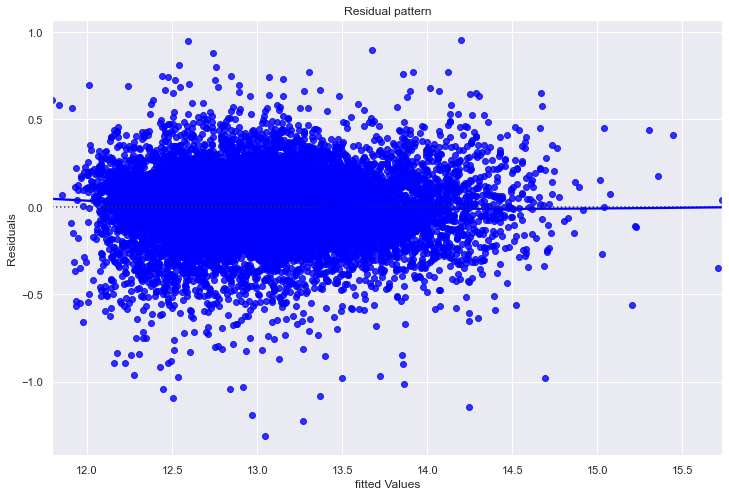

In [381]:
# let's plot the fitted values and  residuals
plt.figure(figsize=(12,8))
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="blue", lowess=True
)
plt.xlabel("fitted Values")
plt.ylabel("Residuals")
plt.title("Residual pattern")
plt.show()

**Observations:**
- We do not appreciate any pattern in the model, therefore, we can consider the residual independent and the model meet linearity requirements.

**TEST FOR NORMALITY**

- To check normality, we can use the Q-Q plot. It will not be an exact result, but it will be enough for us to conclude if the residuals follow a normal distribution in most cases.
- In this particular case we appreciate a straight line plot in the middle section but not in the extremes of the distribution.

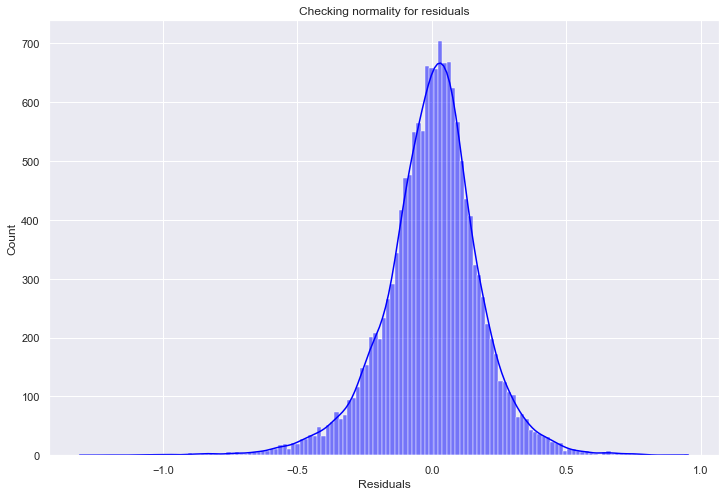

In [382]:

plt.figure(figsize=(12,8))
sns.histplot(data=df_pred, x="Residuals", kde=True, color='blue')
plt.title("Checking normality for residuals")
plt.show()


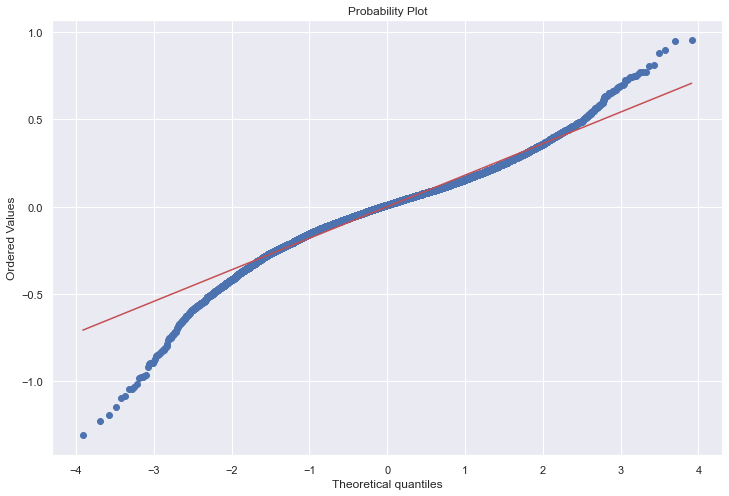

In [383]:

plt.figure(figsize=(12,8))
stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

- The histogram seems to show a normal distribution but the QQ plot is not conclusive so we are going to proceed with Shapiro test for normality.

In [384]:
# Let's try shapiro test for normality
from scipy import stats
stats.shapiro(olsmodel2.resid)

ShapiroResult(statistic=0.9677414894104004, pvalue=0.0)


- Since the p-value is 0 at 5% level of significance, we can say that the residuals are not normally distributed according to Shapiro test( to satisfy Shapiro test, we need p-value greater than the 0.05 level of significance).


**Observations:**

- Residuals are not following a straight line, it is very noticeable in the extremes but in the middle section the plot is almost straight.
- We cannot totally accept that the assumption of normality of residuals in the most strict sense but it is a good approximation.


**TEST FOR HOMOSCEDASTICITY: 'goldfeldquandt test'**

- The assumption of homoscedasticity refers to the same size of the error across the values of the predictors. In other words, Linear Regression assumes that for all the instances, the error will be the same and of very little variance.
- The goldfeldquandt test will tell us if the residuals are homoscedastic (If p-value is greater than 0.05)

In [385]:
# applying the  'goldfeldquandt test'

name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], x1_train8)
lzip(name, test)

[('F statistic', 0.9458282133123466), ('p-value', 0.9919643739161244)]


- p-value is greater than 0.05 so the residuals are homoscedastic.


    
**Obsrvations:**
    
- We can say that the assumptions of linear regression are met but not in the most strict sense because the residuals plot is not showing a normal distribution even though it is a good approximation.


# PART V: CHOOSING THE BEST MODEL.

## 1. Comparing models and model selection

In [386]:
#Creating data frame to show the performance resuls for training data set
models_train_comp_df = pd.concat( [Per_train.T, dtree_tuned_train.T, dtree_tuned2_train.T, rf_estimator_train.T, rf_tuned_train.T, rf_tuned2_train.T,
     rf_tuned3_train.T, xgb_estimator_train.T, XGB_tuned_train.T, XGB_tuned2_train.T,  lre_train.T, xgb_tuned_lr_train.T],
    axis=1)

models_train_comp_df.columns = [
    'Model dtree',
    'Model dtree_tuned',
    'Model dtree_tuned2',
    'Model rf_estimator ',
    'Model rf_tuned',
    'Model rf_tuned2',
    'Model rf_tuned3',
    'Model XGB_estimator',
    'Model XGB_tuned',
    'Model XGB_tuned2',
    'Model linear regression',
    'Model xgb_tuned_lr']


In [387]:
# Creating dataframe to show the performance results for all models on validations set

models_test_comp_df = pd.concat(
    [per_test.T,
     dtree_tuned_test.T, 
     dtree_tuned2_test.T,
     rf_estimator_test.T, 
     rf_tuned_test.T,
     rf_tuned2_test.T,
     rf_tuned3_test.T,
     xgb_estimator_test.T,
     XGB_tuned_test.T,
     XGB_tuned2_test.T,
     lre_test.T,
     xgb_tuned_lr_test.T], axis=1)


models_test_comp_df.columns = [
    'Model dtree',
    'Model dtree_tuned',
    'Model dtree_tuned2',
    'Model  rf_estimator',
    'Model rf_tuned ',
    'Model rf_tuned2 ',
    'Model rf_tuned3 ',
    'Model XGB_estimator',
    'Model XGB_tuned',
    'Model XGB_tuned2',
    'Model linear regression',
    'Model xgb_tuned_lr'
]


In [388]:
models_train_comp_df.T

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
Model dtree,0.00,0.00,1.00,1.00,0.00
Model dtree_tuned,0.27,0.20,0.74,0.74,1.57
Model dtree_tuned2,0.26,0.20,0.75,0.75,1.52
Model rf_estimator,0.07,0.05,0.98,0.98,0.36
Model rf_tuned,0.22,0.16,0.83,0.83,1.23
Model rf_tuned2,0.18,0.13,0.88,0.88,1.03
Model rf_tuned3,0.20,0.15,0.86,0.86,1.13
Model XGB_estimator,0.11,0.08,0.95,0.95,0.65
Model XGB_tuned,0.19,0.14,0.88,0.87,1.06
Model XGB_tuned2,0.18,0.14,0.88,0.88,1.04


In [389]:
models_test_comp_df.T

,RMSE,MAE,R-squared,Adj. R-squared,MAPE
Model dtree,0.25,0.18,0.77,0.77,1.38
Model dtree_tuned,0.28,0.21,0.72,0.71,1.62
Model dtree_tuned2,0.27,0.20,0.73,0.72,1.57
Model rf_estimator,0.18,0.13,0.89,0.88,0.97
Model rf_tuned,0.23,0.17,0.81,0.81,1.29
Model rf_tuned2,0.20,0.15,0.85,0.85,1.13
Model rf_tuned3,0.21,0.16,0.84,0.83,1.20
Model XGB_estimator,0.17,0.12,0.89,0.89,0.95
Model XGB_tuned,0.20,0.14,0.86,0.86,1.10
Model XGB_tuned2,0.19,0.14,0.87,0.86,1.08


**Observations:**

- The tuned models and the linear regression models are showing very similar performance.

- The linear regression model shows the best performance but as we could see, the model does not meet all the assumptions for linear regressions since the residuals do not follow a normal distribution in the strict sense. This model or xgb_tuned_lr cannot be considered because are based on linear regression models. The data in the extreme of the house price distribution will not be predicted with a significant error when compared to the values in the middle of the distribution.

- Considering the r2score and RMSE result, and the difference between the train and test data sets, we can conclude that Model XGB_tuned2	is our best model.



## 2. Best model  XGB_tuned2  features.

In [390]:
# importance of features in the tree building

print(pd.DataFrame(XGB_tuned2.feature_importances_, columns = ["Imp"], index = x_train.columns).sort_values(by = 'Imp', ascending = False)*100)

                                            Imp
quality                                   37.91
sight                                     14.10
living_measure15_log                       8.66
lat                                        5.54
ceil_measure_log                           4.52
room_bath                                  4.38
basement_scaled                            3.25
coast_1.0                                  1.93
room_bed                                   1.71
zipcode_98004.0                            1.65
lot_measure_log                            1.11
long                                       1.08
zipcode_98106.0                            1.06
ceil_1.5                                   1.05
reno_age                                   1.03
zipcode_98039.0                            0.91
zipcode_98023.0                            0.90
season_Spring                              0.89
zipcode_98112.0                            0.82
zipcode_98014.0                         

**Observations:**
    

In [391]:
#create dataframe to store the names and percentage weight of each feature imporatance
feature=pd.DataFrame(XGB_tuned2.feature_importances_, columns = ["Imp"], index = x_train.columns)*100

In [392]:
feature['predictor_name']=  x_train.columns

In [393]:
feature=feature.sort_values(by = 'Imp', ascending = False).reset_index()

In [394]:
feature.drop(['index'], axis=1, inplace=True)

In [395]:
# showing importances by weight  or contribution to the model
feature

,Imp,predictor_name
0,37.91,quality
1,14.10,sight
2,8.66,living_measure15_log
3,5.54,lat
4,4.52,ceil_measure_log
5,4.38,room_bath
6,3.25,basement_scaled
7,1.93,coast_1.0
8,1.71,room_bed
9,1.65,zipcode_98004.0


In [396]:
# Create funtion to plot barplot in features
def bar(data,  weight,predictor):
    """
    histogram
    data: dataframe
    predictor: dataframe column
    weight: contribution importance to the model of the variable

    """
    plt.figure(figsize=(12,18))
    sns.barplot(data=data, y=predictor, x=weight, palette="winter") 
    plt.title('Weight of each feature to the model in percentage', fontsize=18)
    plt.xticks(rotation=90, fontsize=18)
    plt.ylabel('Predictors', fontsize=16)
    plt.yticks(fontsize= 16 )
    plt.show()

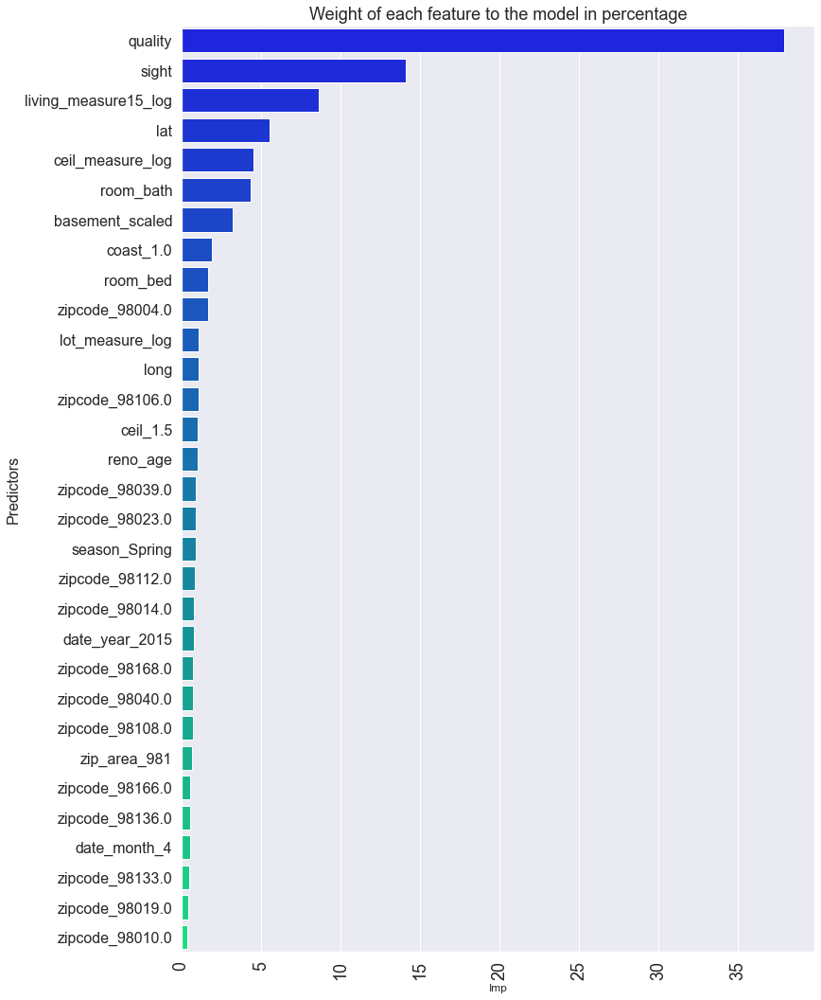

In [397]:
bar(data=feature[feature['Imp']>0], weight='Imp',predictor='predictor_name')

In [398]:
# Total number of initial variables
feature['predictor_name'].value_counts().sum()

145

In [399]:
# Number of variables or predictor relevant to the house price prediction model
feature[feature['Imp']>0].nunique()

Imp               31
predictor_name    31
dtype: int64

**Observations:**

- From the original 145 variables that we feed into the model, only 31 turned out to be relevant to the prediction model.

- Model XGB_tuned2's main variables with a weight above 1 percent are: 

    - Variable 'quality' is the biggest contributor to the model with 38 percent of the weight. As per our previous analysis, the better the quality the higher the price.
    
    - Sight is the second contributor to the model, with 14 percent of the weight. The greater number of visits the higher the price as well. Sometimes this can be due to bidding wars during the purchase process.
    
    - Living_measure15_log is an indicator of the living square footage in 2015, which it is an update of the living space variable, including any type of renovations. This variable is the third one in importance with close to 9 percent of the weight.
    - Latitude is the fourth variable contributing to the price prediction (5.5%). Latitude is referring to the location of the property. We could see how latitudes that 47.6 and 47.7 showed positive relation with price. When we put the mentioned latitude values in relation with longitude (which is the 12th feature in weight of importance for the model), which high values are around -122.2, the most expensive area seems to be Bellevue area.
    
    - The fifth variable in order of importance with a weight of 4.5% is the square footage of the living space without considering the basement.  As we can expect, the main living space it one of the most important features.
    
    - The number of bathrooms contributes to the model with a 4 percent of the weight. We found out that houses with greater number of bathrooms are more expensive.
    
    - The size of the basement is also an important feature, that contributes to the model with 3 percent of the weight.
    
    - Prices are affected by the proximity of the waterfront. So having a water view will increase the price of the houses. The water location factor will be contributing to the price with near 2 percent of the weight.
    
    - The number of bedrooms per house will also be positively related to the price of the property (1.7 percent of weight in the model).
    
    - Living in the zip code 98004, which belongs to the same place we referred previously, Bellevue downtown, as the most expensive (weight in the model for the zip code 98004 is 1.6 percent).
    
    - Lot_measure refers to the size of the property lot. The contribution to the importance is 1.1 percent.
    
    - Longitude in which the property is located (1 per cent in weight of importance). As we saw previously, the longitudes with higher prices are among values -122.4 and -122.2. Bellevue is located in this range of values.
    
    - Postcode 98106 belongs to Riverview-Delridge in king County. It is also related positively to the price and the weight in the model for this variable is near 1 percent. This area is also within the latitude and longitude range we have mentioned previously.
    
    - The number of levels of the house also have an impact in terms of the price (weight is 1 percent in the model).
    
    - The age of the renovation also affects the price of the house with a weight in the model of 1 percent.
    
- The rest of the variables' weight in the model is below 1 percent so as we mention, these variables do not affect the price as much as the ones listed above.


# PART VI: Business Recommendations

The main goal of this research is to successfully predict the house market prices in Seattle-Tacoma metro area and therefore, find out the main features that can affect the housing price in the area.

After a thorough analysis, we have found out that the model XBG_tuned2 is the one with best performance in both train and test set, with a r2 score of 88 and 87 respectively.

The main features according to the model that can influence the price are the quality of the property, the times that the house has been seen by potential customers, the square footage of the living area and basement, the location, specifically, the model showed Belleview and Riverview as the areas with higher prices. Both areas are close to the water which also was a major factor of house price increase. Number of bathrooms is also an important feature along with number of bedroom and levels of the house.

It is also important to note that the year in which the house was renovated affected the price. Also, the year in which the house was sold, 2015 seems to have registered higher prices. 
In terms of the best timing for purchase or sales, we can note that the model is letting us know that houses in Spring and, especially in April seems to register higher prices.

House price prediction it can be very useful when it comes to anticipate an economy recessions so especially big financial institutions and government agencies are continuously tracking the house market price changes. Builders and homeowners could benefit from predicting house prices as well.

- A building company or contractor would be better advised in terms of finding the most profitable area and using materials or designs that could increase the property price, above all in areas as Bellevue or Riverview. If they are trying to target a modest type buyer, builders should avoid high-quality materials and choose to build smaller apartments with one bathroom and no basement.

- A homeowner could anticipate the fair price of the property and avoid having the house in the market for long time. When the price is set up too high, the owner may have to face a significant price reduction, sometimes below the market price.

- For real estate agents and house buyers, this model could be very helpful in order to narrow the searching criteria from the beginning; if they are aware of the local house market behavior it would make the house searching process quicker and easier and it could help to save some time and money:

    - Clients with a modest budget, should focus on houses that have not been seen yet and further from the waterfront. Since Spring and specifically April is registering higher prices, waiting until winter to start the buying process will help them save some money.
    - In case of a more affluent type of client that is looking to invest their savings in a property, looking for a house located near the waterfront will always keep a positive house price tendency. High quality materials and areas like Bellevue are definitely good investments. Spacious properties with a great number of bathrooms and bedrooms in a well-located area will hold the asset’s value.

This model even though is showing good results, it is suitable of improvement. For Instance if we consider to create two two different predictive models, one for brand-new houses and other for second-hand houses, this approach could result into a much accurate model prediction.

Also, additional features could be added to our current data set such as school rating, amenities nearby, access to public transportation, walkability of the area, or average income of the neighborhood. By including the mentioned attributes in our model we will be able to improve our current model prediction power.
